# Linear Regression

## Import Library

In [1]:
import sys
sys.path.append('../../')

In [2]:
import datetime as dt
from dateutil.relativedelta import relativedelta
import os
import pandas as pd
# import pandas_datareader as pdr
import numpy as np
import quantstats as qs
from config.constants import *
from util.plot_equity import plot_equity_trades
import matplotlib.pyplot as plt

## Get Result

## Load results strategy Buy and Hold

In [3]:
benchmark_D1 = pd.read_csv(
    '../../out/Technical_Strategy/Buy_and_Hold/Backtest/result_D1.csv', index_col='Time', parse_dates=True)
benchmark_H4 = pd.read_csv(
    '../../out/Technical_Strategy/Buy_and_Hold/Backtest/result_H4.csv', index_col='Time', parse_dates=True)
benchmark_H1 = pd.read_csv(
    '../../out/Technical_Strategy/Buy_and_Hold/Backtest/result_H1.csv', index_col='Time', parse_dates=True)
benchmark_M30 = pd.read_csv(
    '../../out/Technical_Strategy/Buy_and_Hold/Backtest/result_M30.csv', index_col='Time', parse_dates=True)
benchmark_M15 = pd.read_csv(
    '../../out/Technical_Strategy/Buy_and_Hold/Backtest/result_M15.csv', index_col='Time', parse_dates=True)
benchmark_M5 = pd.read_csv(
    '../../out/Technical_Strategy/Buy_and_Hold/Backtest/result_M5.csv', index_col='Time', parse_dates=True)
benchmark_M1 = pd.read_csv(
    '../../out/Technical_Strategy/Buy_and_Hold/Backtest/result_M1.csv', index_col='Time', parse_dates=True)

## Load results Strategy

In [4]:
folder_strategy = 'Linear Regression'

### Data In Sample

In [5]:
result_D1_In_Sample = pd.read_csv(f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_D1_In_Sample.csv', index_col='Time', parse_dates=True)
result_H4_In_Sample = pd.read_csv(
    f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_H4_In_Sample.csv', index_col='Time', parse_dates=True)
result_H1_In_Sample = pd.read_csv(
    f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_H1_In_Sample.csv', index_col='Time', parse_dates=True)
result_M30_In_Sample = pd.read_csv(
    f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_M30_In_Sample.csv', index_col='Time', parse_dates=True)
result_M15_In_Sample = pd.read_csv(
    f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_M15_In_Sample.csv', index_col='Time', parse_dates=True)
result_M5_In_Sample = pd.read_csv(
    f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_M5_In_Sample.csv', index_col='Time', parse_dates=True)
result_M1_In_Sample = pd.read_csv(
    f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_M1_In_Sample.csv', index_col='Time', parse_dates=True)

C:\Users\Win10\AppData\Local\Temp\ipykernel_2172\1218350605.py:10: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  result_M5_In_Sample = pd.read_csv(
C:\Users\Win10\AppData\Local\Temp\ipykernel_2172\1218350605.py:12: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  result_M1_In_Sample = pd.read_csv(


### Data Out Sample

In [6]:
result_D1_Out_Sample = pd.read_csv(
    f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_D1_Out_Sample.csv', index_col='Time', parse_dates=True)
result_H4_Out_Sample = pd.read_csv(
    f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_H4_Out_Sample.csv', index_col='Time', parse_dates=True)
result_H1_Out_Sample = pd.read_csv(
    f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_H1_Out_Sample.csv', index_col='Time', parse_dates=True)
result_M30_Out_Sample = pd.read_csv(
    f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_M30_Out_Sample.csv', index_col='Time', parse_dates=True)
result_M15_Out_Sample = pd.read_csv(
    f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_M15_Out_Sample.csv', index_col='Time', parse_dates=True)
result_M5_Out_Sample = pd.read_csv(
    f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_M5_Out_Sample.csv', index_col='Time', parse_dates=True)
result_M1_Out_Sample = pd.read_csv(
    f'../../out/Machine_Learning/{folder_strategy}/Backtest/result_M1_Out_Sample.csv', index_col='Time', parse_dates=True)

## Define Strategy

# Reports each time frame

## TF D1

### In Sample

                           Strategy
-------------------------  ----------
Start Period               2007-01-02
End Period                 2019-12-31
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          8.76%
CAGR﹪                     0.45%

Sharpe                     0.3
Prob. Sharpe Ratio         88.37%
Smart Sharpe               0.3
Sortino                    0.41
Smart Sortino              0.41
Sortino/√2                 0.29
Smart Sortino/√2           0.29
Omega                      1.06

Max Drawdown               -7.6%
Longest DD Days            3053
Volatility (ann.)          1.79%
Calmar                     0.06
Skew                       -0.72
Kurtosis                   9.73

Expected Daily %           0.0%
Expected Monthly %         0.05%
Expected Yearly %          0.65%
Kelly Criterion            2.94%
Risk of Ruin               0.0%
Daily Value-at-Risk        -0.18%
Expected Shortfall (cVaR)  -0.18%

Max Consecutive Wins       11
Ma

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2011-08-23,2015-12-17,2019-12-31,3053,-7.597915,-7.425323
2,2008-03-17,2008-11-12,2009-09-15,548,-2.918071,-2.750047
3,2009-12-03,2010-02-08,2010-05-10,159,-1.486318,-1.460951
4,2010-12-07,2011-01-27,2011-02-28,84,-0.984818,-0.832128
5,2010-06-21,2010-07-27,2010-09-13,85,-0.908006,-0.896781


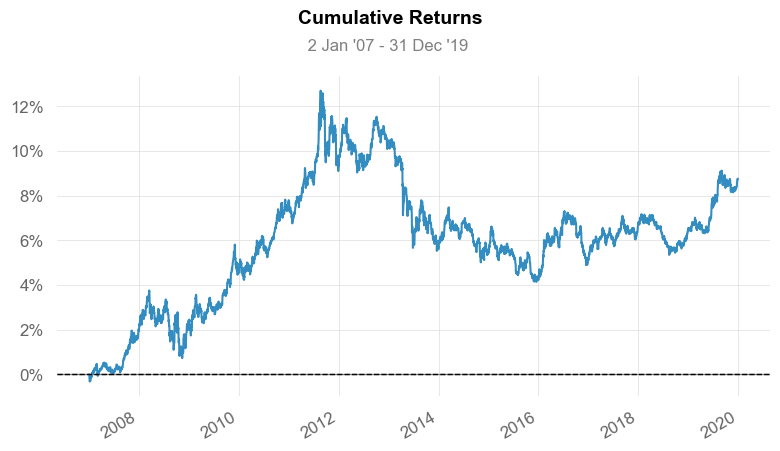

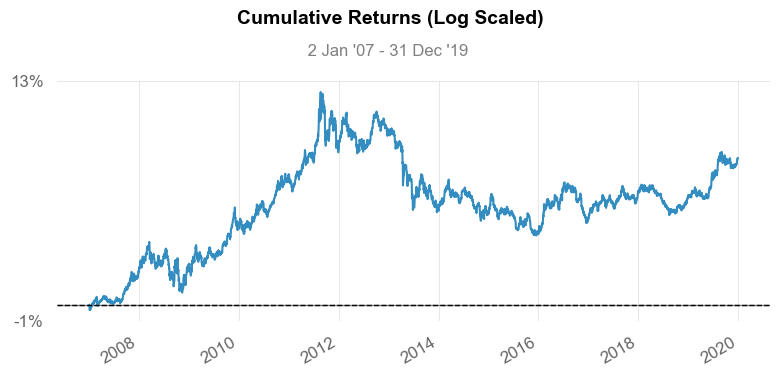

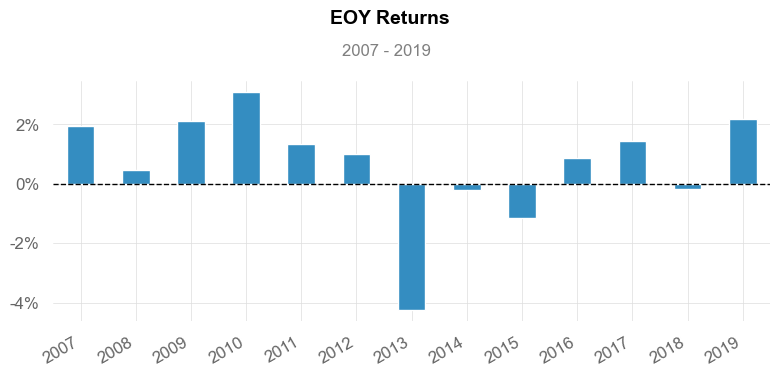

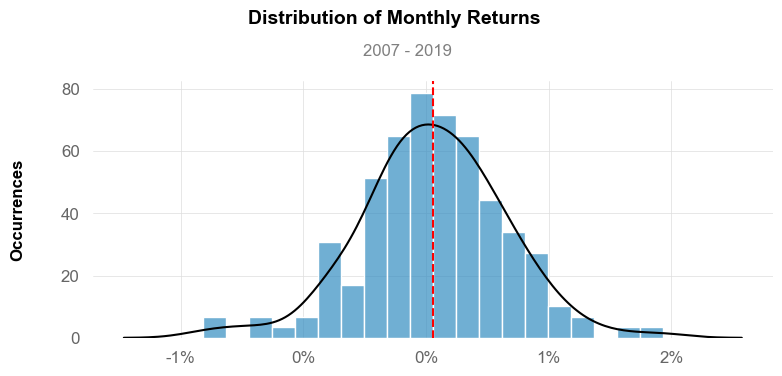

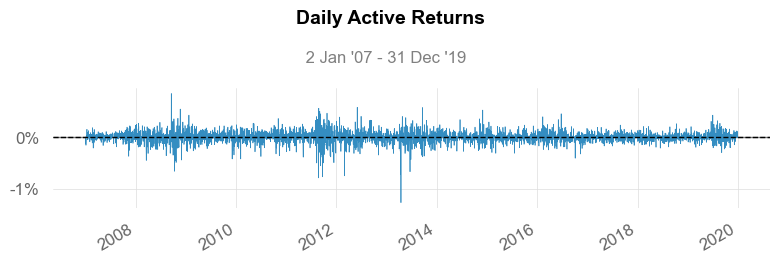

...

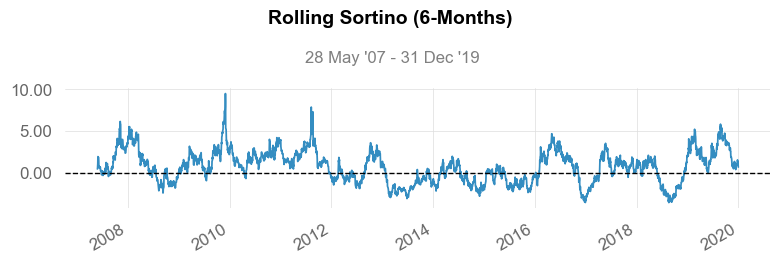

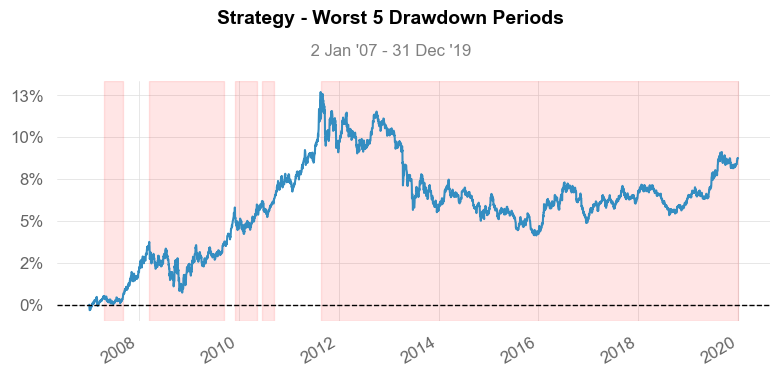

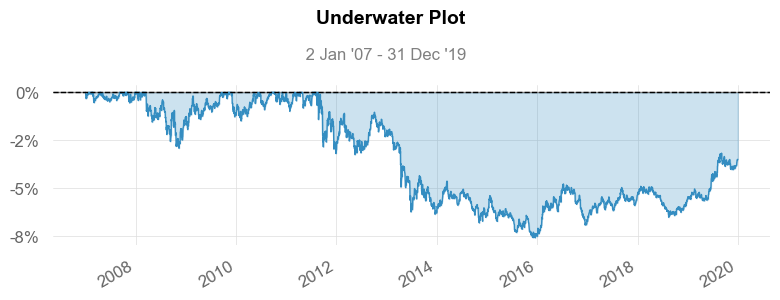

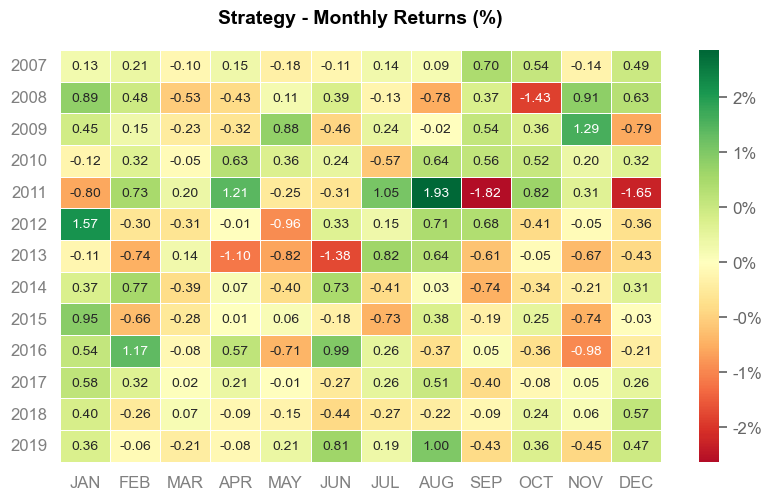

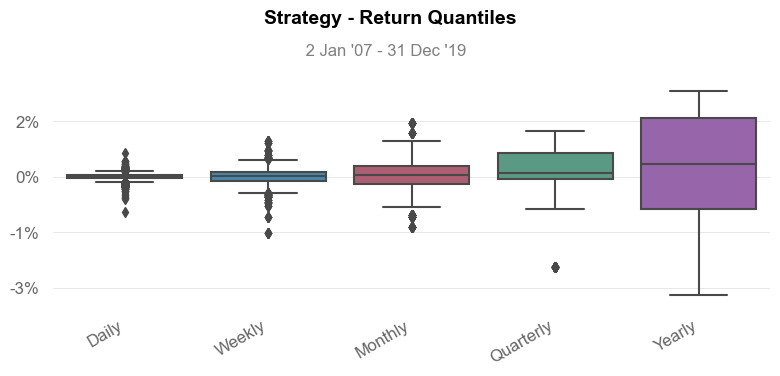

In [7]:
qs.reports.full(result_D1_In_Sample['Equity'].resample('D').last().dropna().pct_change())

### Out Sample

                           Strategy
-------------------------  ----------
Start Period               2020-01-02
End Period                 2023-03-10
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          3.02%
CAGR﹪                     0.65%

Sharpe                     0.31
Prob. Sharpe Ratio         72.73%
Smart Sharpe               0.3
Sortino                    0.42
Smart Sortino              0.41
Sortino/√2                 0.29
Smart Sortino/√2           0.29
Omega                      1.06

Max Drawdown               -4.2%
Longest DD Days            946
Volatility (ann.)          2.58%
Calmar                     0.15
Skew                       -0.69
Kurtosis                   5.12

Expected Daily %           0.0%
Expected Monthly %         0.08%
Expected Yearly %          0.75%
Kelly Criterion            2.95%
Risk of Ruin               0.0%
Daily Value-at-Risk        -0.26%
Expected Shortfall (cVaR)  -0.26%

Max Consecutive Wins       7
Max

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-08-07,2022-10-20,2023-03-10,946,-4.196812,-4.037516
2,2020-03-09,2020-03-19,2020-04-12,35,-2.249720,-2.051933
3,2020-02-24,2020-03-01,2020-03-04,10,-0.795842,-0.789528
4,2020-05-18,2020-06-07,2020-06-22,36,-0.751224,-0.716783
5,2020-01-08,2020-01-13,2020-02-17,41,-0.494540,-0.451623


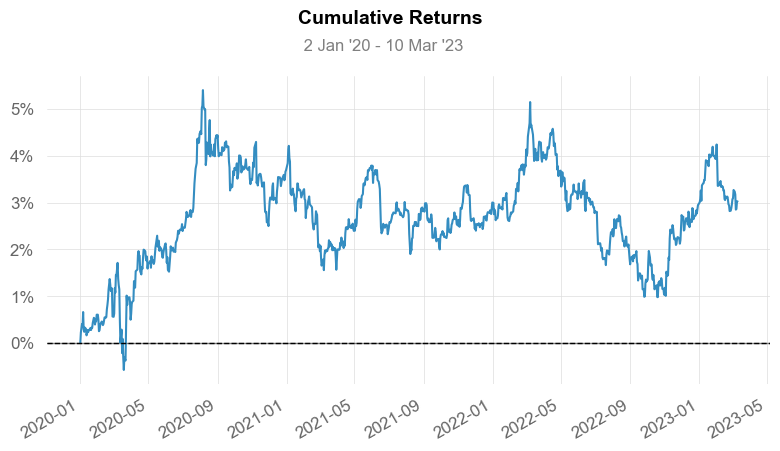

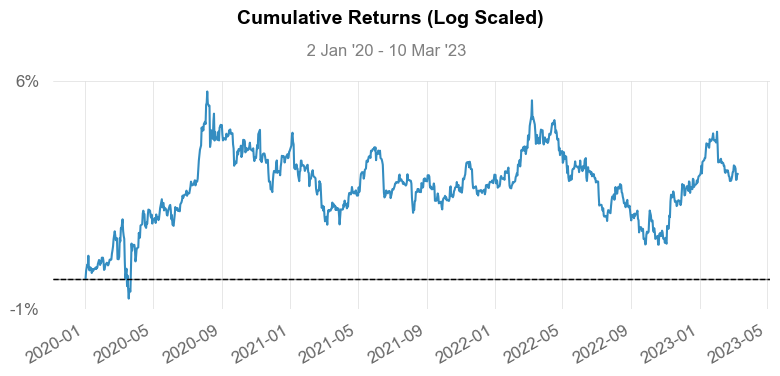

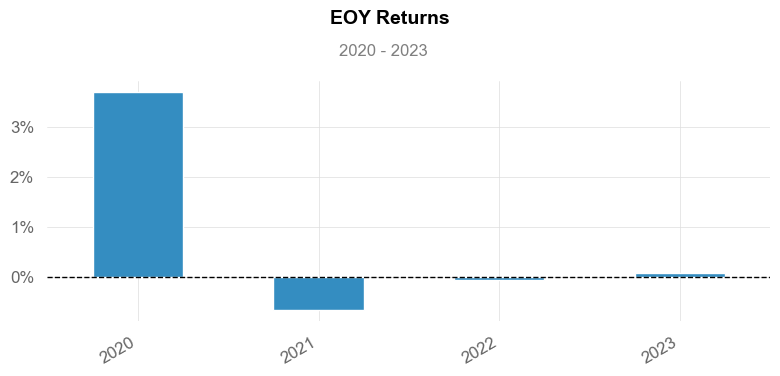

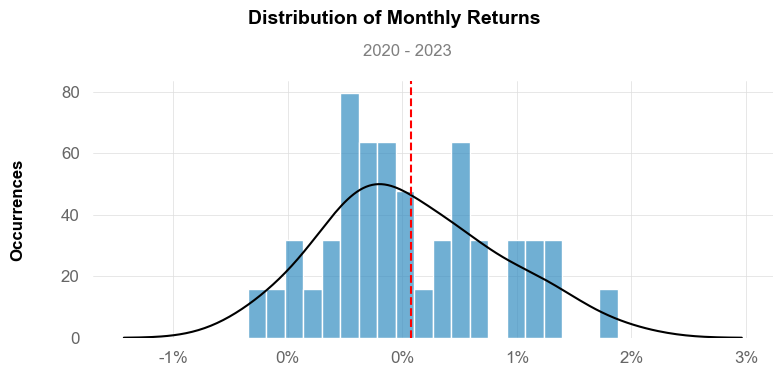

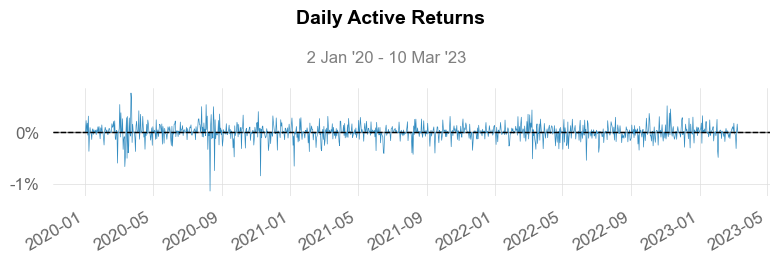

...

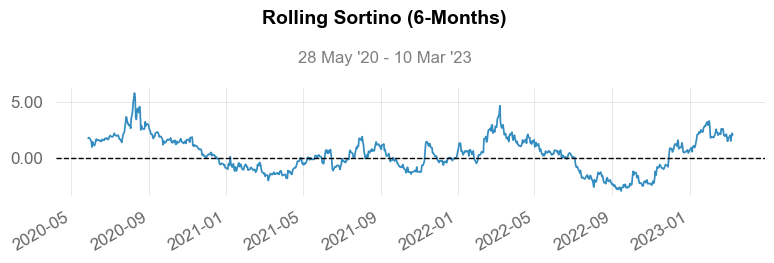

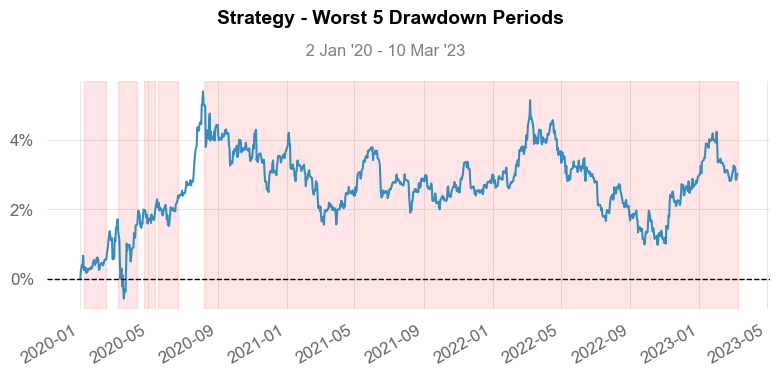

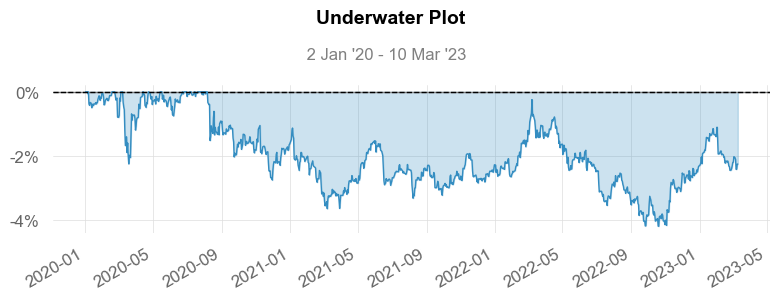

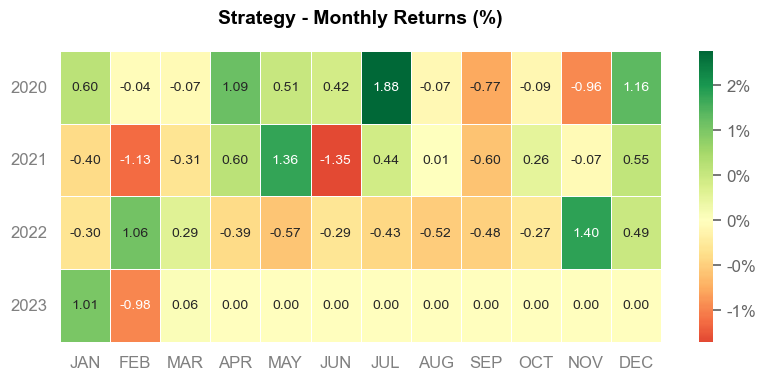

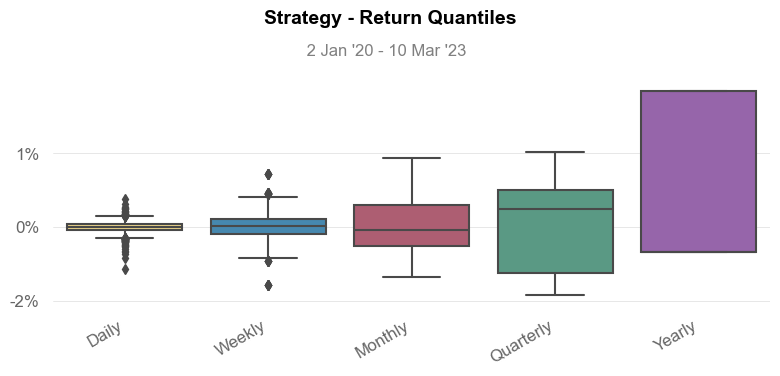

In [8]:
qs.reports.full(result_D1_Out_Sample['Equity'].resample('D').last().dropna().pct_change())

### Reports

### Compare benchmark Buy and Hold In Sample

In [9]:
benchmark_D1_In = benchmark_D1.loc[str(
    result_D1_In_Sample.index[0]):str(result_D1_In_Sample.index[-1])]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2007-01-03   2007-01-03
End Period                 2019-12-31   2019-12-31
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          8.78%        8.76%
CAGR﹪                     0.45%        0.45%

Sharpe                     0.3          0.3
Prob. Sharpe Ratio         88.43%       88.37%
Smart Sharpe               0.3          0.3
Sortino                    0.41         0.41
Smart Sortino              0.41         0.41
Sortino/√2                 0.29         0.29
Smart Sortino/√2           0.29         0.29
Omega                      1.06         1.06

Max Drawdown               -7.6%        -7.6%
Longest DD Days            3053         3053
Volatility (ann.)          1.79%        1.79%
R^2                        1.0          1.0
Information Ratio          -0.02        -0.02
Calmar                   

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2011-08-23,2015-12-17,2019-12-31,3053,-7.597915,-7.425323
2,2008-03-17,2008-11-12,2009-09-15,548,-2.918071,-2.750047
3,2009-12-03,2010-02-08,2010-05-10,159,-1.486318,-1.460951
4,2010-12-07,2011-01-27,2011-02-28,84,-0.984818,-0.832128
5,2010-06-21,2010-07-27,2010-09-13,85,-0.908006,-0.896781


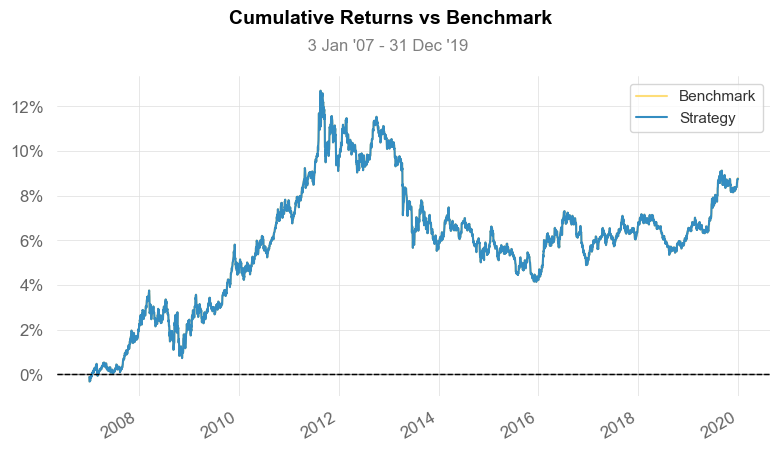

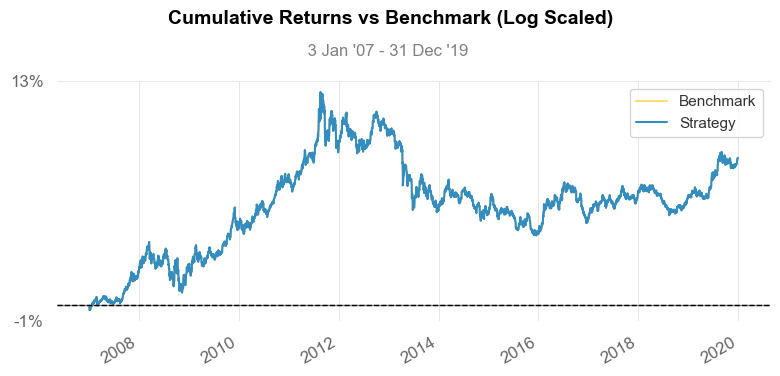

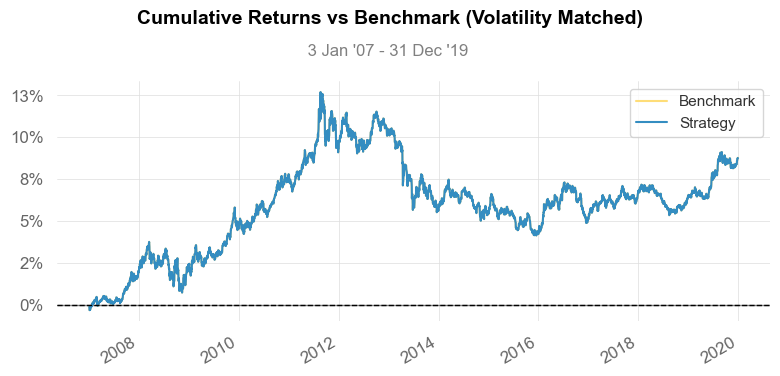

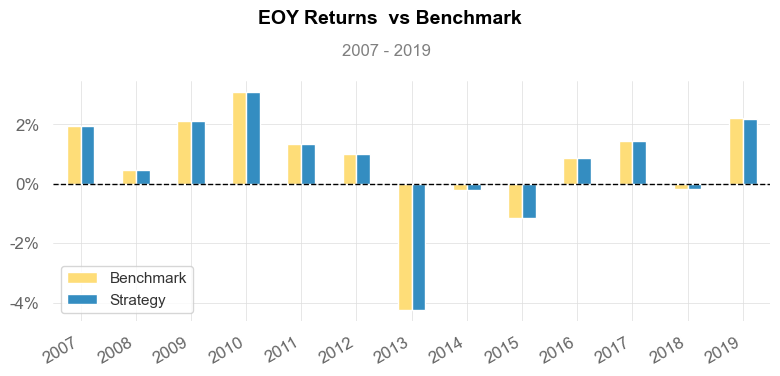

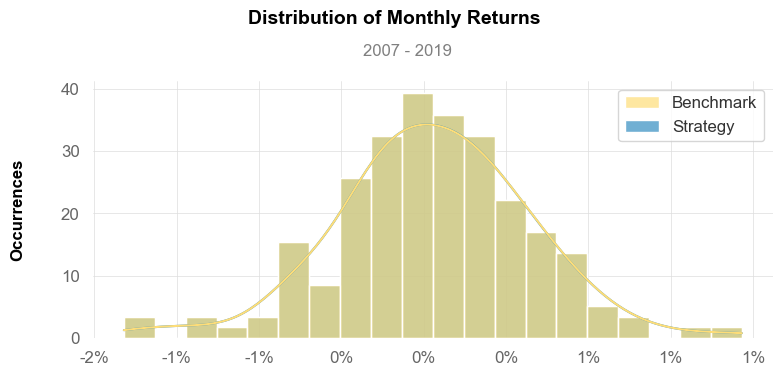

...

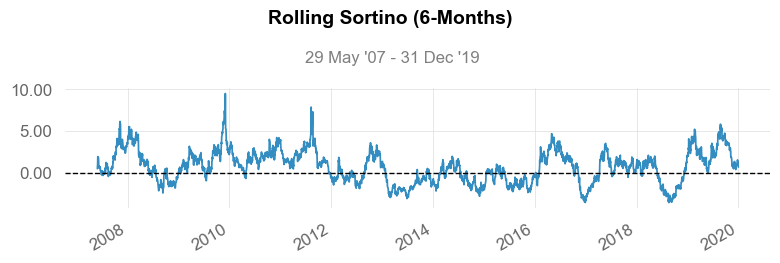

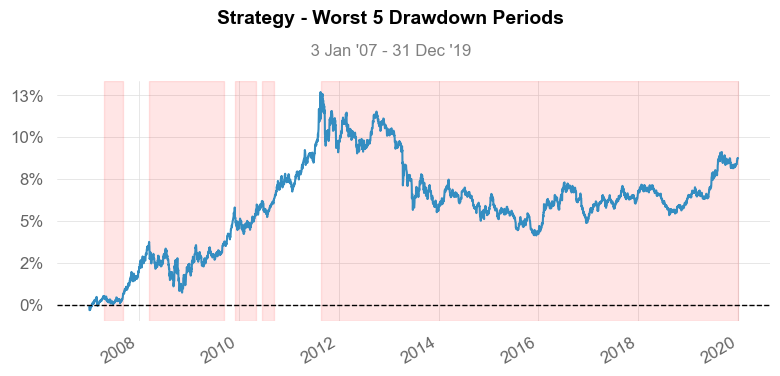

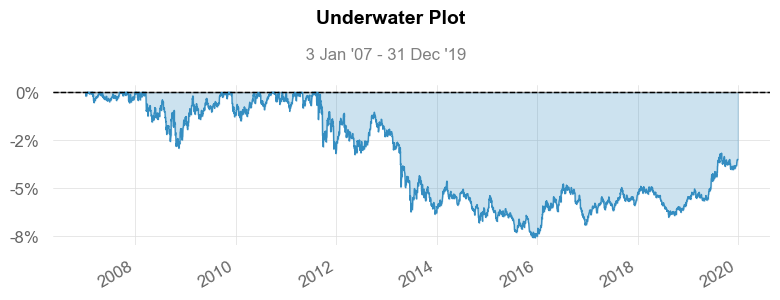

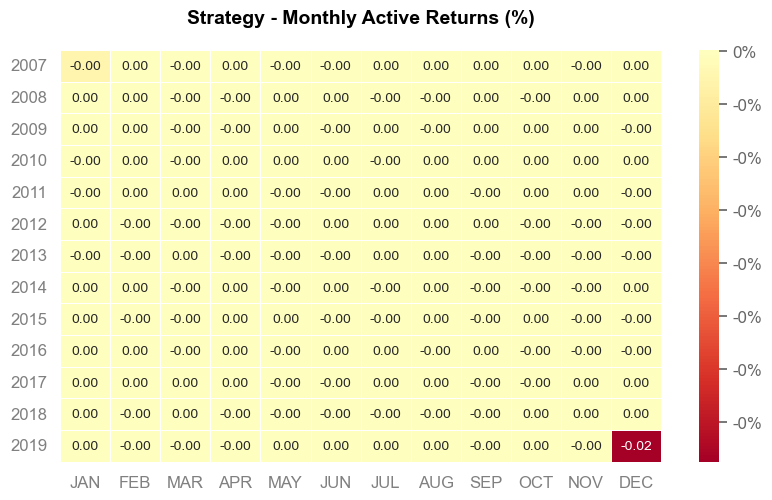

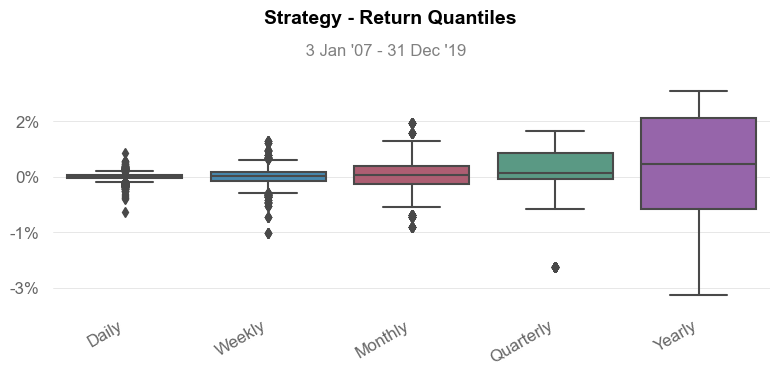

In [10]:
qs.reports.full(result_D1_In_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_D1_In['Equity'].resample('D').last().dropna().pct_change())

### Compare benchmark Buy and Hold Out Sample

In [11]:
benchmark_D1_Out = benchmark_D1.loc[str(
    result_D1_Out_Sample.index[0]):str(result_D1_Out_Sample.index[-1])]

In [12]:
benchmark_D1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5043 entries, 2007-01-01 to 2023-03-10
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Equity            5043 non-null   float64
 1   DrawdownPct       5043 non-null   float64
 2   DrawdownDuration  74 non-null     object 
 3   returns           5043 non-null   float64
dtypes: float64(3), object(1)
memory usage: 326.0+ KB


                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2020-01-03   2020-01-03
End Period                 2023-03-10   2023-03-10
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          2.78%        3.02%
CAGR﹪                     0.6%         0.65%

Sharpe                     0.31         0.31
Prob. Sharpe Ratio         72.67%       72.73%
Smart Sharpe               0.3          0.3
Sortino                    0.41         0.42
Smart Sortino              0.41         0.41
Sortino/√2                 0.29         0.29
Smart Sortino/√2           0.29         0.29
Omega                      1.06         1.06

Max Drawdown               -3.87%       -4.2%
Longest DD Days            946          946
Volatility (ann.)          2.37%        2.58%
R^2                        1.0          1.0
Information Ratio          0.02         0.02
Calmar                    

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-08-07,2022-10-20,2023-03-10,946,-4.196812,-4.037516
2,2020-03-09,2020-03-19,2020-04-12,35,-2.249720,-2.051933
3,2020-02-24,2020-03-01,2020-03-04,10,-0.795842,-0.789528
4,2020-05-18,2020-06-07,2020-06-22,36,-0.751224,-0.716783
5,2020-01-08,2020-01-13,2020-02-17,41,-0.494540,-0.451623


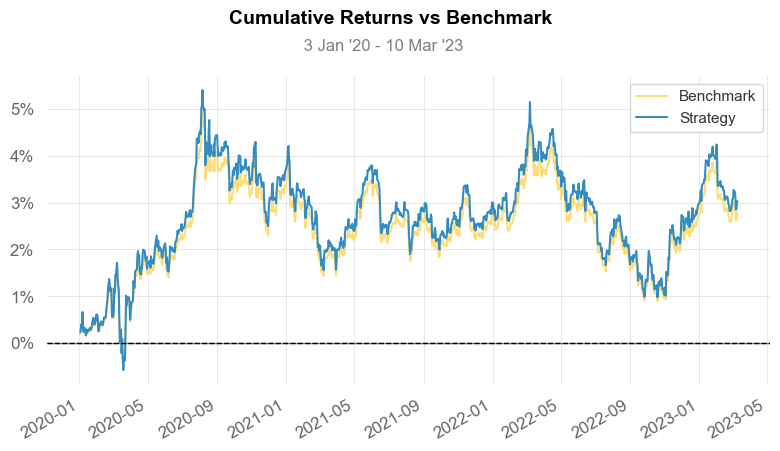

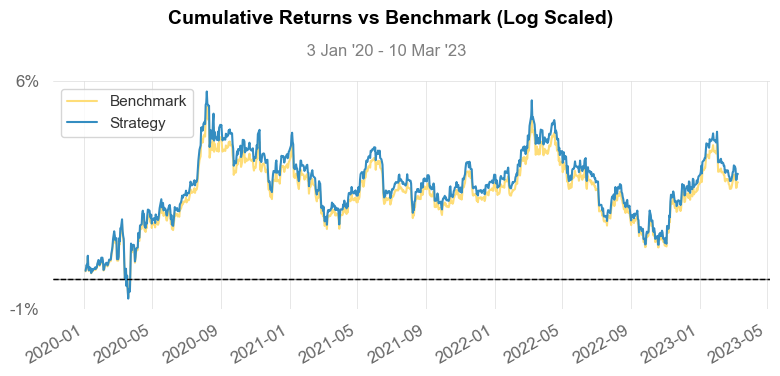

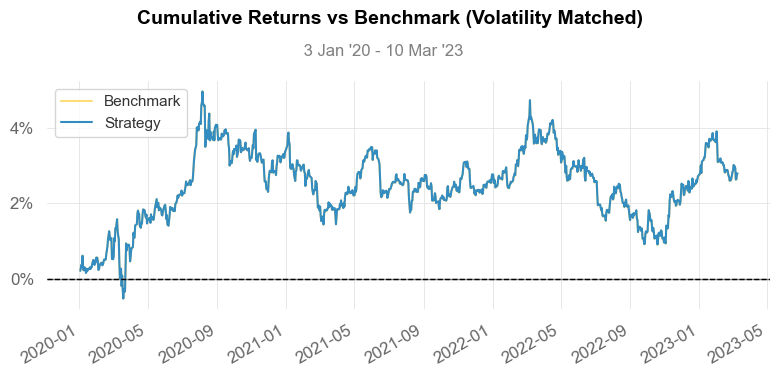

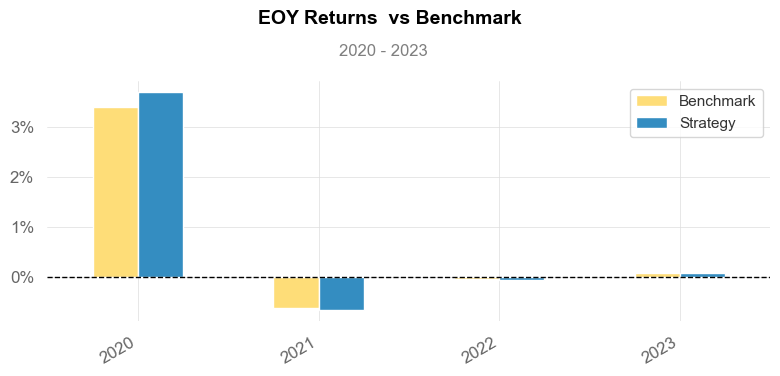

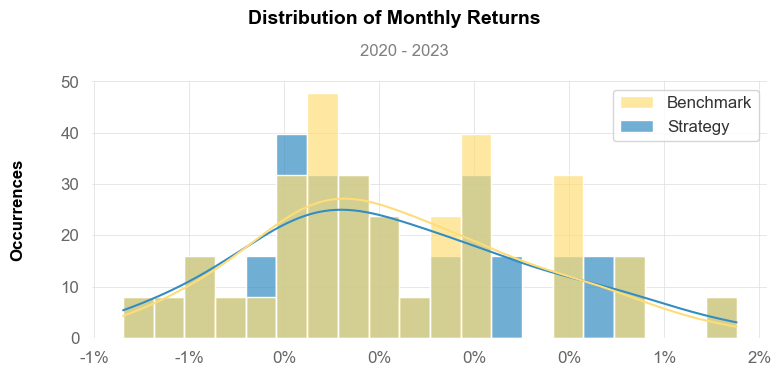

...

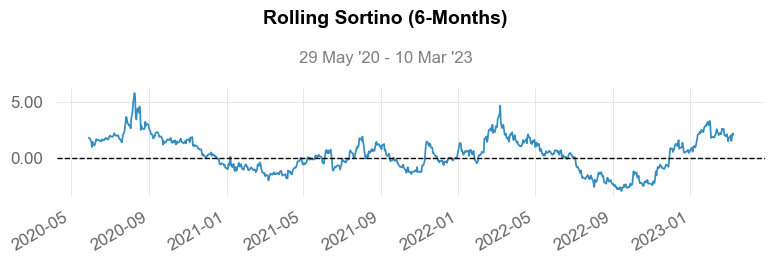

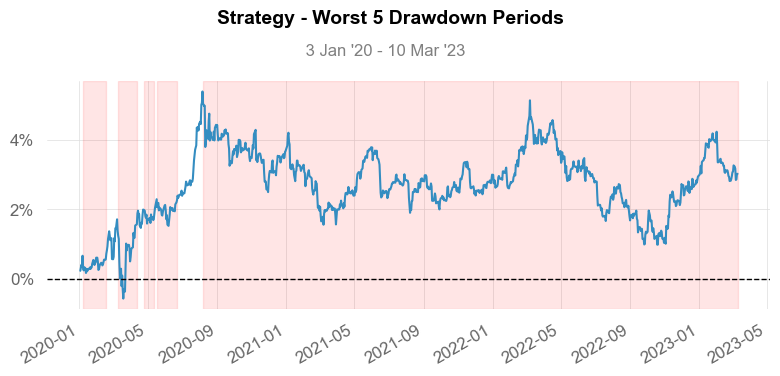

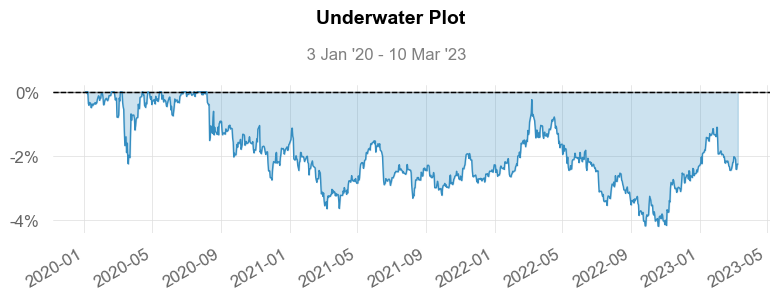

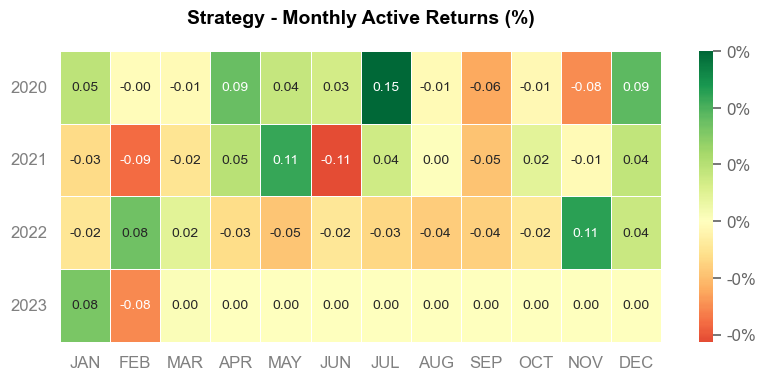

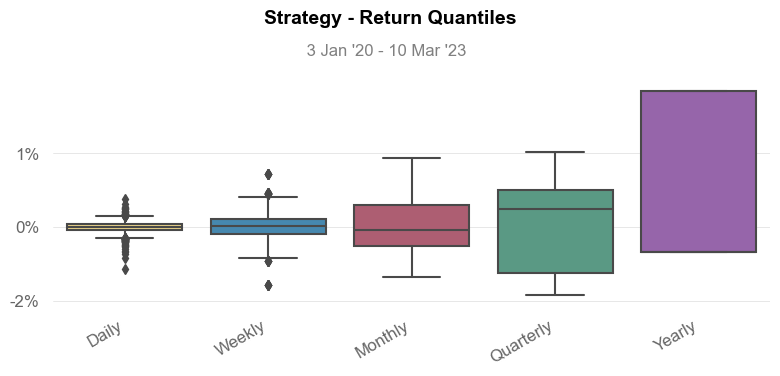

In [13]:
qs.reports.full(result_D1_Out_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_D1_Out['Equity'].resample('D').last().dropna().pct_change())

## TF H4

### In Sample

                           Strategy
-------------------------  ----------
Start Period               2007-01-02
End Period                 2019-12-31
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          8.84%
CAGR﹪                     0.45%

Sharpe                     0.3
Prob. Sharpe Ratio         88.58%
Smart Sharpe               0.3
Sortino                    0.41
Smart Sortino              0.41
Sortino/√2                 0.29
Smart Sortino/√2           0.29
Omega                      1.06

Max Drawdown               -7.6%
Longest DD Days            3053
Volatility (ann.)          1.79%
Calmar                     0.06
Skew                       -0.72
Kurtosis                   9.73

Expected Daily %           0.0%
Expected Monthly %         0.05%
Expected Yearly %          0.65%
Kelly Criterion            2.96%
Risk of Ruin               0.0%
Daily Value-at-Risk        -0.18%
Expected Shortfall (cVaR)  -0.18%

Max Consecutive Wins       11
Ma

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2011-08-23,2015-12-17,2019-12-31,3053,-7.595725,-7.423182
2,2008-03-17,2008-11-12,2009-09-15,548,-2.917158,-2.749186
3,2009-12-03,2010-02-08,2010-05-10,159,-1.485862,-1.460503
4,2010-12-07,2011-01-27,2011-02-28,84,-0.984521,-0.831878
5,2010-06-21,2010-07-27,2010-09-13,85,-0.907728,-0.896507


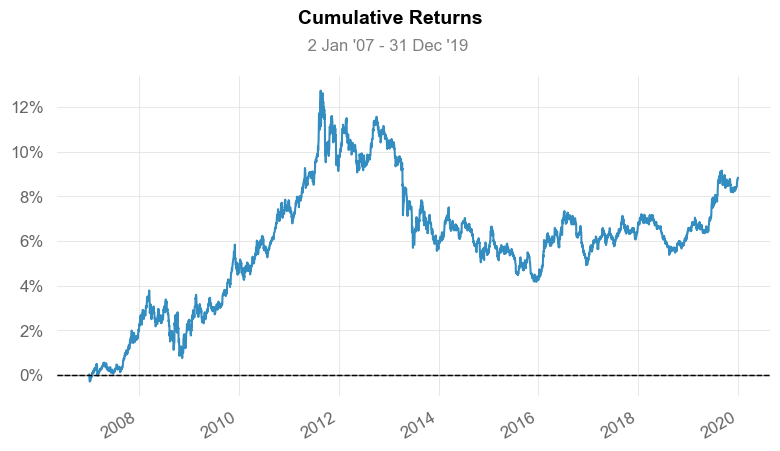

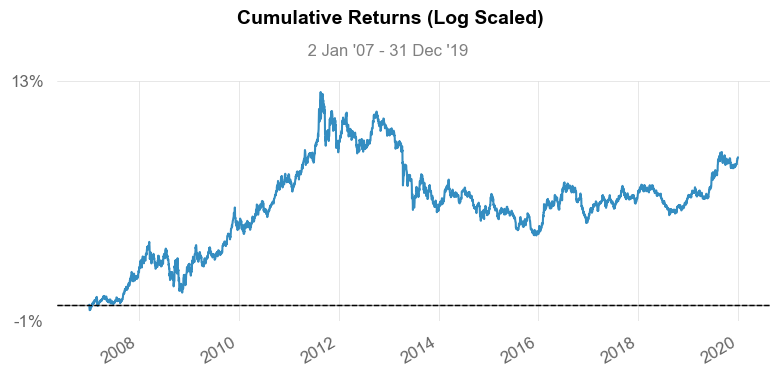

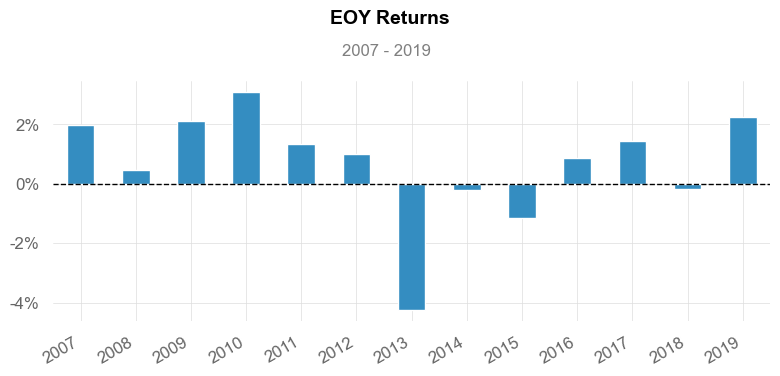

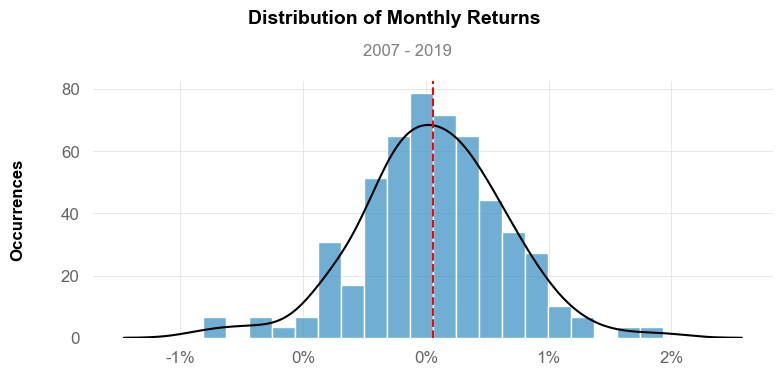

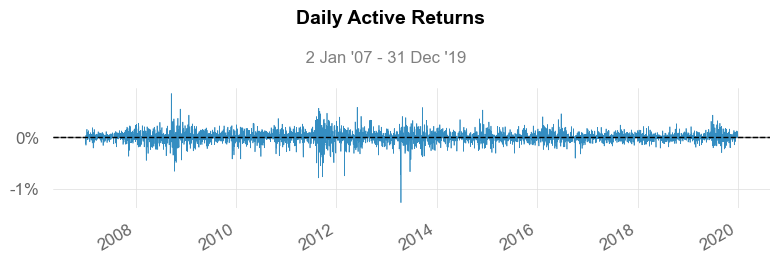

...

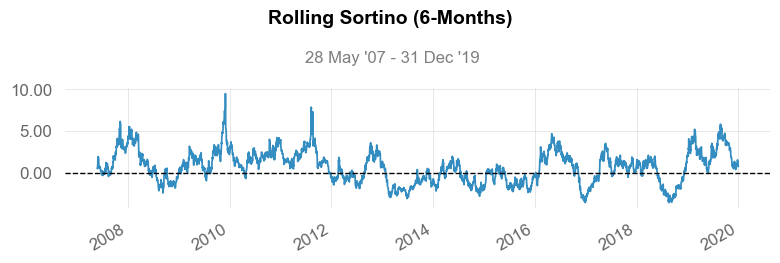

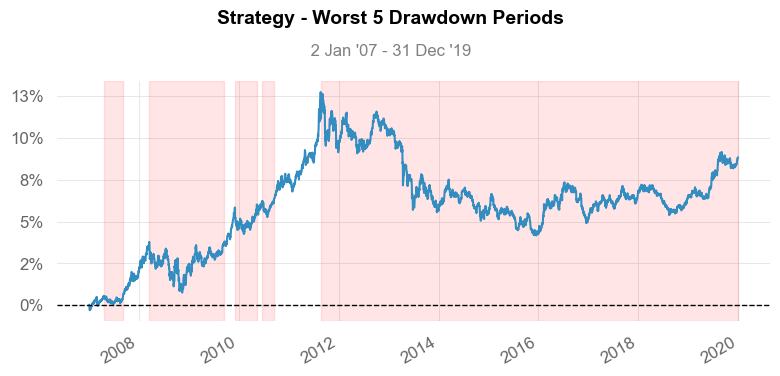

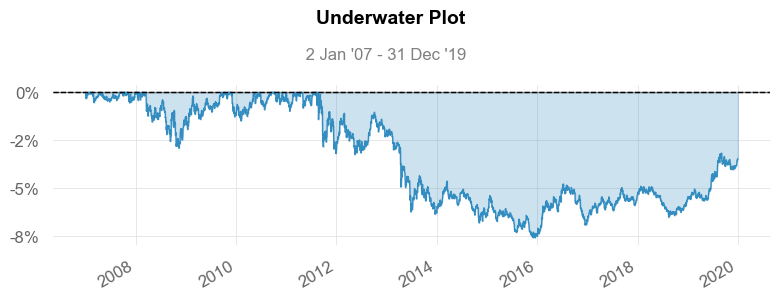

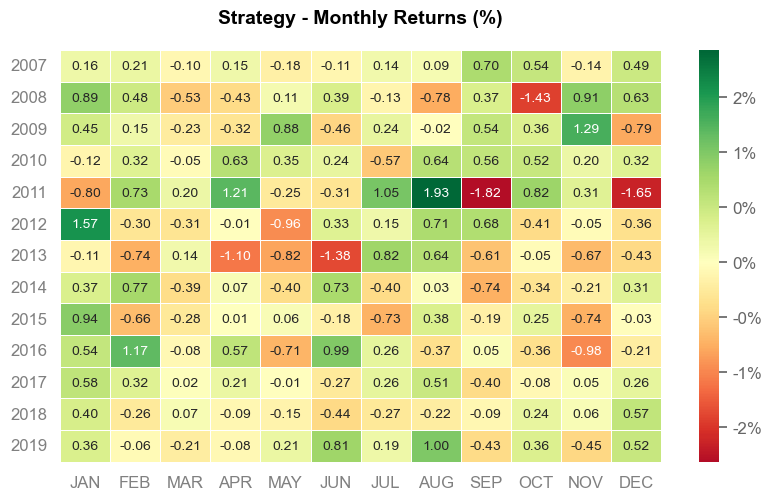

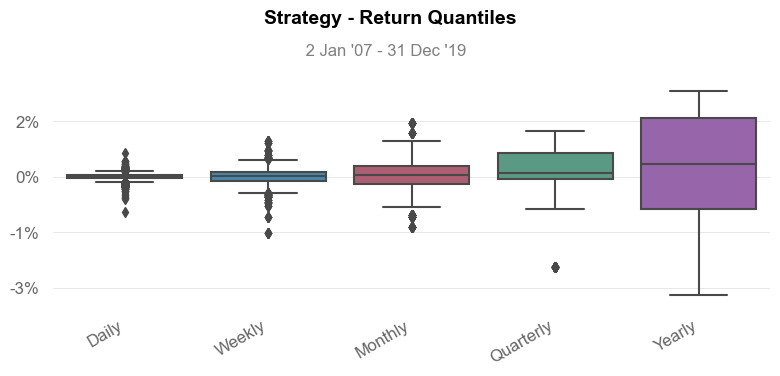

In [14]:
qs.reports.full(result_H4_In_Sample['Equity'].resample('D').last().dropna().pct_change())

### Out Sample

                           Strategy
-------------------------  ----------
Start Period               2020-01-02
End Period                 2023-03-10
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          3.42%
CAGR﹪                     0.73%

Sharpe                     0.35
Prob. Sharpe Ratio         75.14%
Smart Sharpe               0.34
Sortino                    0.47
Smart Sortino              0.47
Sortino/√2                 0.33
Smart Sortino/√2           0.33
Omega                      1.07

Max Drawdown               -4.19%
Longest DD Days            946
Volatility (ann.)          2.58%
Calmar                     0.17
Skew                       -0.69
Kurtosis                   5.08

Expected Daily %           0.0%
Expected Monthly %         0.09%
Expected Yearly %          0.85%
Kelly Criterion            3.3%
Risk of Ruin               0.0%
Daily Value-at-Risk        -0.26%
Expected Shortfall (cVaR)  -0.26%

Max Consecutive Wins       7
Ma

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-08-07,2022-10-20,2023-03-10,946,-4.193448,-4.034280
2,2020-03-09,2020-03-19,2020-04-12,35,-2.247851,-2.050229
3,2020-02-24,2020-03-01,2020-03-04,10,-0.795179,-0.788870
4,2020-05-18,2020-06-07,2020-06-22,36,-0.750603,-0.716191
5,2020-01-08,2020-01-13,2020-02-17,41,-0.494125,-0.451244


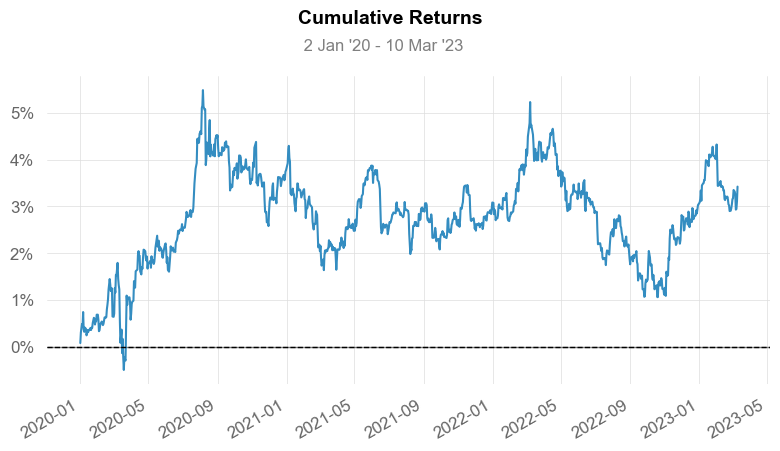

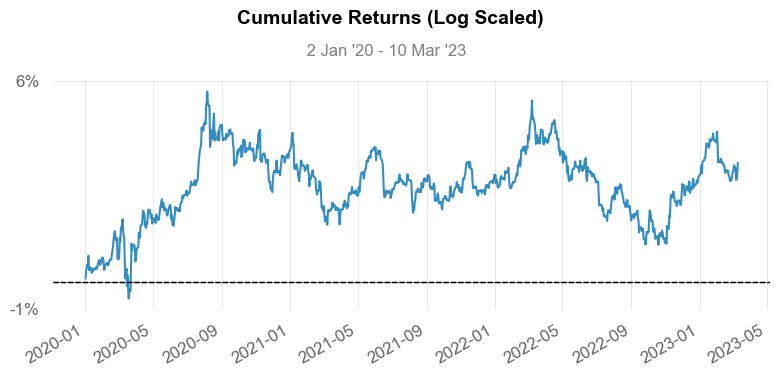

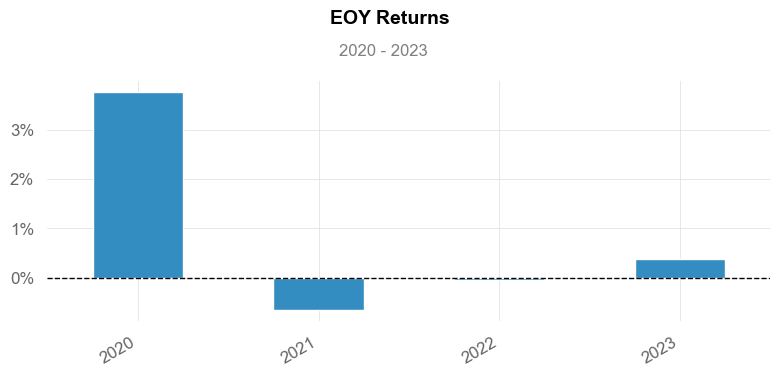

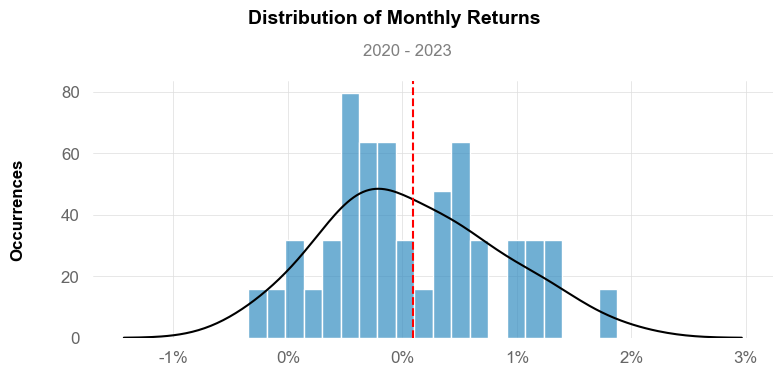

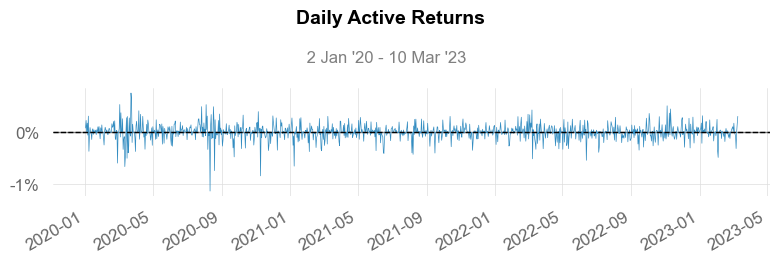

...

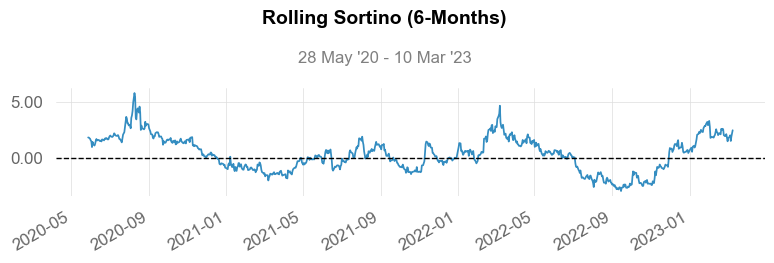

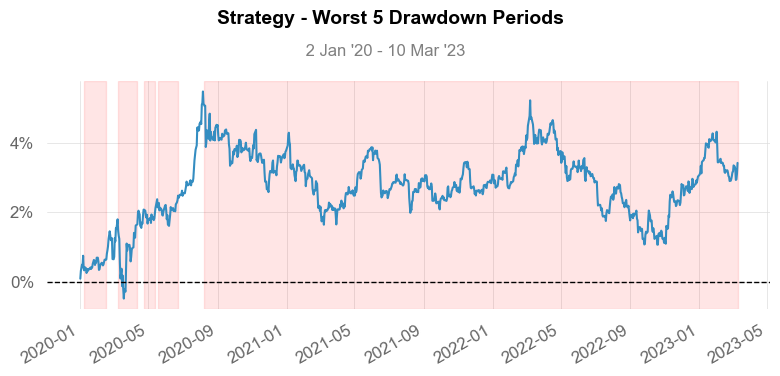

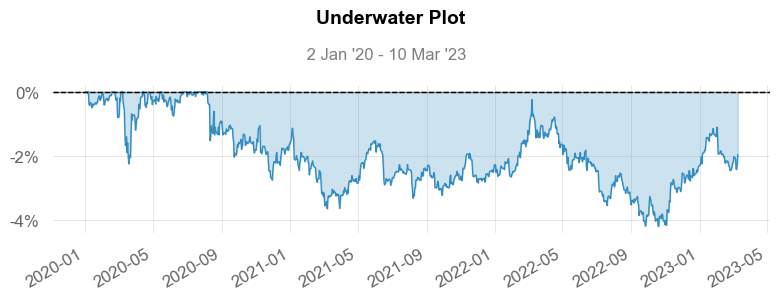

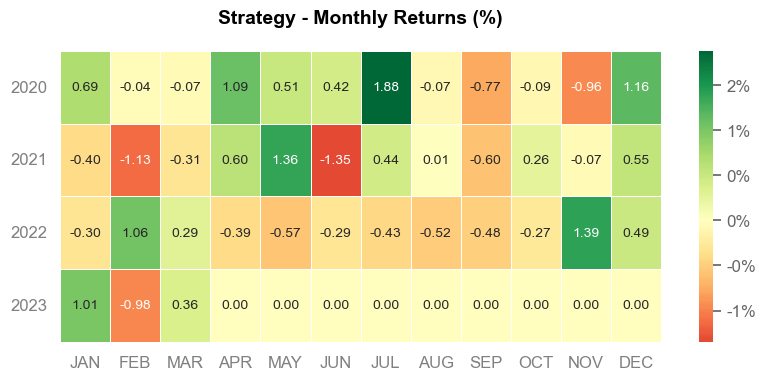

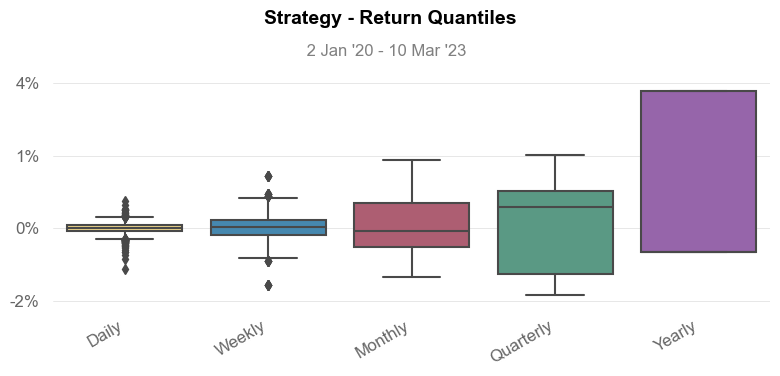

In [15]:
qs.reports.full(result_H4_Out_Sample['Equity'].resample('D').last().dropna().pct_change())

### Reports

### Compare benchmark Buy and Hold In Sample

In [16]:
benchmark_H4_In = benchmark_H4.loc[str(
    result_H4_In_Sample.index[0]):str(result_H4_In_Sample.index[-1])]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2007-01-03   2007-01-03
End Period                 2019-12-31   2019-12-31
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          8.77%        8.8%
CAGR﹪                     0.45%        0.45%

Sharpe                     0.3          0.3
Prob. Sharpe Ratio         88.43%       88.49%
Smart Sharpe               0.3          0.3
Sortino                    0.41         0.41
Smart Sortino              0.41         0.41
Sortino/√2                 0.29         0.29
Smart Sortino/√2           0.29         0.29
Omega                      1.06         1.06

Max Drawdown               -7.6%        -7.6%
Longest DD Days            3053         3053
Volatility (ann.)          1.79%        1.79%
R^2                        1.0          1.0
Information Ratio          0.02         0.02
Calmar                     

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2011-08-23,2015-12-17,2019-12-31,3053,-7.595725,-7.423182
2,2008-03-17,2008-11-12,2009-09-15,548,-2.917158,-2.749186
3,2009-12-03,2010-02-08,2010-05-10,159,-1.485862,-1.460503
4,2010-12-07,2011-01-27,2011-02-28,84,-0.984521,-0.831878
5,2010-06-21,2010-07-27,2010-09-13,85,-0.907728,-0.896507


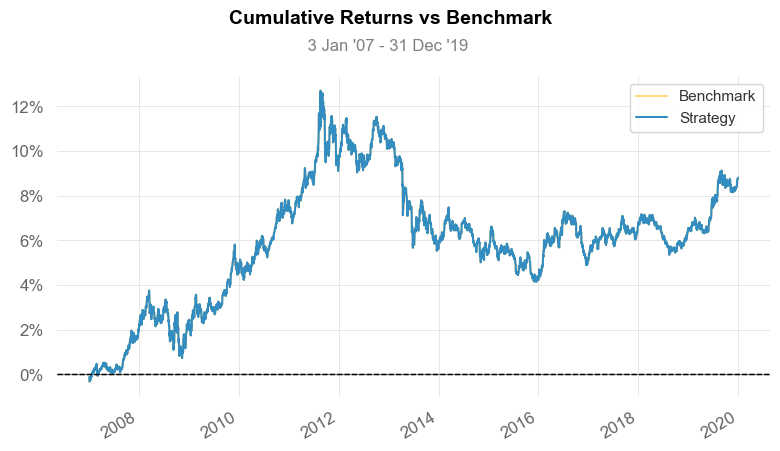

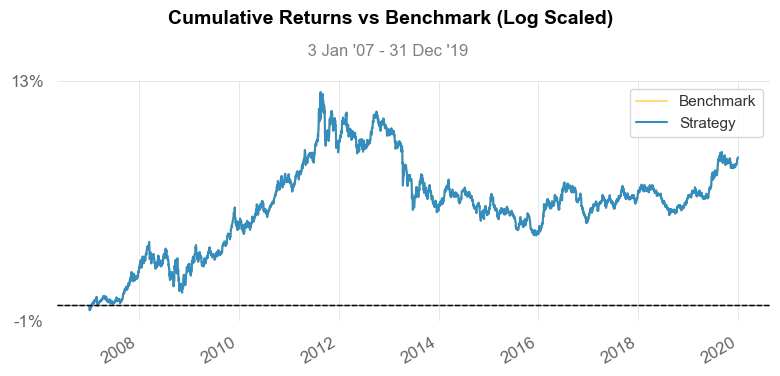

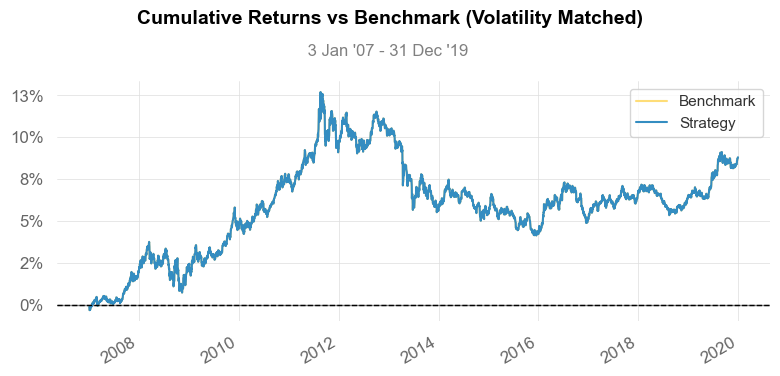

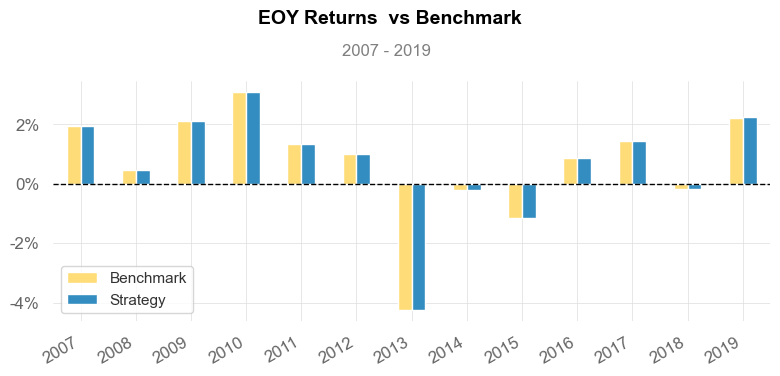

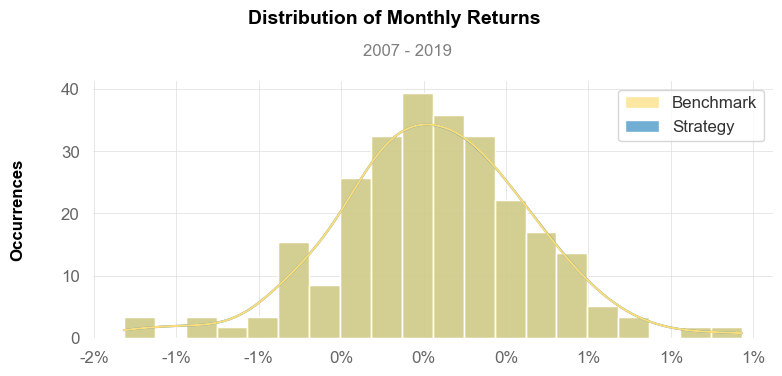

...

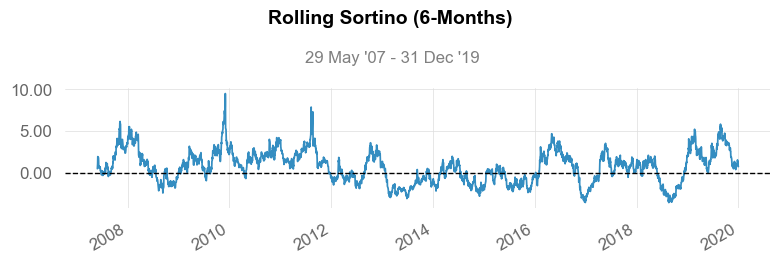

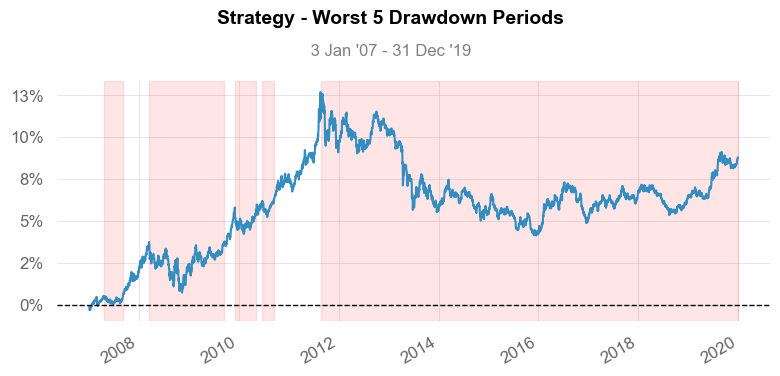

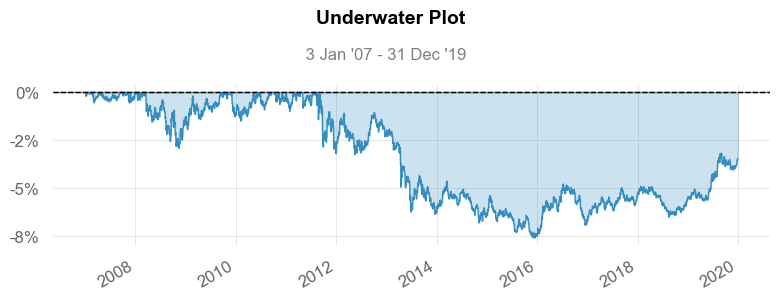

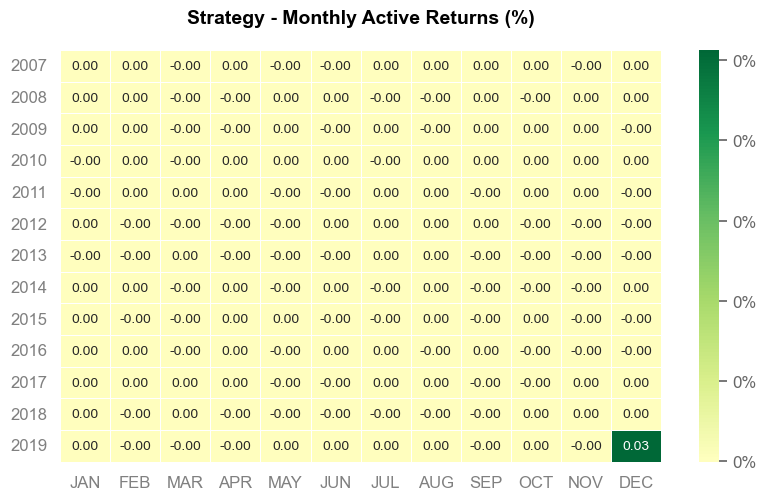

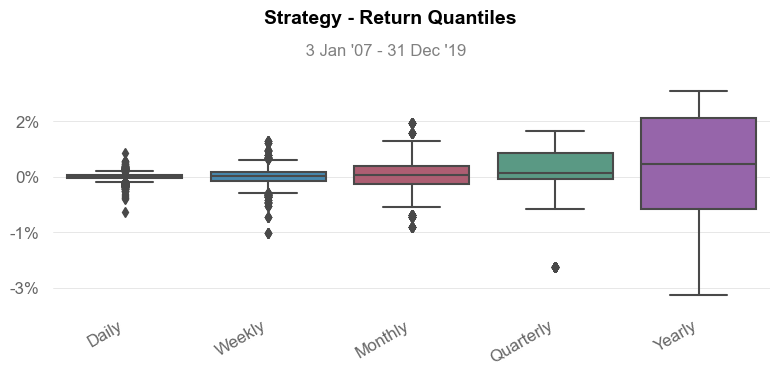

In [17]:
qs.reports.full(result_H4_In_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_H4_In['Equity'].resample('D').last().dropna().pct_change())

### Compare benchmark Buy and Hold Out Sample

In [18]:
benchmark_H4_Out = benchmark_H4.loc[str(
    result_H4_Out_Sample.index[0]):str(result_H4_Out_Sample.index[-1])]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2020-01-03   2020-01-03
End Period                 2023-03-10   2023-03-10
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          3.07%        3.34%
CAGR﹪                     0.66%        0.72%

Sharpe                     0.34         0.34
Prob. Sharpe Ratio         74.56%       74.64%
Smart Sharpe               0.33         0.33
Sortino                    0.46         0.46
Smart Sortino              0.45         0.45
Sortino/√2                 0.32         0.32
Smart Sortino/√2           0.32         0.32
Omega                      1.06         1.06

Max Drawdown               -3.87%       -4.19%
Longest DD Days            946          946
Volatility (ann.)          2.37%        2.58%
R^2                        1.0          1.0
Information Ratio          0.02         0.02
Calmar                  

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-08-07,2022-10-20,2023-03-10,946,-4.193448,-4.034280
2,2020-03-09,2020-03-19,2020-04-12,35,-2.247851,-2.050229
3,2020-02-24,2020-03-01,2020-03-04,10,-0.795179,-0.788870
4,2020-05-18,2020-06-07,2020-06-22,36,-0.750603,-0.716191
5,2020-01-08,2020-01-13,2020-02-17,41,-0.494125,-0.451244


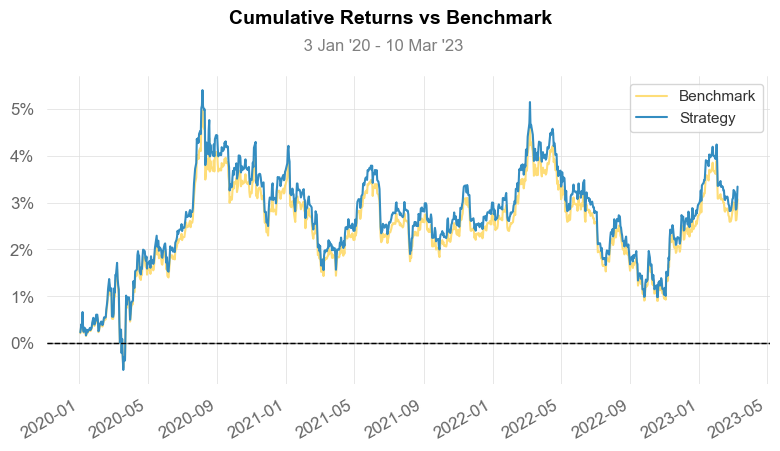

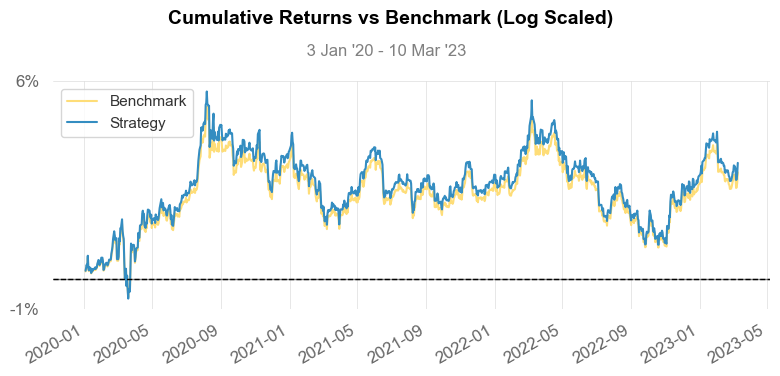

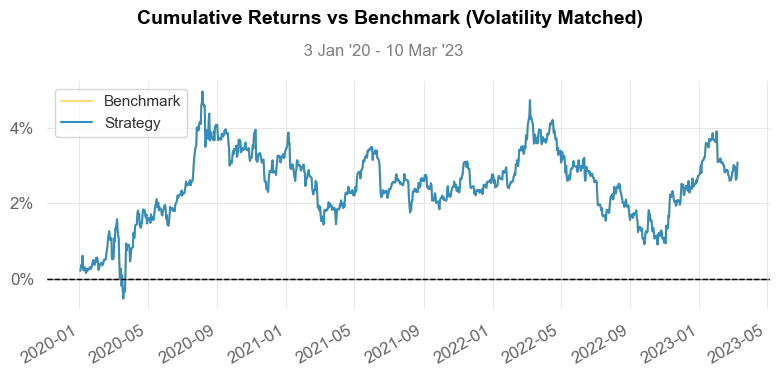

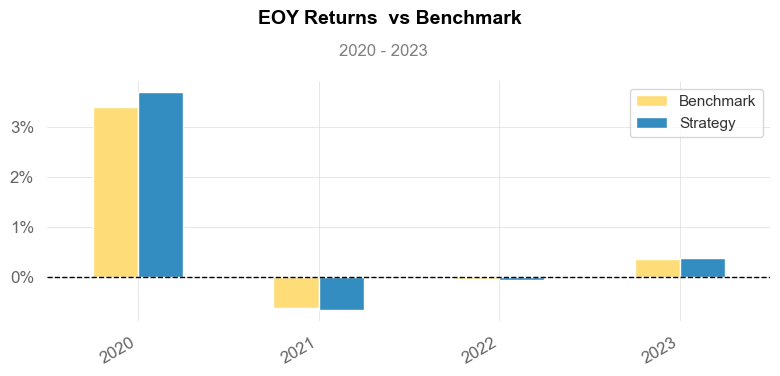

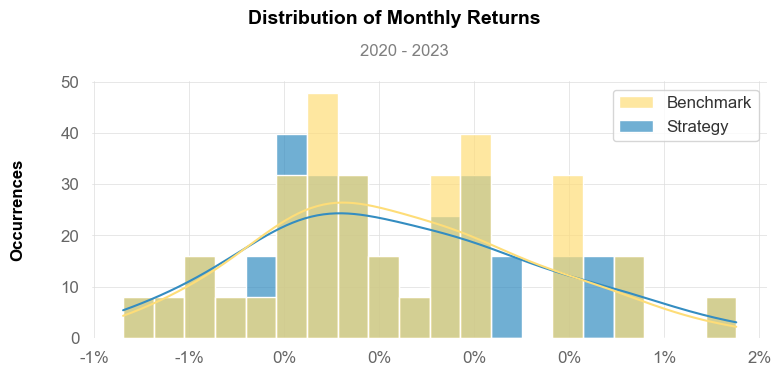

...

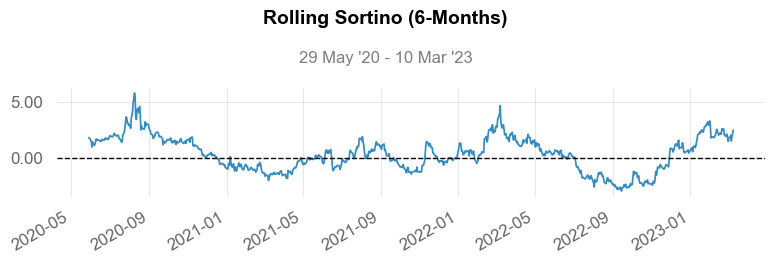

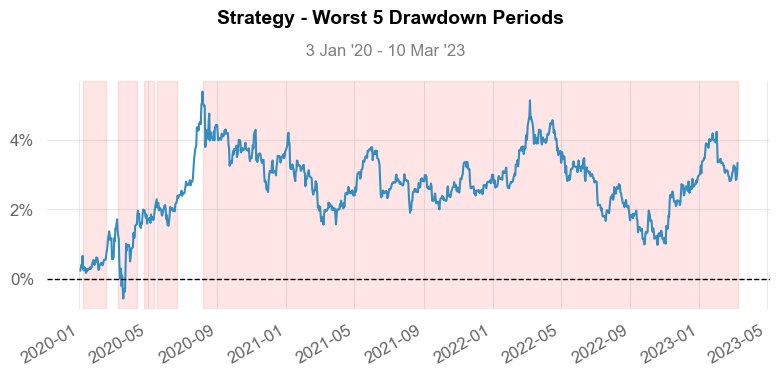

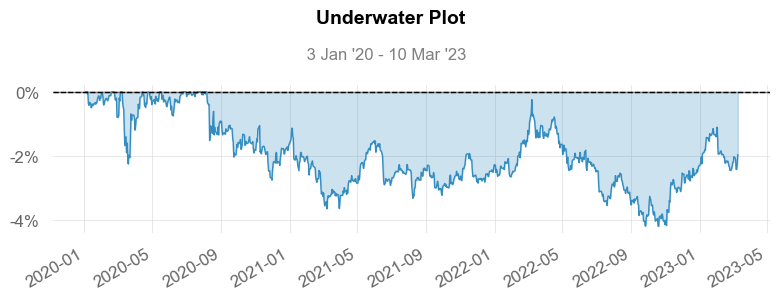

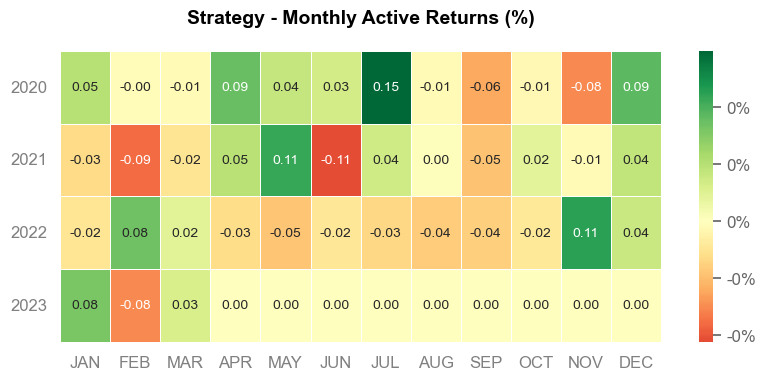

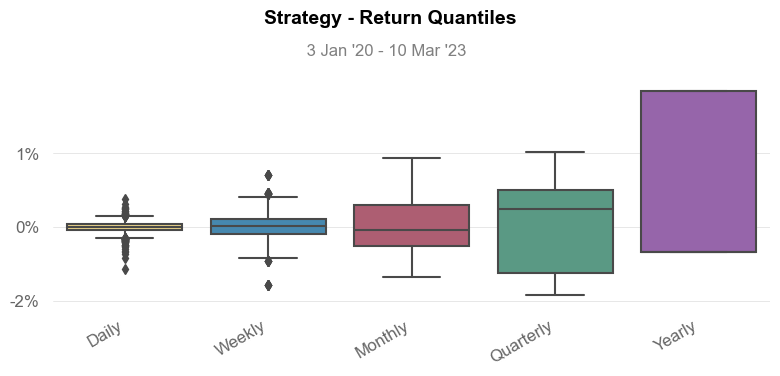

In [19]:
qs.reports.full(result_H4_Out_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_H4_Out['Equity'].resample('D').last().dropna().pct_change())

## TF H1

### In Sample

                           Strategy
-------------------------  ----------
Start Period               2007-01-02
End Period                 2019-12-31
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          -2.88%
CAGR﹪                     -0.16%

Sharpe                     -0.09
Prob. Sharpe Ratio         36.12%
Smart Sharpe               -0.09
Sortino                    -0.12
Smart Sortino              -0.12
Sortino/√2                 -0.08
Smart Sortino/√2           -0.08
Omega                      0.98

Max Drawdown               -14.84%
Longest DD Days            3039
Volatility (ann.)          1.86%
Calmar                     -0.01
Skew                       -0.33
Kurtosis                   9.48

Expected Daily %           -0.0%
Expected Monthly %         -0.02%
Expected Yearly %          -0.22%
Kelly Criterion            -0.89%
Risk of Ruin               0.0%
Daily Value-at-Risk        -0.19%
Expected Shortfall (cVaR)  -0.19%

Max Consecutive

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2011-09-06,2018-10-09,2019-12-31,3039,-14.835265,-14.636135
2,2008-03-17,2008-09-10,2009-11-05,599,-3.273827,-3.050752
3,2009-11-26,2010-02-04,2010-05-16,172,-1.881161,-1.851000
4,2011-08-23,2011-08-24,2011-09-01,10,-0.968287,-0.613208
5,2010-12-07,2011-01-28,2011-04-07,122,-0.963352,-0.888240


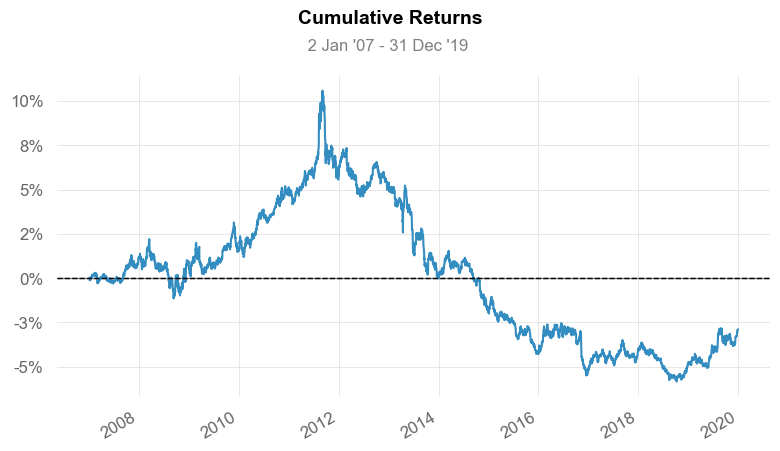

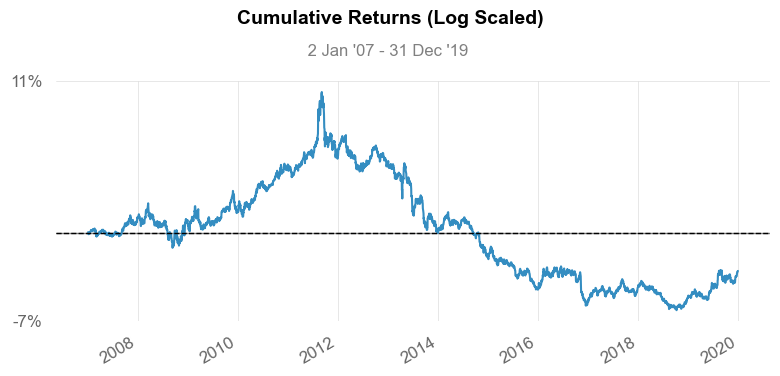

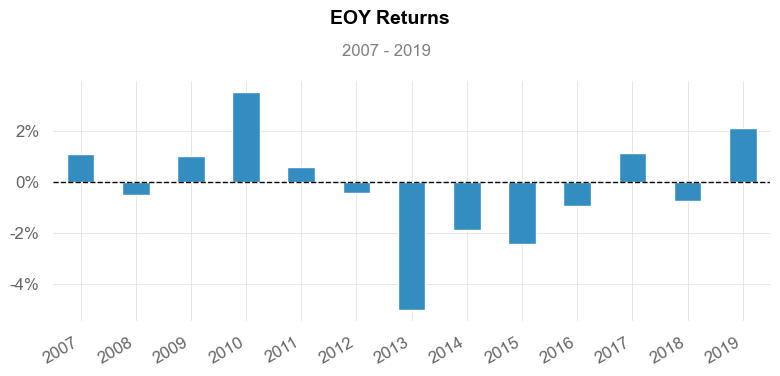

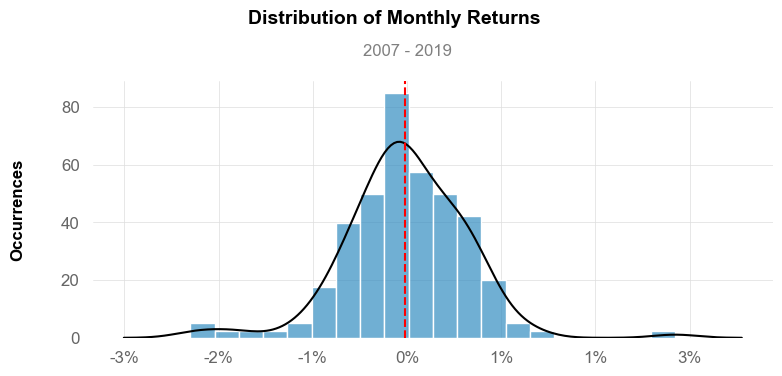

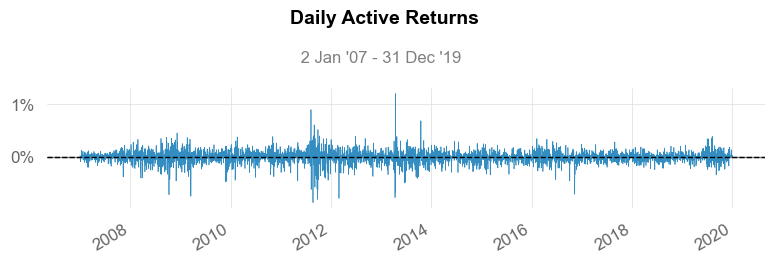

...

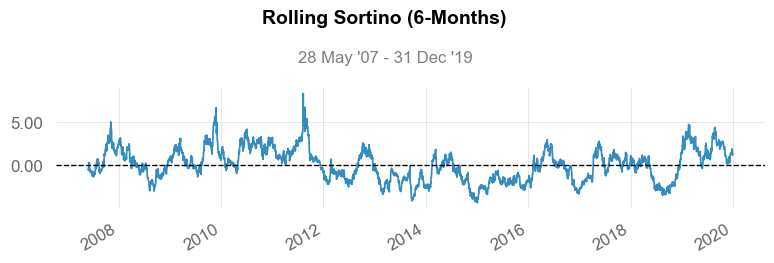

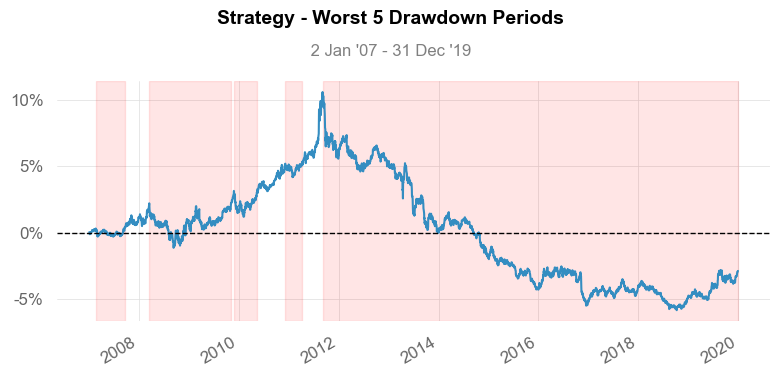

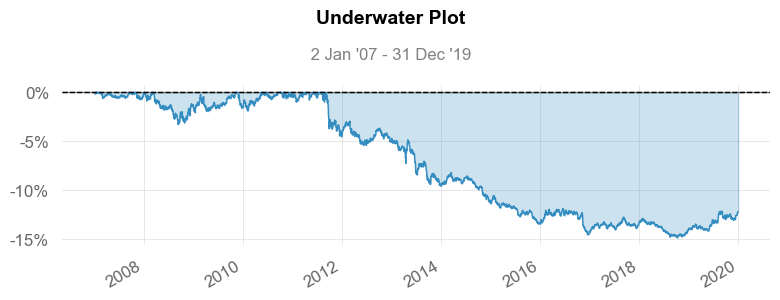

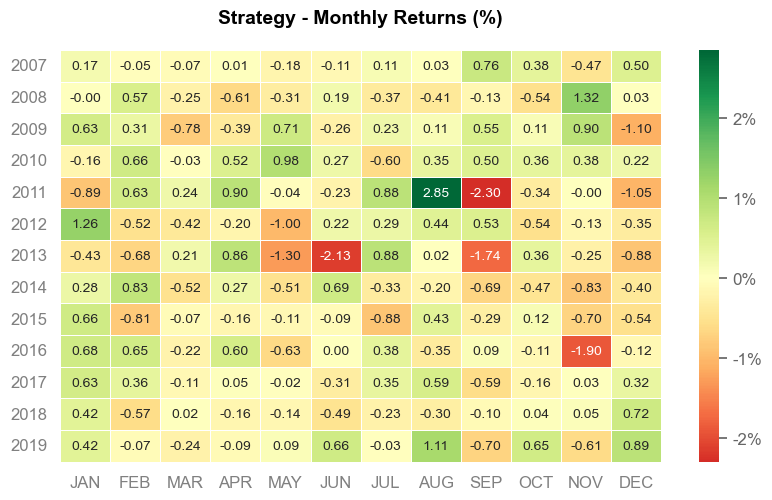

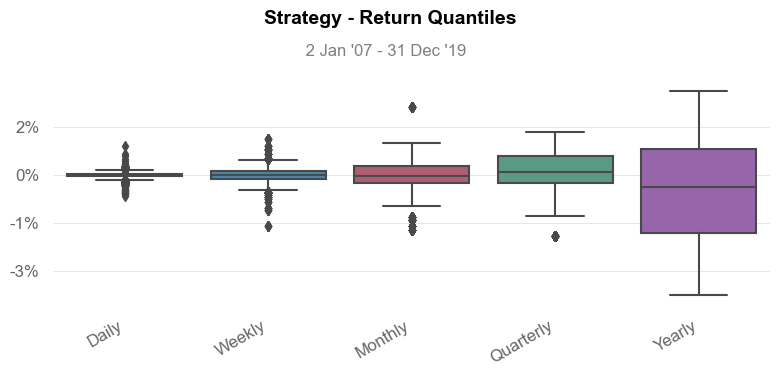

In [20]:
qs.reports.full(result_H1_In_Sample['Equity'].resample('D').last().dropna().pct_change())

### Out Sample

                           Strategy
-------------------------  ----------
Start Period               2020-01-02
End Period                 2023-03-10
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          3.95%
CAGR﹪                     0.84%

Sharpe                     0.4
Prob. Sharpe Ratio         78.23%
Smart Sharpe               0.37
Sortino                    0.55
Smart Sortino              0.51
Sortino/√2                 0.39
Smart Sortino/√2           0.36
Omega                      1.08

Max Drawdown               -3.84%
Longest DD Days            552
Volatility (ann.)          2.58%
Calmar                     0.22
Skew                       -0.3
Kurtosis                   6.05

Expected Daily %           0.0%
Expected Monthly %         0.1%
Expected Yearly %          0.97%
Kelly Criterion            3.84%
Risk of Ruin               0.0%
Daily Value-at-Risk        -0.26%
Expected Shortfall (cVaR)  -0.26%

Max Consecutive Wins       9
Max 

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2022-03-09,2022-09-15,2023-03-10,367,-3.835795,-3.748552
2,2020-09-02,2021-09-29,2022-03-07,552,-3.526134,-3.361817
3,2020-03-09,2020-03-17,2020-06-22,106,-2.994661,-2.918150
4,2020-08-07,2020-08-11,2020-08-28,22,-0.962649,-0.543144
5,2020-01-08,2020-01-13,2020-02-18,42,-0.578733,-0.535853


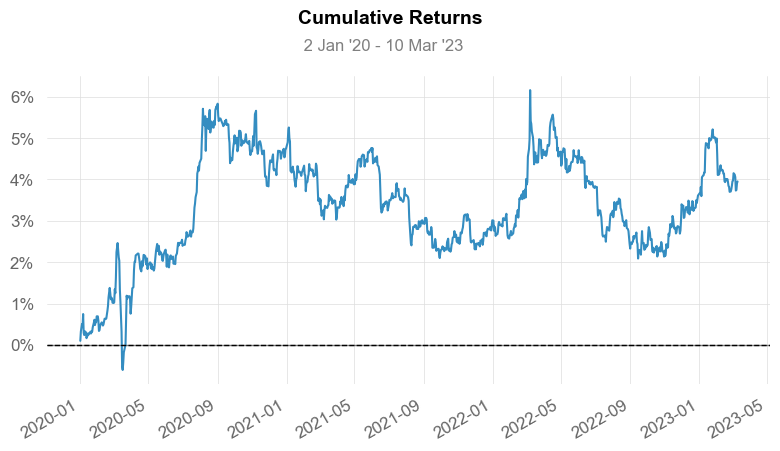

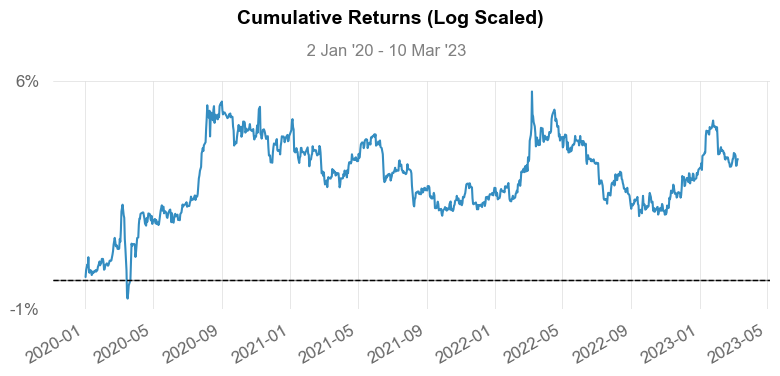

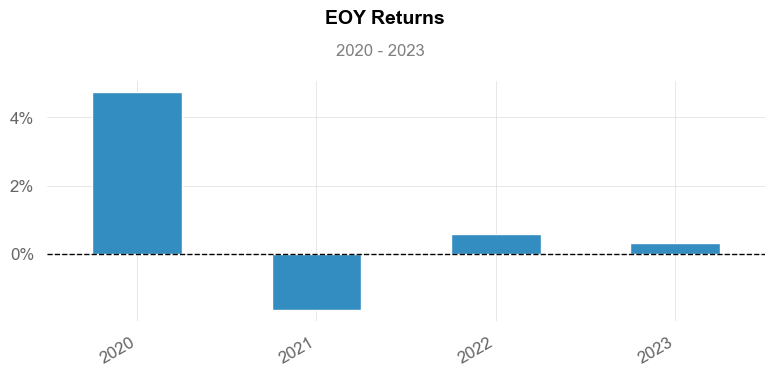

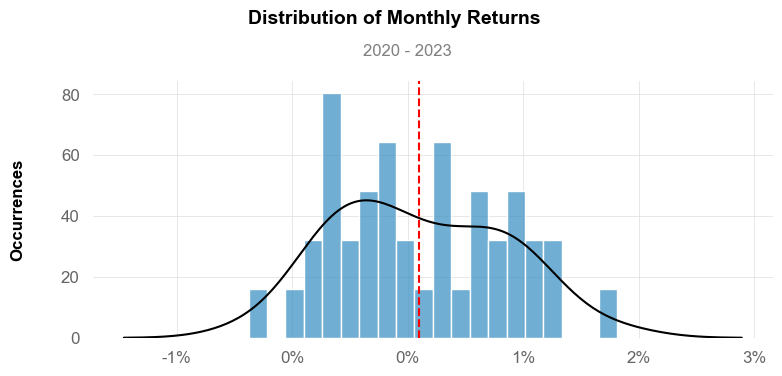

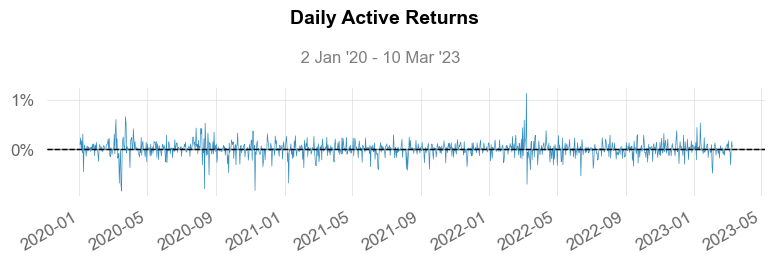

...

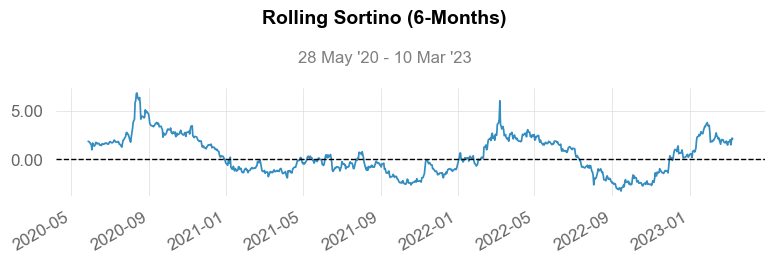

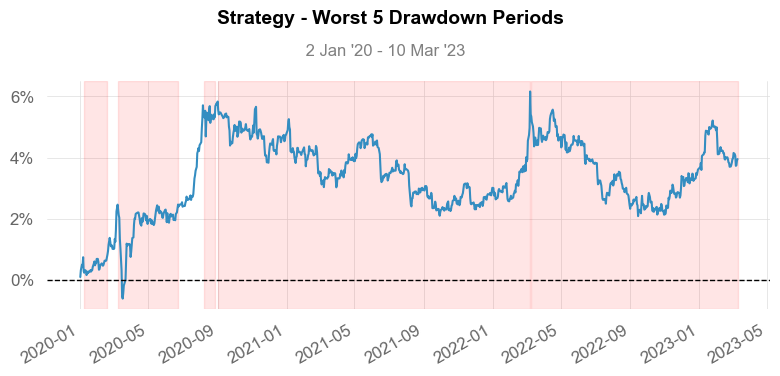

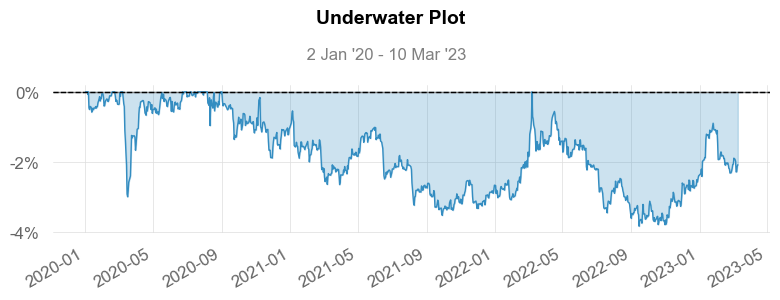

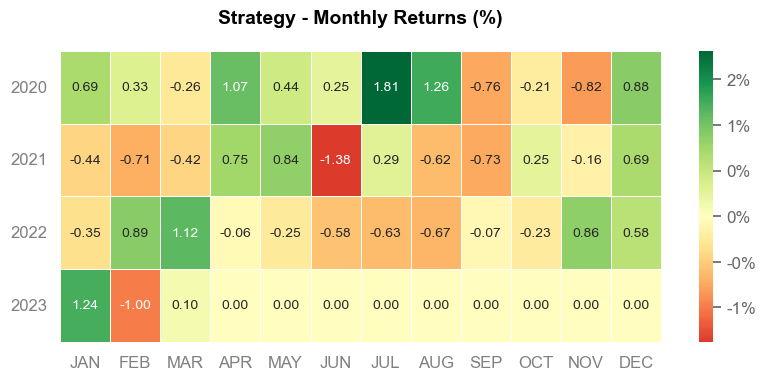

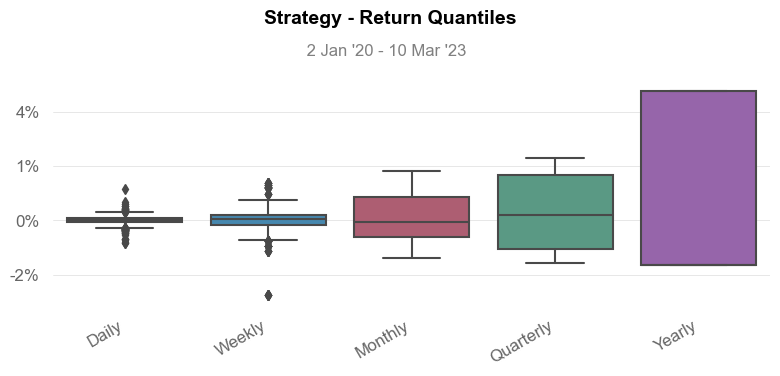

In [21]:
qs.reports.full(result_H1_Out_Sample['Equity'].resample('D').last().dropna().pct_change())

### Reports

### Compare benchmark Buy and Hold In Sample

In [22]:
benchmark_H1_In = benchmark_H1.loc[str(
    result_H1_In_Sample.index[0]):str(result_H1_In_Sample.index[-1])]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2007-01-03   2007-01-03
End Period                 2019-12-31   2019-12-31
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          8.77%        -2.91%
CAGR﹪                     0.45%        -0.16%

Sharpe                     0.3          -0.09
Prob. Sharpe Ratio         88.43%       35.96%
Smart Sharpe               0.3          -0.09
Sortino                    0.41         -0.12
Smart Sortino              0.41         -0.12
Sortino/√2                 0.29         -0.09
Smart Sortino/√2           0.29         -0.08
Omega                      0.98         0.98

Max Drawdown               -7.6%        -14.84%
Longest DD Days            3053         3039
Volatility (ann.)          1.79%        1.86%
R^2                        0.69         0.69
Information Ratio          -0.04        -0.04
Calmar      

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2011-09-06,2018-10-09,2019-12-31,3039,-14.835265,-14.636135
2,2008-03-17,2008-09-10,2009-11-05,599,-3.273827,-3.050752
3,2009-11-26,2010-02-04,2010-05-16,172,-1.881161,-1.851000
4,2011-08-23,2011-08-24,2011-09-01,10,-0.968287,-0.613208
5,2010-12-07,2011-01-28,2011-04-07,122,-0.963352,-0.888240


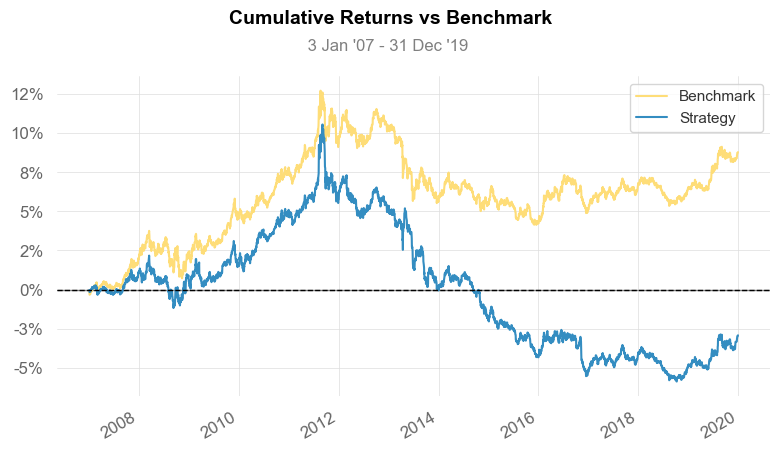

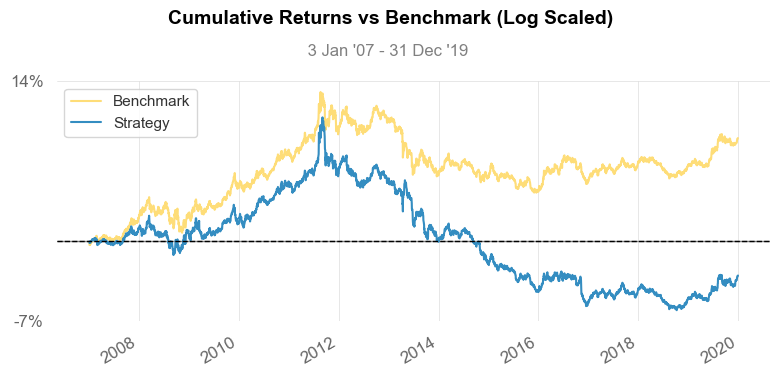

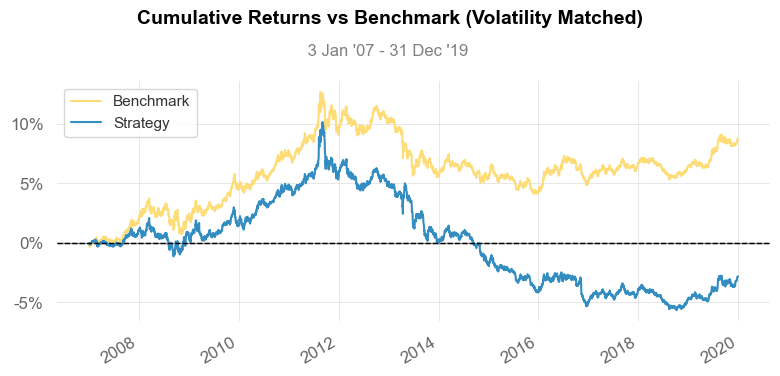

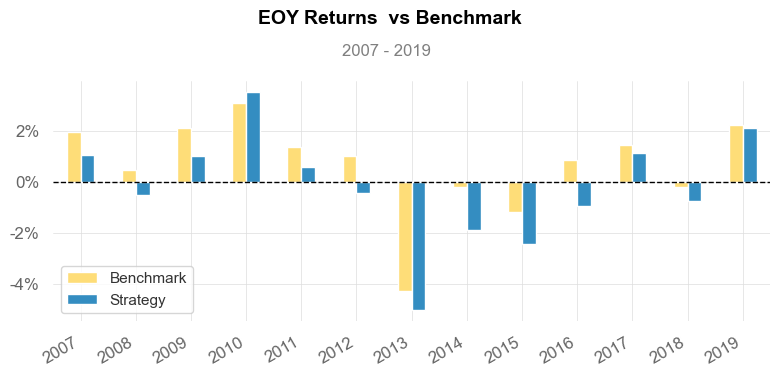

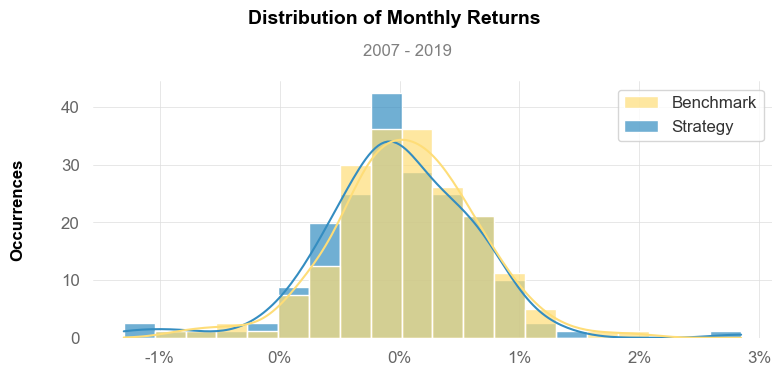

...

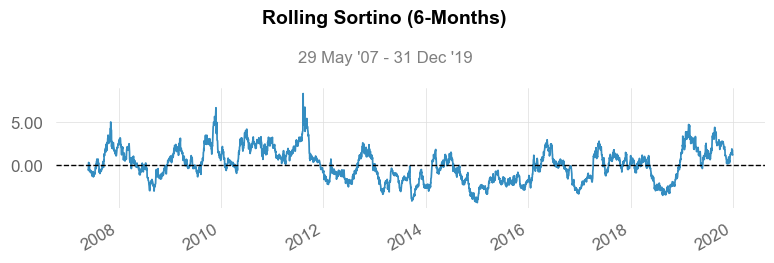

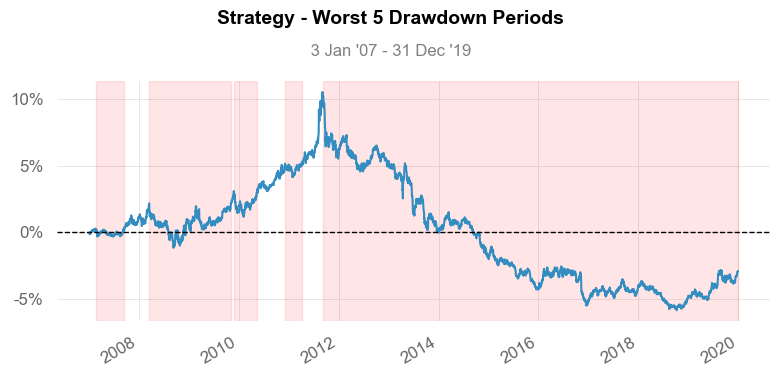

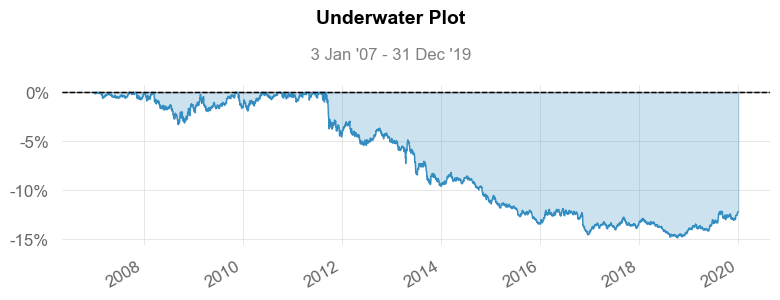

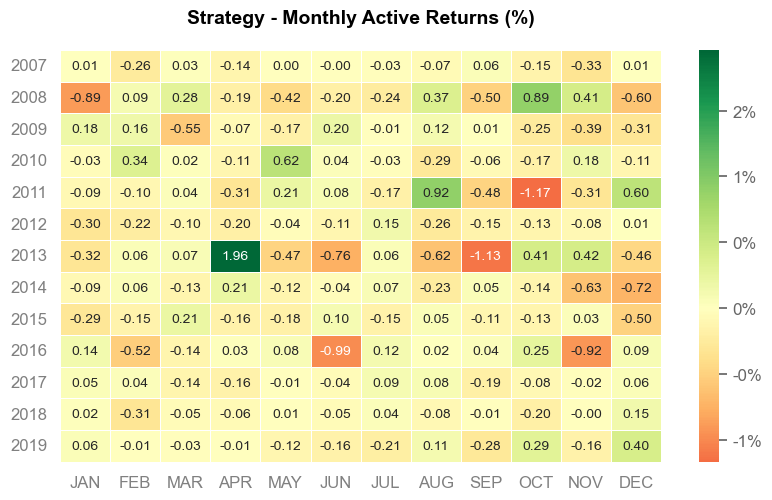

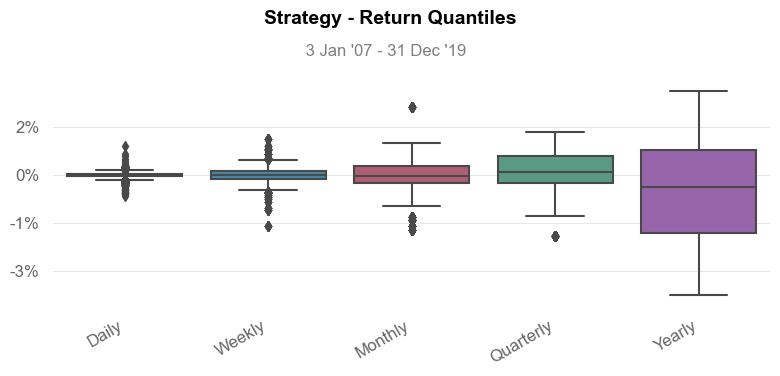

In [23]:
qs.reports.full(result_H1_In_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_H1_In['Equity'].resample('D').last().dropna().pct_change())

### Compare benchmark Buy and Hold Out Sample

In [24]:
benchmark_H1_Out = benchmark_H1.loc[str(
    result_H1_Out_Sample.index[0]):str(result_H1_Out_Sample.index[-1])]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2020-01-03   2020-01-03
End Period                 2023-03-10   2023-03-10
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          3.0%         3.85%
CAGR﹪                     0.64%        0.82%

Sharpe                     0.33         0.39
Prob. Sharpe Ratio         74.11%       77.67%
Smart Sharpe               0.31         0.36
Sortino                    0.45         0.53
Smart Sortino              0.41         0.5
Sortino/√2                 0.32         0.38
Smart Sortino/√2           0.29         0.35
Omega                      1.07         1.07

Max Drawdown               -3.87%       -3.84%
Longest DD Days            946          552
Volatility (ann.)          2.37%        2.58%
R^2                        0.76         0.76
Information Ratio          0.01         0.01
Calmar                  

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2022-03-09,2022-09-15,2023-03-10,367,-3.835795,-3.748552
2,2020-09-02,2021-09-29,2022-03-07,552,-3.526134,-3.361817
3,2020-03-09,2020-03-17,2020-06-22,106,-2.994661,-2.918150
4,2020-08-07,2020-08-11,2020-08-28,22,-0.962649,-0.543144
5,2020-01-08,2020-01-13,2020-02-18,42,-0.578733,-0.535853


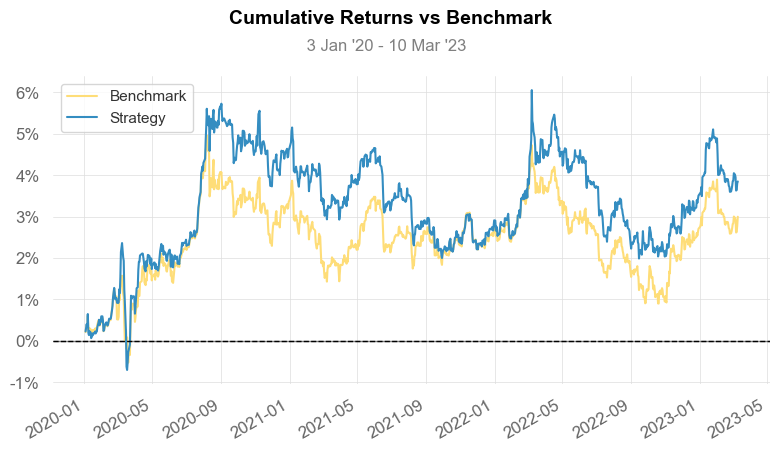

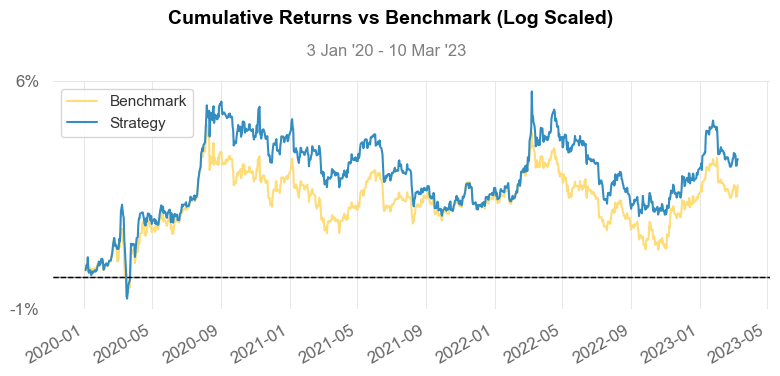

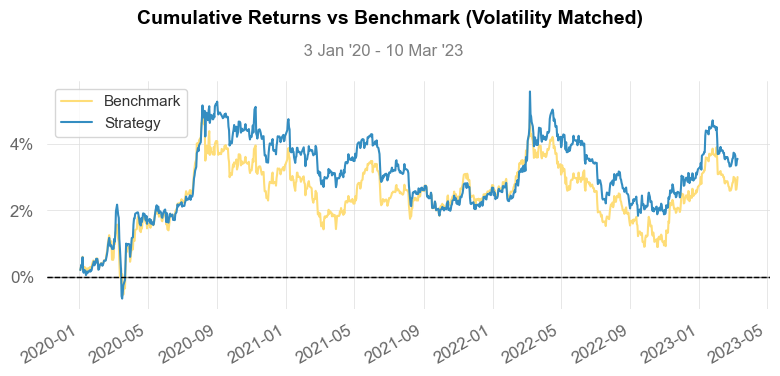

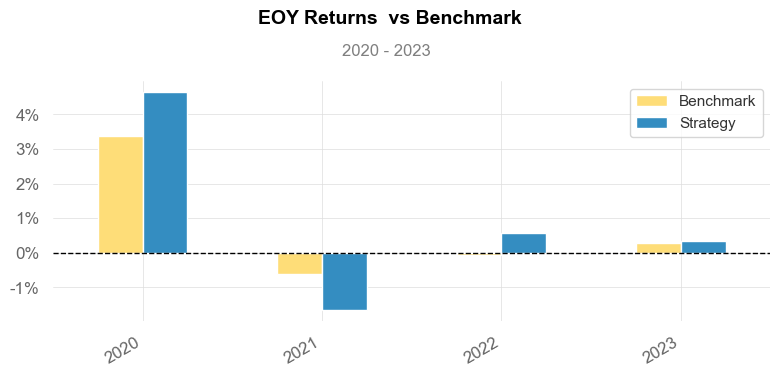

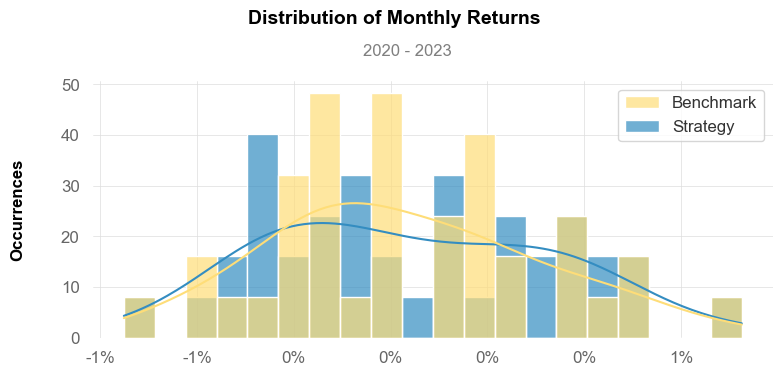

...

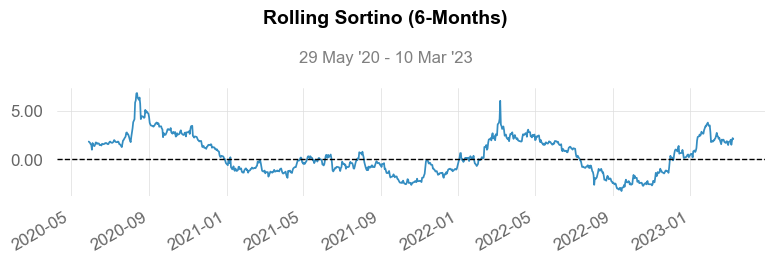

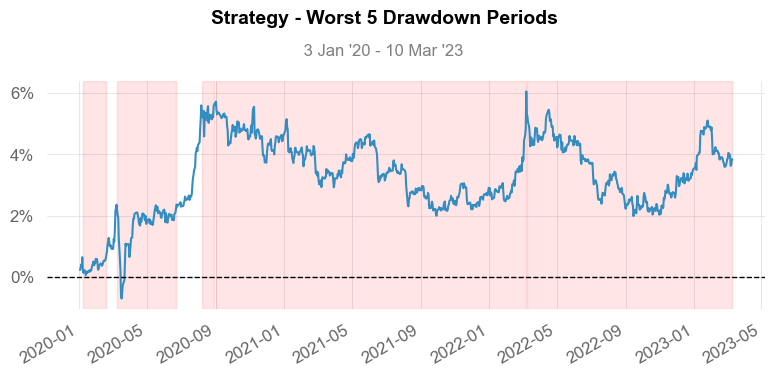

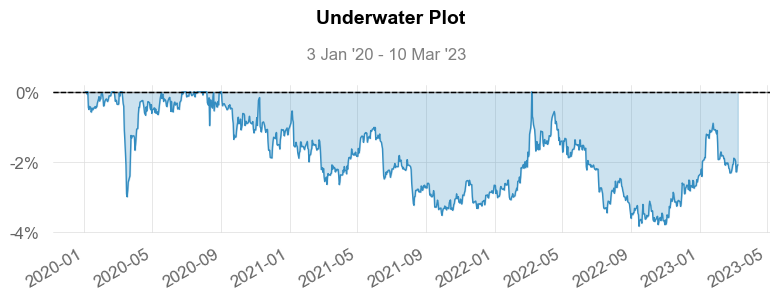

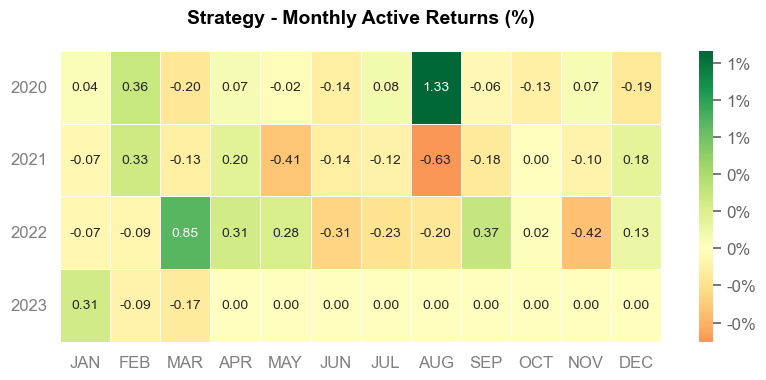

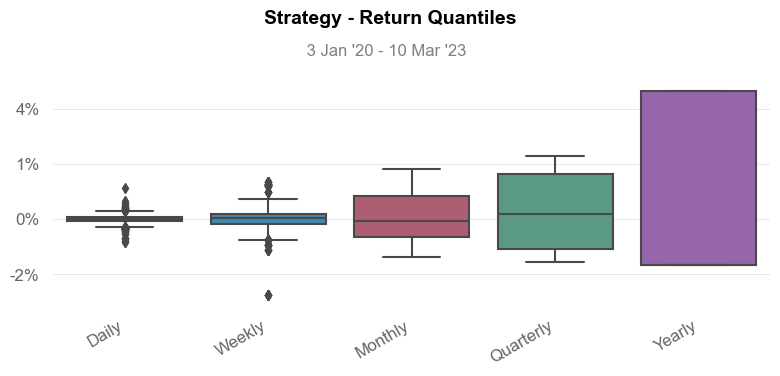

In [25]:
qs.reports.full(result_H1_Out_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_H1_Out['Equity'].resample('D').last().dropna().pct_change())

## TF M30

### In Sample

                           Strategy
-------------------------  ----------
Start Period               2007-01-02
End Period                 2019-12-31
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          -70.47%
CAGR﹪                     -6.27%

Sharpe                     -2.58
Prob. Sharpe Ratio         0.0%
Smart Sharpe               -2.54
Sortino                    -3.11
Smart Sortino              -3.05
Sortino/√2                 -2.2
Smart Sortino/√2           -2.16
Omega                      0.61

Max Drawdown               -70.85%
Longest DD Days            4700
Volatility (ann.)          2.92%
Calmar                     -0.09
Skew                       -0.5
Kurtosis                   5.62

Expected Daily %           -0.03%
Expected Monthly %         -0.78%
Expected Yearly %          -8.96%
Kelly Criterion            -28.26%
Risk of Ruin               0.0%
Daily Value-at-Risk        -0.33%
Expected Shortfall (cVaR)  -0.33%

Max Consecutive 

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2007-02-18,2019-12-12,2019-12-31,4700,-70.848864,-70.386749
2,2007-02-02,2007-02-05,2007-02-11,10,-0.128827,-0.126979
3,2007-01-03,2007-01-03,2007-01-10,8,-0.107012,-0.087634
4,2007-01-16,2007-01-22,2007-01-29,14,-0.099530,-0.076592
5,2007-02-13,2007-02-13,2007-02-13,1,-0.024563,NaN


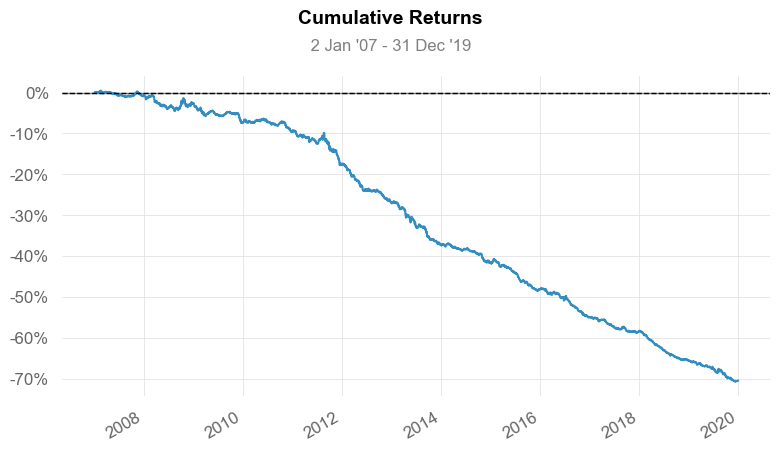

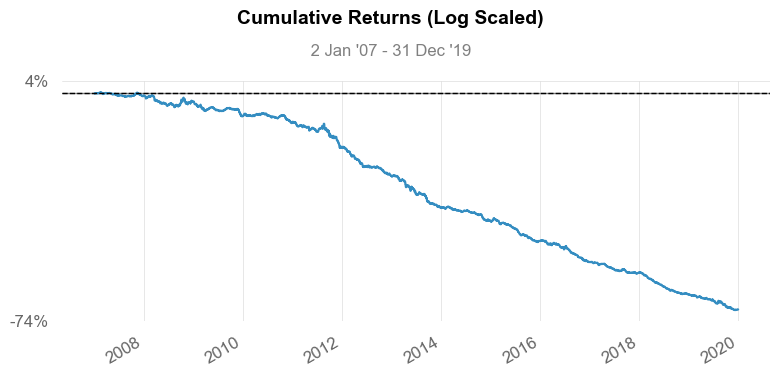

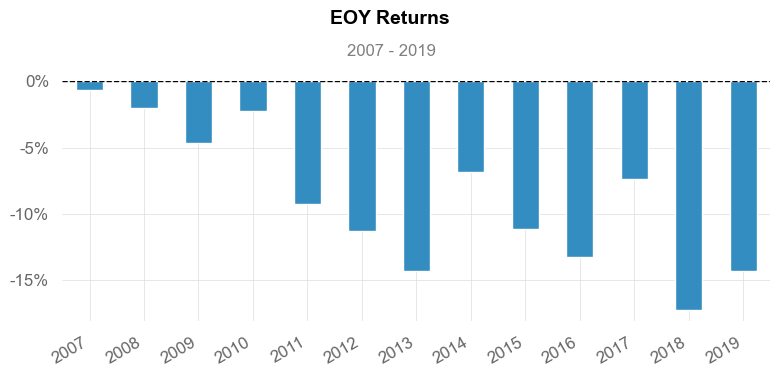

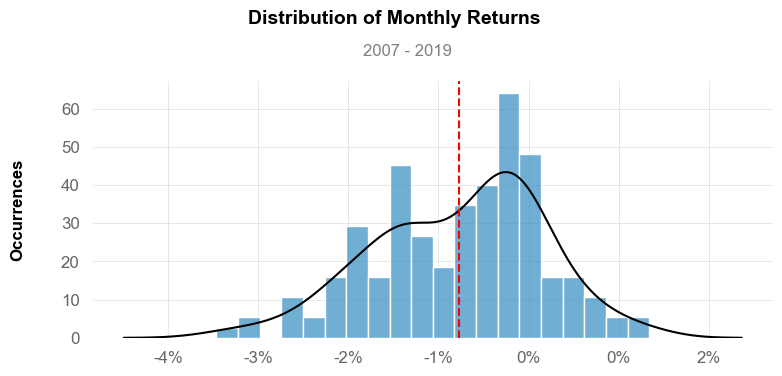

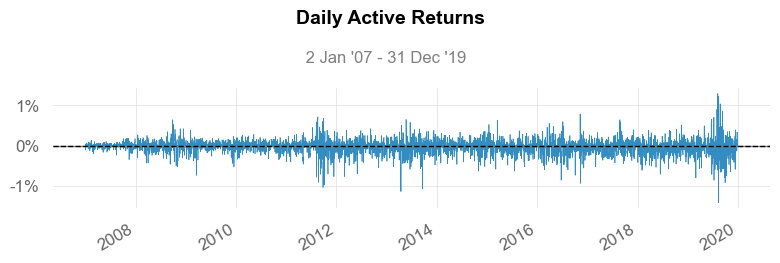

...

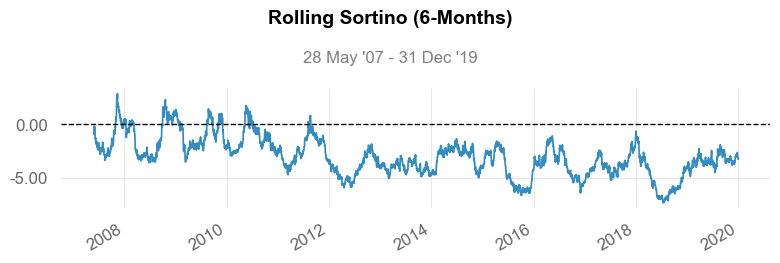

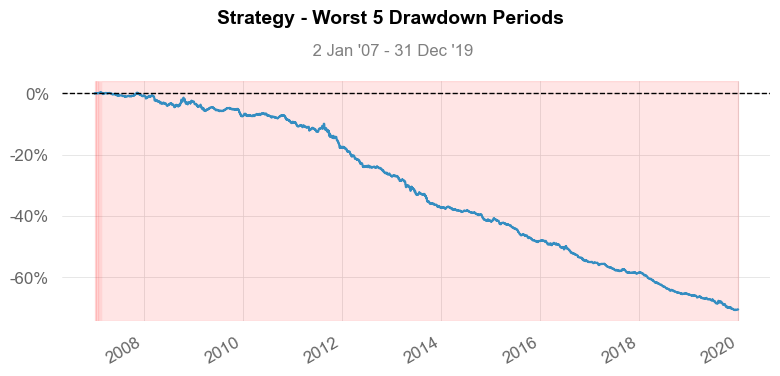

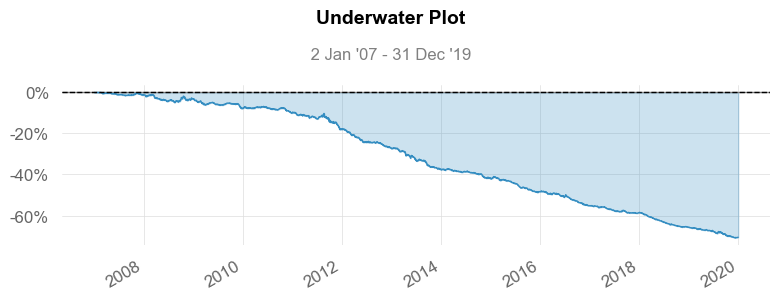

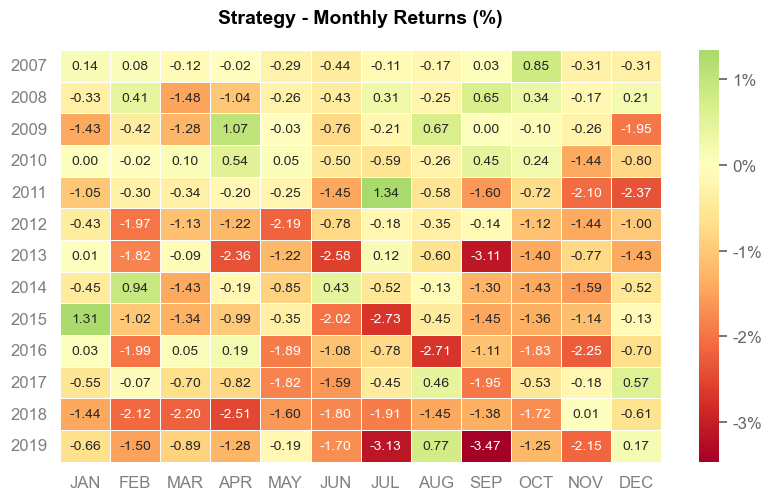

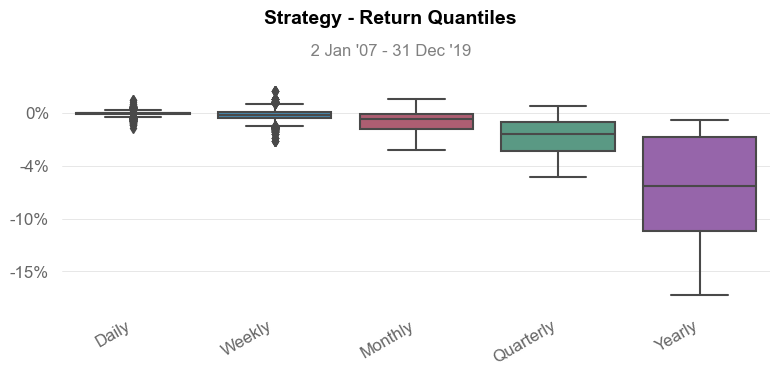

In [26]:
qs.reports.full(result_M30_In_Sample['Equity'].resample('D').last().dropna().pct_change())

### Out Sample

                           Strategy
-------------------------  ----------
Start Period               2020-01-02
End Period                 2023-03-10
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          -22.13%
CAGR﹪                     -5.27%

Sharpe                     -2.26
Prob. Sharpe Ratio         0.0%
Smart Sharpe               -2.19
Sortino                    -2.76
Smart Sortino              -2.66
Sortino/√2                 -1.95
Smart Sortino/√2           -1.88
Omega                      0.67

Max Drawdown               -23.16%
Longest DD Days            1158
Volatility (ann.)          2.8%
Calmar                     -0.23
Skew                       -0.61
Kurtosis                   3.5

Expected Daily %           -0.03%
Expected Monthly %         -0.64%
Expected Yearly %          -6.06%
Kelly Criterion            -22.73%
Risk of Ruin               0.0%
Daily Value-at-Risk        -0.31%
Expected Shortfall (cVaR)  -0.31%

Max Consecutive 

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-01-08,2023-02-03,2023-03-10,1158,-23.158916,-22.734268


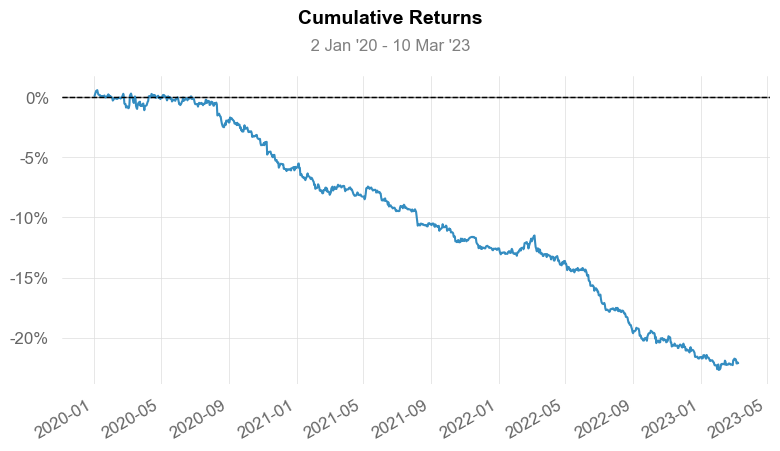

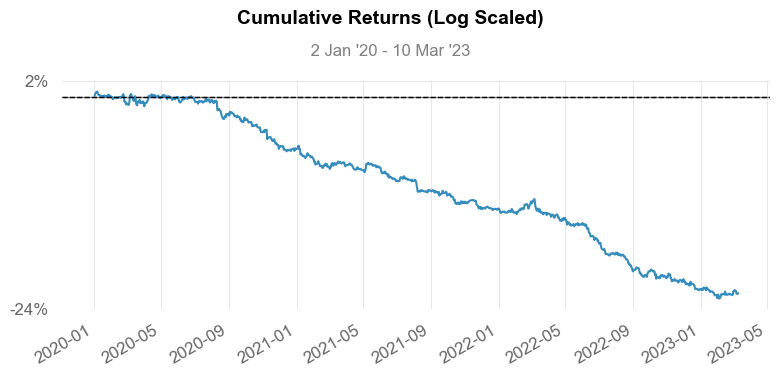

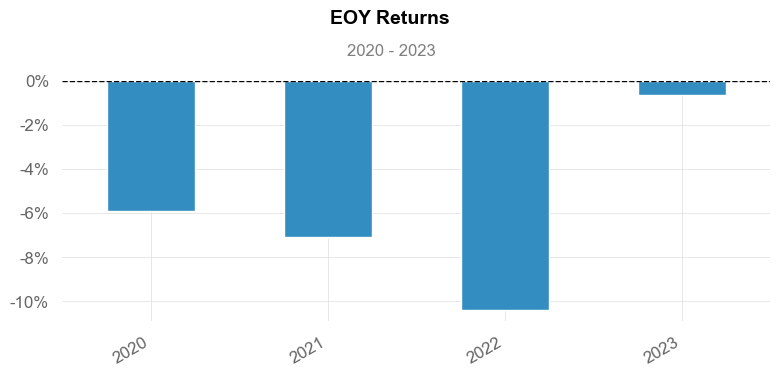

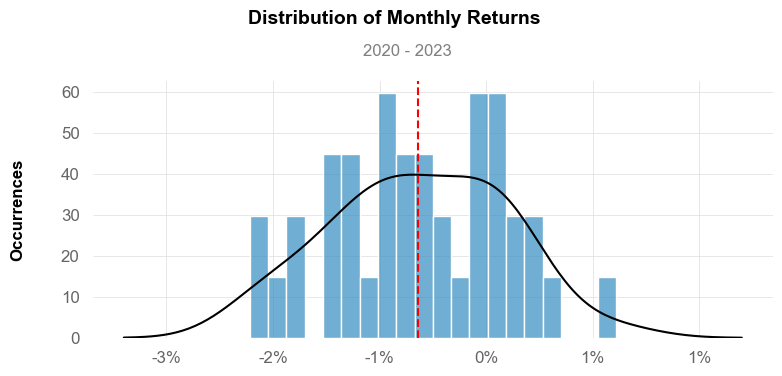

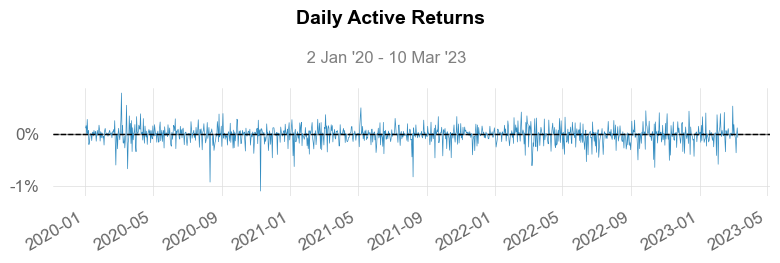

...

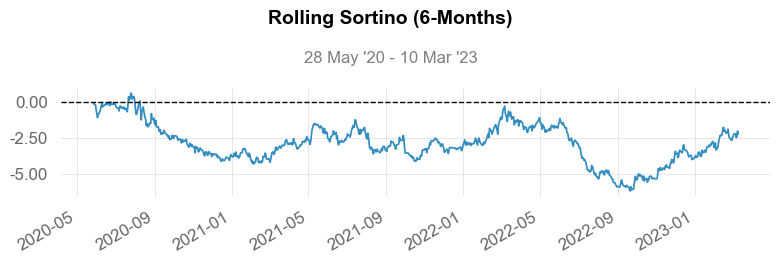

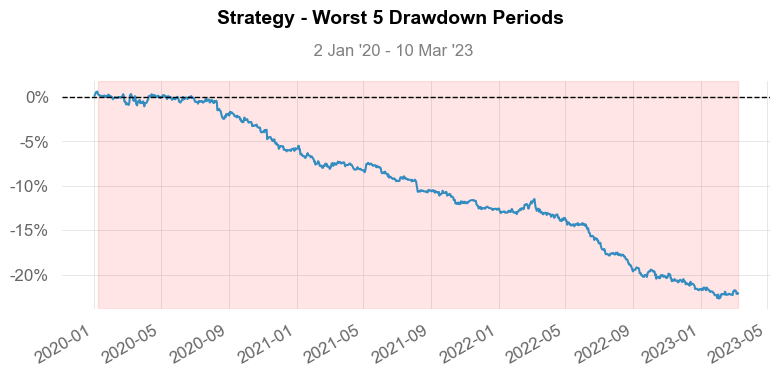

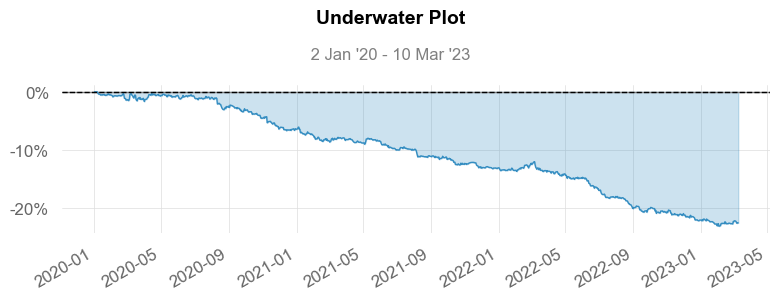

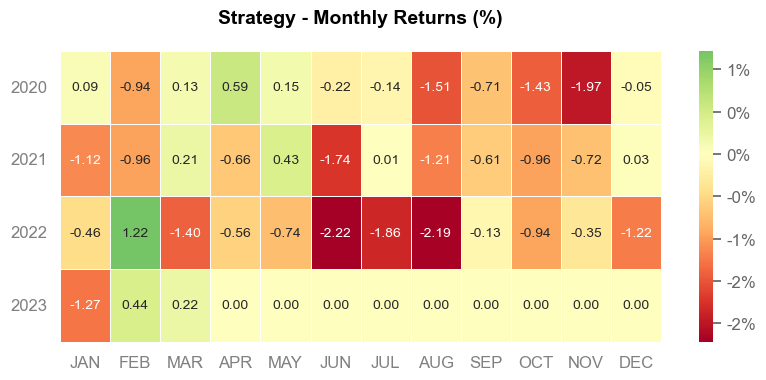

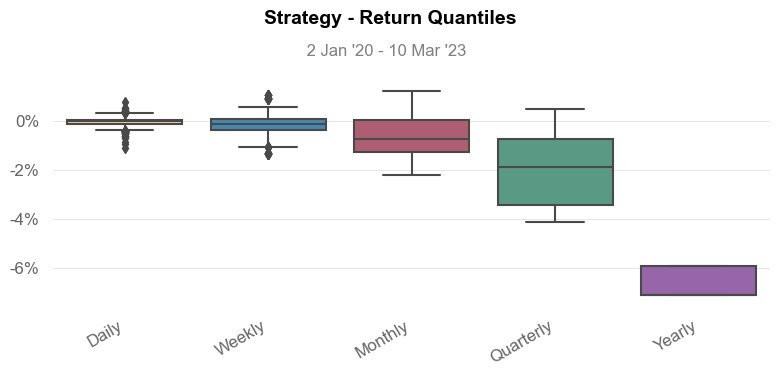

In [27]:
qs.reports.full(result_M30_Out_Sample['Equity'].resample('D').last().dropna().pct_change())

### Reports

### Compare benchmark Buy and Hold In Sample

In [28]:
benchmark_M30_In = benchmark_M30.loc[str(
    result_M30_In_Sample.index[0]):str(result_M30_In_Sample.index[-1])]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2007-01-03   2007-01-03
End Period                 2019-12-31   2019-12-31
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          8.77%        -70.48%
CAGR﹪                     0.45%        -6.27%

Sharpe                     0.3          -2.59
Prob. Sharpe Ratio         88.43%       0.0%
Smart Sharpe               0.3          -2.54
Sortino                    0.41         -3.11
Smart Sortino              0.41         -3.06
Sortino/√2                 0.29         -2.2
Smart Sortino/√2           0.29         -2.16
Omega                      0.61         0.61

Max Drawdown               -7.6%        -70.85%
Longest DD Days            3053         4700
Volatility (ann.)          1.79%        2.92%
R^2                        0.22         0.22
Information Ratio          -0.2         -0.2
Calmar         

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2007-02-18,2019-12-12,2019-12-31,4700,-70.848864,-70.386749
2,2007-02-02,2007-02-05,2007-02-11,10,-0.128827,-0.126979
3,2007-01-16,2007-01-22,2007-01-29,14,-0.099530,-0.076592
4,2007-02-13,2007-02-13,2007-02-13,1,-0.024563,NaN
5,2007-01-31,2007-01-31,2007-01-31,1,-0.023852,NaN


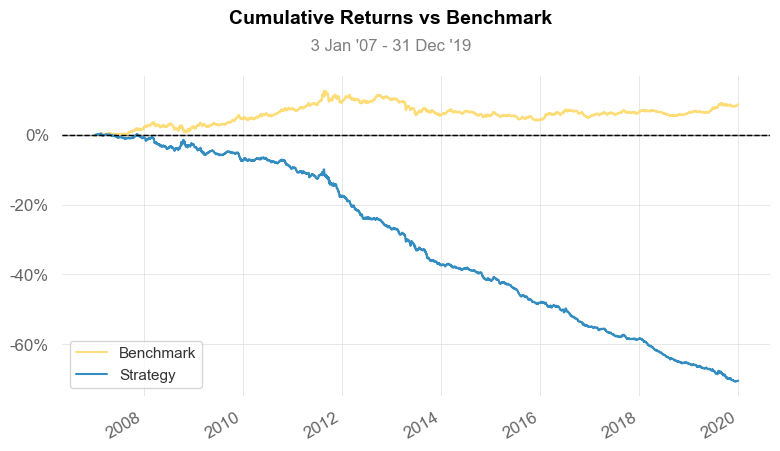

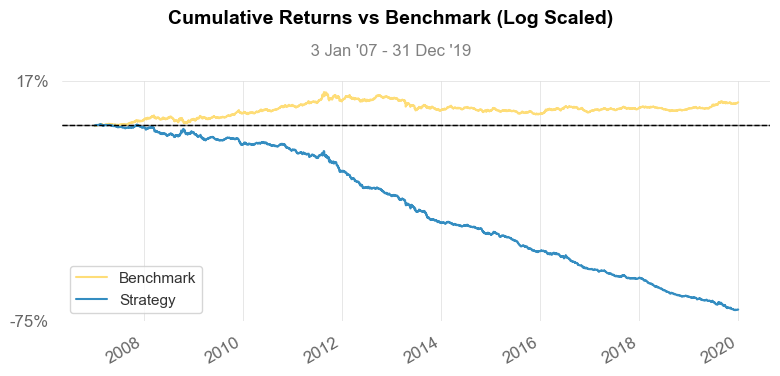

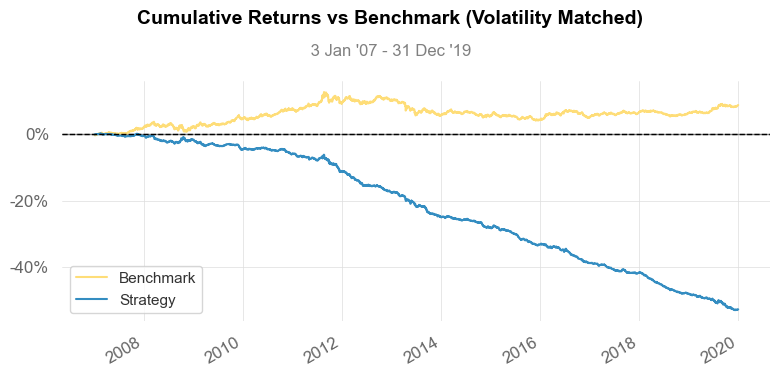

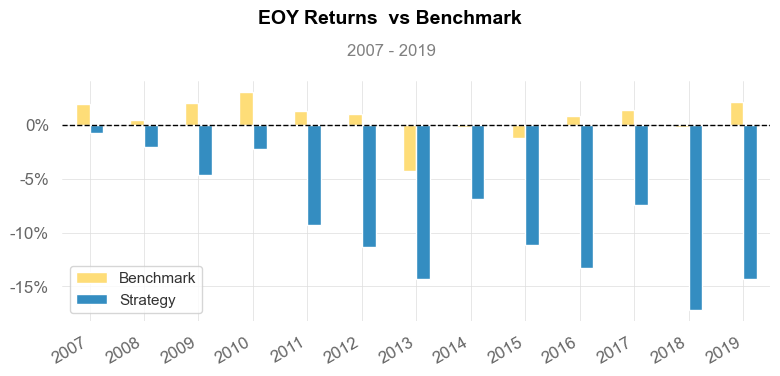

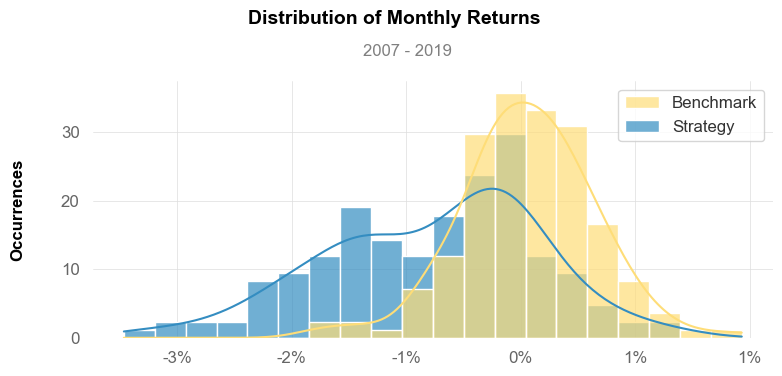

...

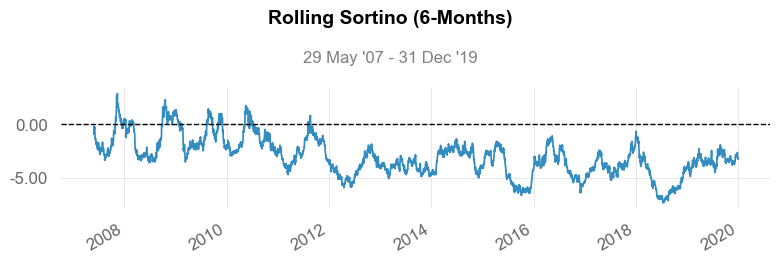

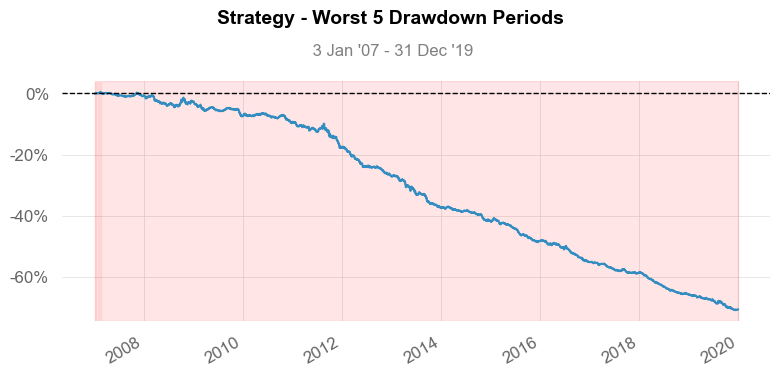

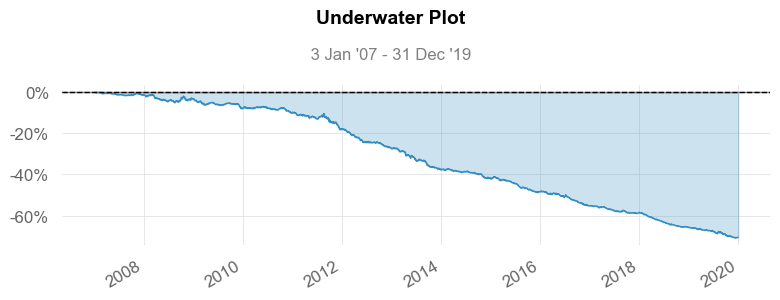

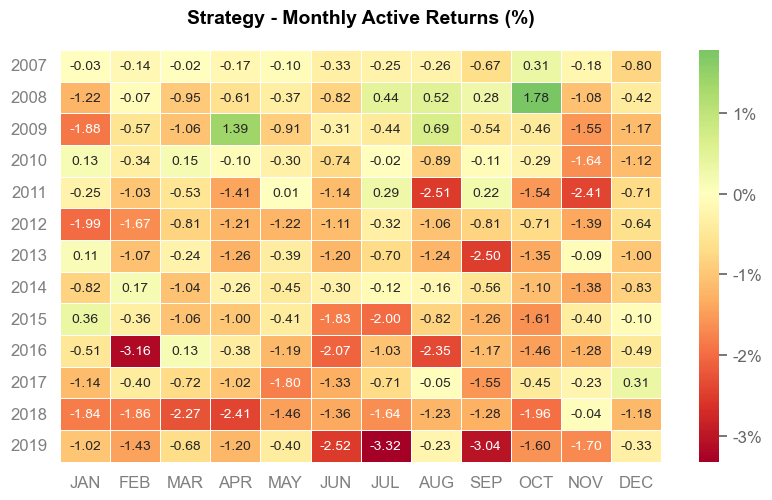

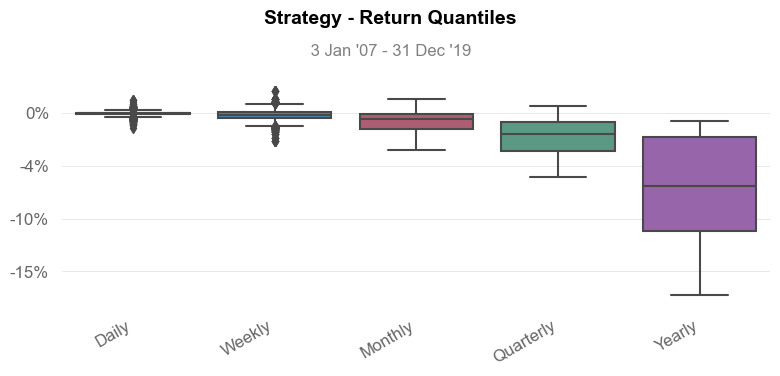

In [29]:
qs.reports.full(result_M30_In_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_M30_In['Equity'].resample('D').last().dropna().pct_change())

### Compare benchmark Buy and Hold Out Sample

In [30]:
benchmark_M30_Out = benchmark_M30.loc[str(
    result_M30_Out_Sample.index[0]):str(result_M30_Out_Sample.index[-1])]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2020-01-03   2020-01-03
End Period                 2023-03-10   2023-03-10
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          3.06%        -22.21%
CAGR﹪                     0.66%        -5.3%

Sharpe                     0.34         -2.27
Prob. Sharpe Ratio         74.54%       0.0%
Smart Sharpe               0.32         -2.19
Sortino                    0.46         -2.77
Smart Sortino              0.44         -2.67
Sortino/√2                 0.32         -1.96
Smart Sortino/√2           0.31         -1.89
Omega                      0.67         0.67

Max Drawdown               -3.87%       -23.16%
Longest DD Days            946          1158
Volatility (ann.)          2.37%        2.8%
R^2                        0.25         0.25
Information Ratio          -0.17        -0.17
Calmar         

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-01-08,2023-02-03,2023-03-10,1158,-23.158916,-22.734268


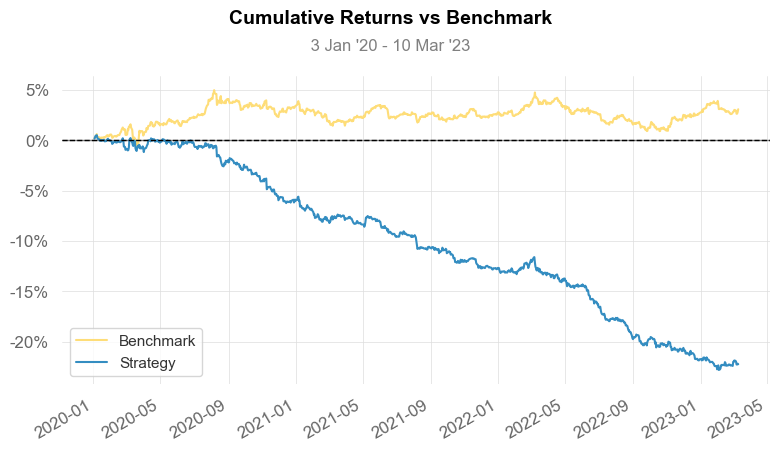

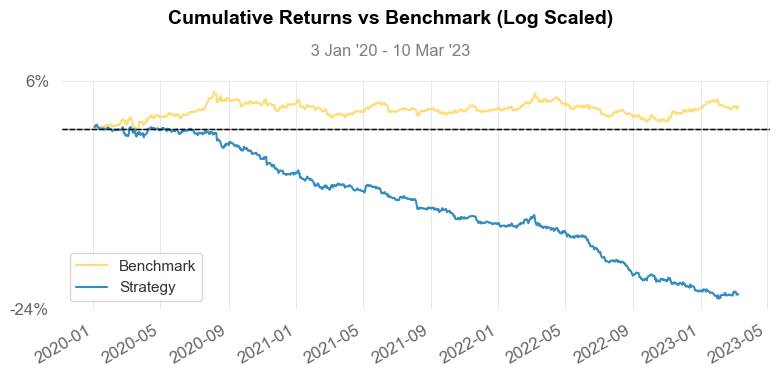

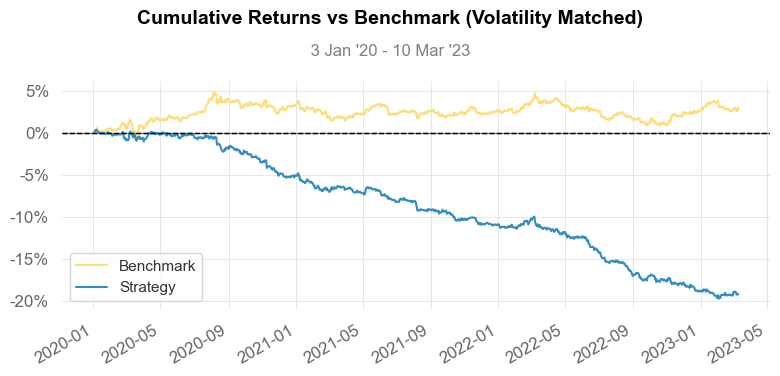

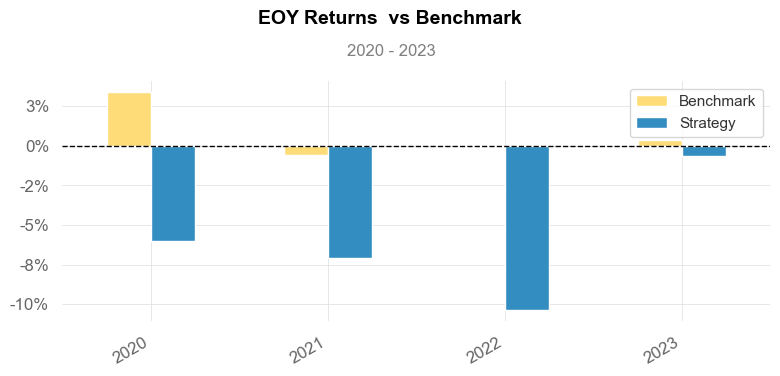

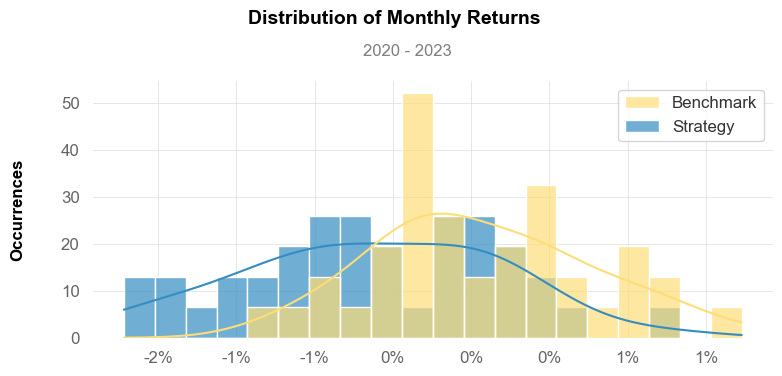

...

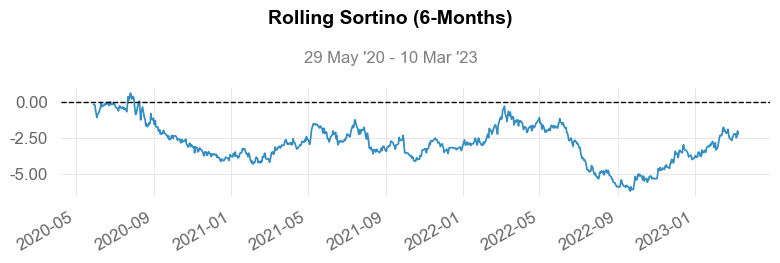

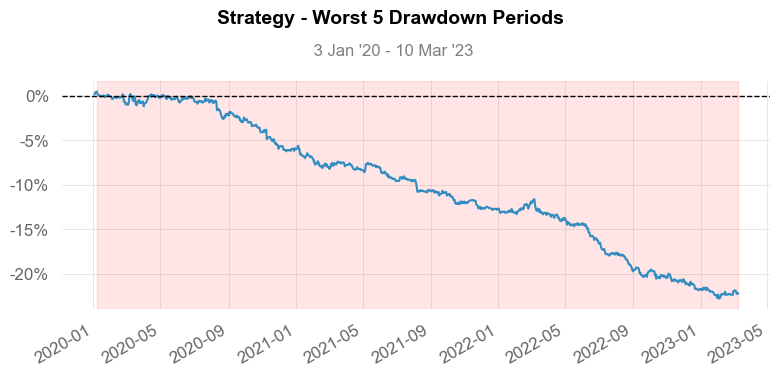

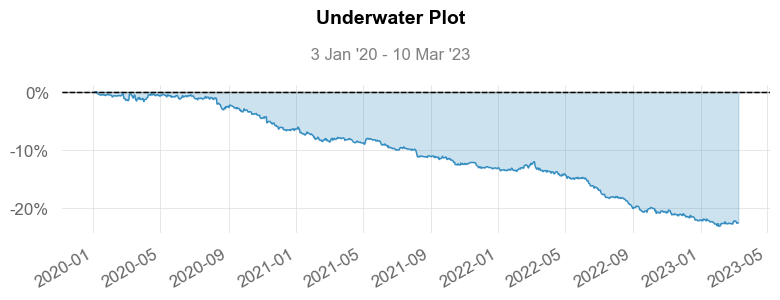

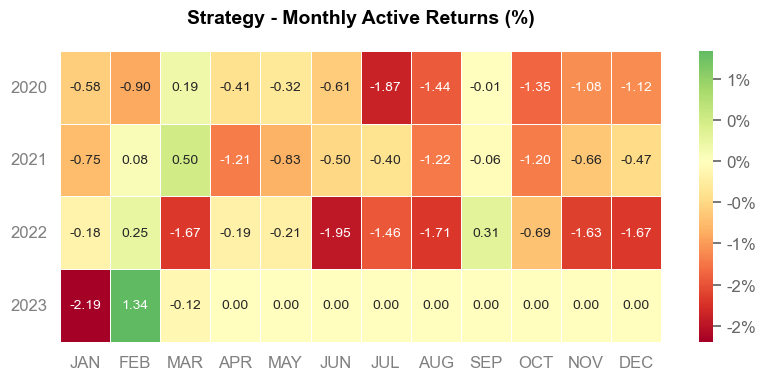

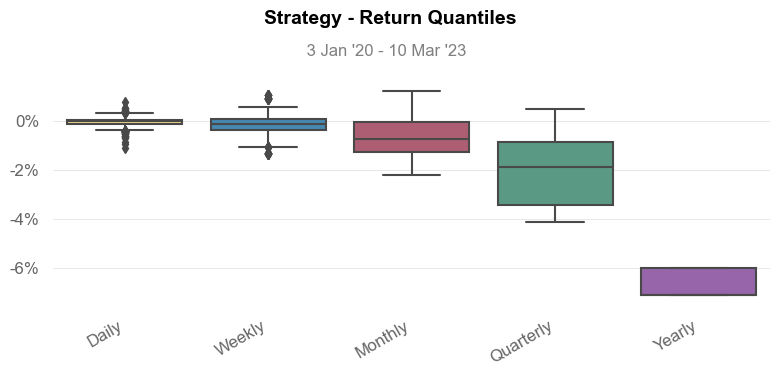

In [31]:
qs.reports.full(result_M30_Out_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_M30_Out['Equity'].resample('D').last().dropna().pct_change())

## TF M15

### In Sample

                           Strategy
-------------------------  ----------
Start Period               2014-09-24
End Period                 2019-12-31
Risk-Free Rate             0.0%
Time in Market             71.0%

Cumulative Return          -99.89%
CAGR﹪                     -59.06%

Sharpe                     -2.95
Prob. Sharpe Ratio         0.0%
Smart Sharpe               -1.69
Sortino                    -2.9
Smart Sortino              -1.66
Sortino/√2                 -2.05
Smart Sortino/√2           -1.18
Omega                      0.03

Max Drawdown               -99.89%
Longest DD Days            1924
Volatility (ann.)          32.65%
Calmar                     -0.59
Skew                       -21.33
Kurtosis                   606.4

Expected Daily %           -0.42%
Expected Monthly %         -10.11%
Expected Yearly %          -67.91%
Kelly Criterion            -567.66%
Risk of Ruin               0.0%
Daily Value-at-Risk        -3.77%
Expected Shortfall (cVaR)  -3.77%

Max Conse

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2014-09-25,2018-06-15,2019-12-31,1924,-99.890618,-99.690533


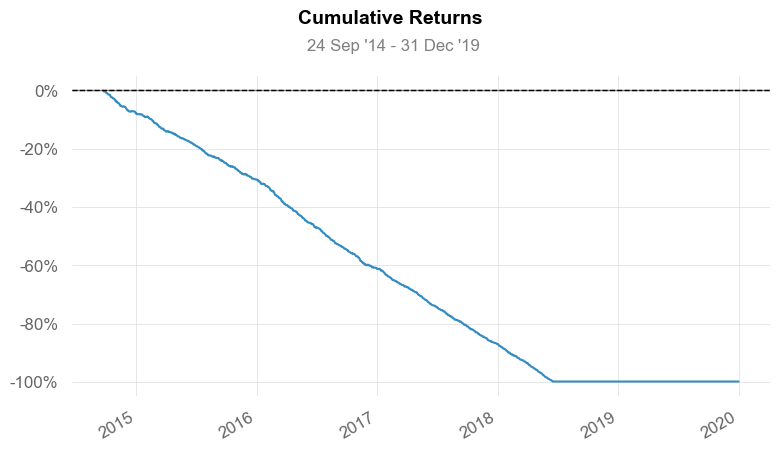

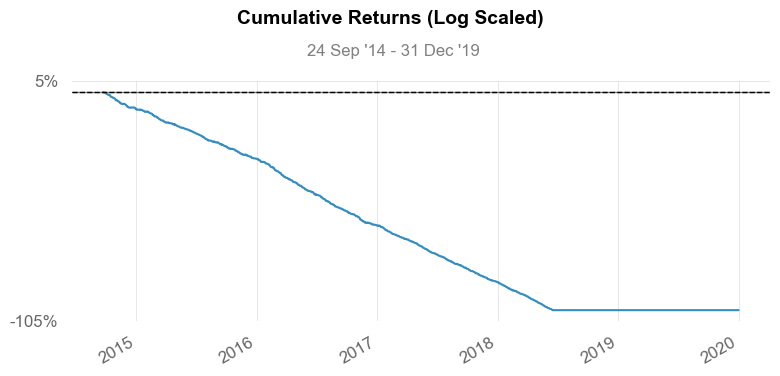

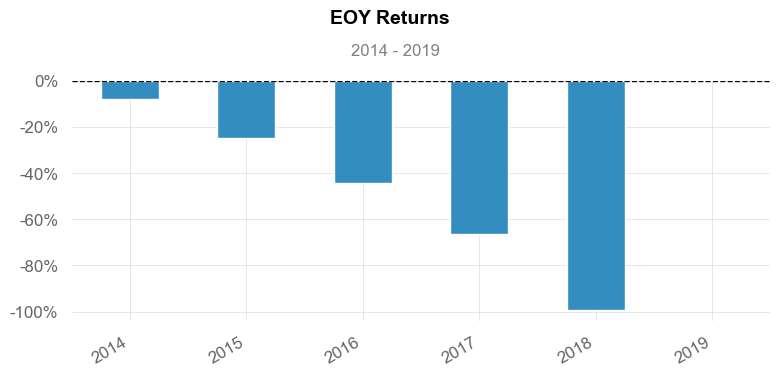

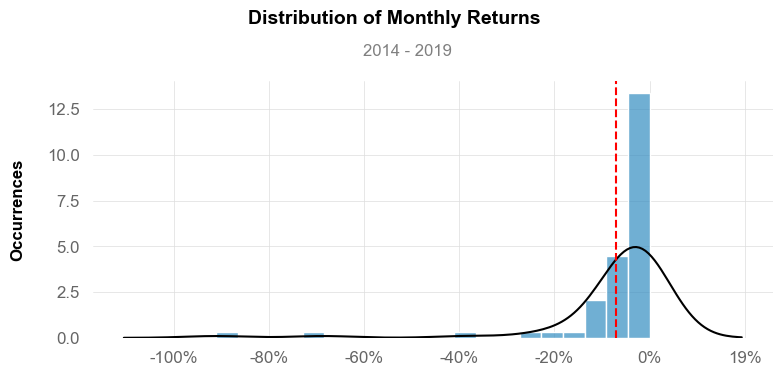

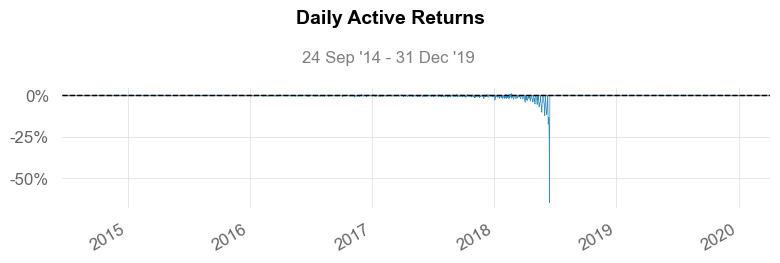

...

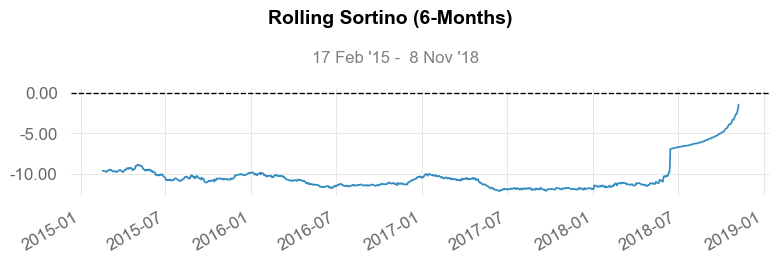

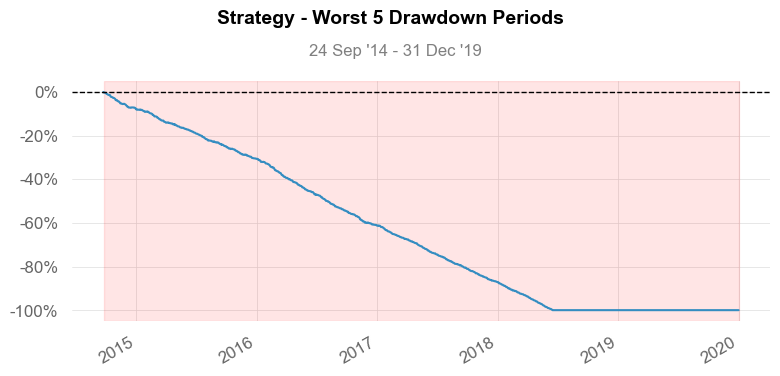

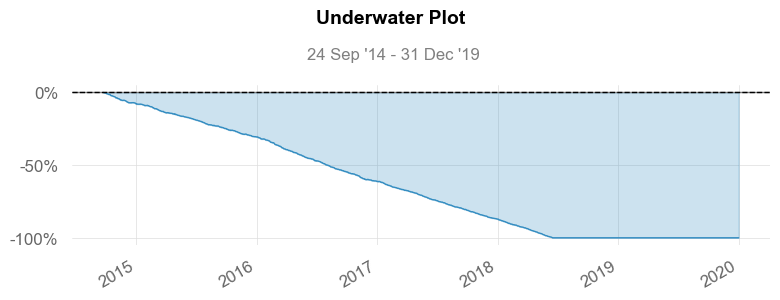

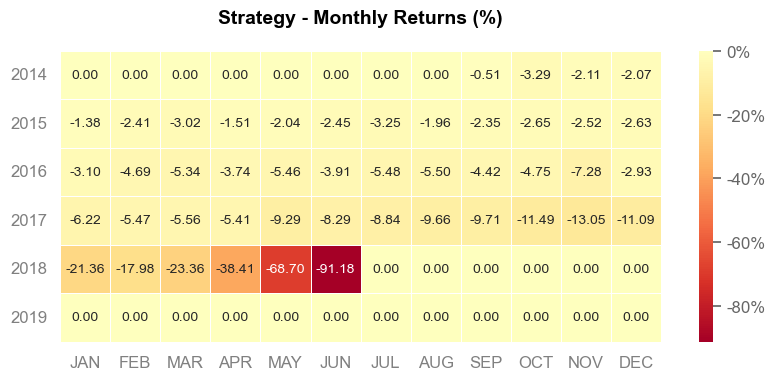

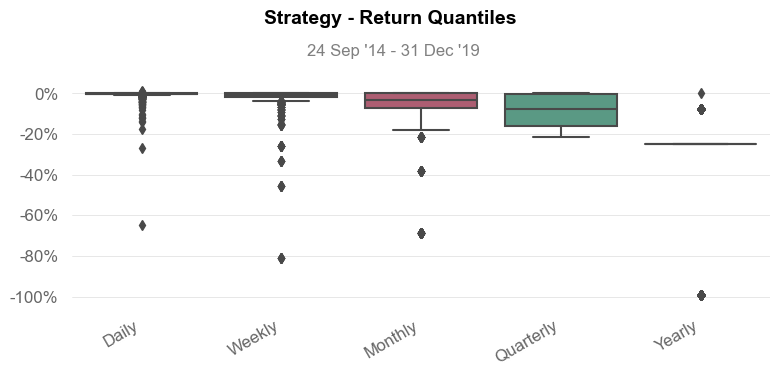

In [32]:
qs.reports.full(result_M15_In_Sample['Equity'].resample('D').last().dropna().pct_change())

### Out Sample

                           Strategy
-------------------------  ----------
Start Period               2020-01-02
End Period                 2023-03-10
Risk-Free Rate             0.0%
Time in Market             92.0%

Cumulative Return          -99.83%
CAGR﹪                     -74.86%

Sharpe                     -3.61
Prob. Sharpe Ratio         0.0%
Smart Sharpe               -1.8
Sortino                    -3.56
Smart Sortino              -1.78
Sortino/√2                 -2.52
Smart Sortino/√2           -1.26
Omega                      0.09

Max Drawdown               -99.83%
Longest DD Days            1163
Volatility (ann.)          41.86%
Calmar                     -0.75
Skew                       -9.31
Kurtosis                   108.27

Expected Daily %           -0.64%
Expected Monthly %         -15.07%
Expected Yearly %          -79.66%
Kelly Criterion            -209.7%
Risk of Ruin               0.0%
Daily Value-at-Risk        -4.94%
Expected Shortfall (cVaR)  -4.94%

Max Consec

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-01-03,2022-12-02,2023-03-10,1163,-99.828886,-99.744655


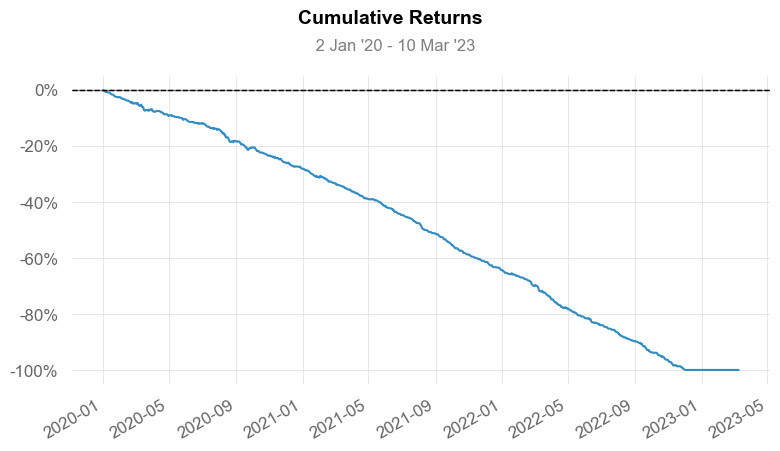

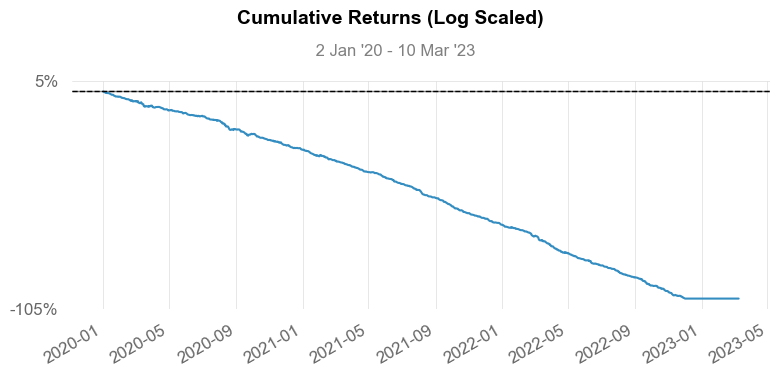

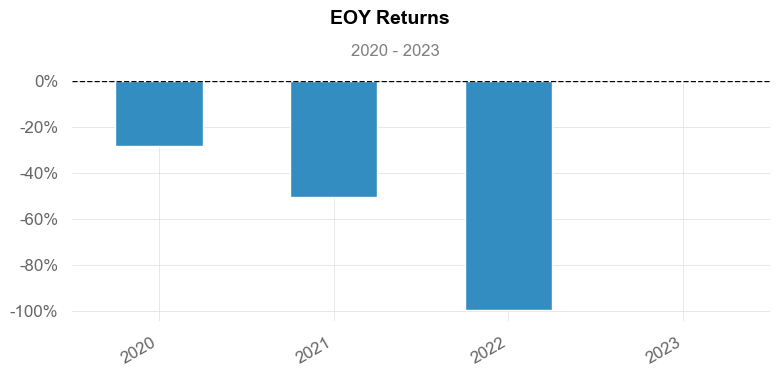

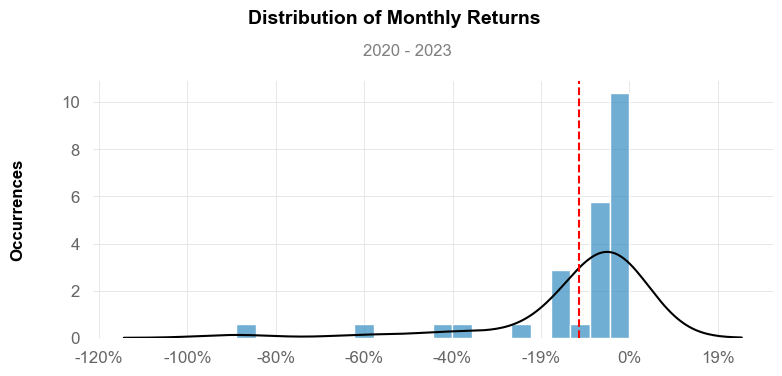

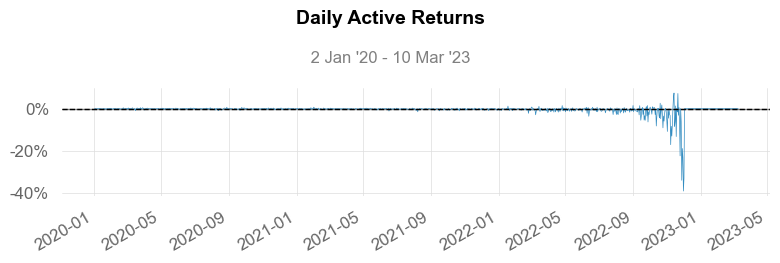

...

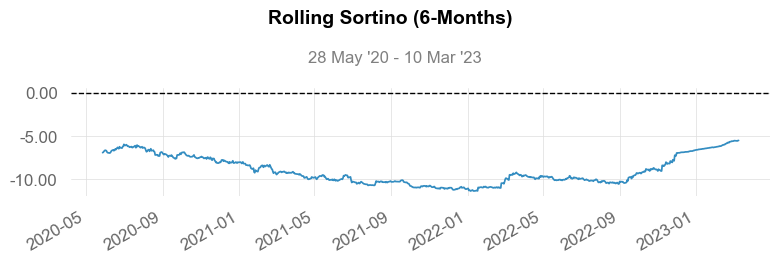

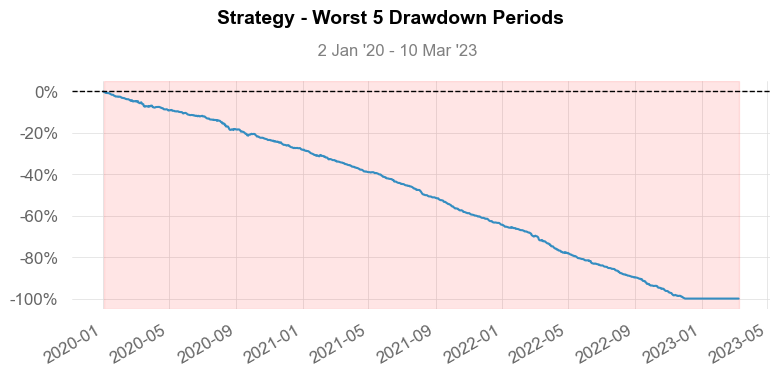

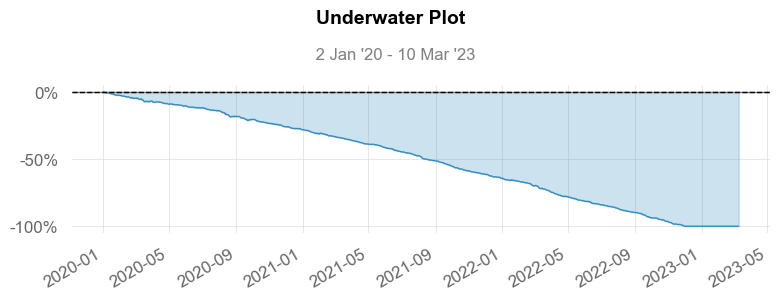

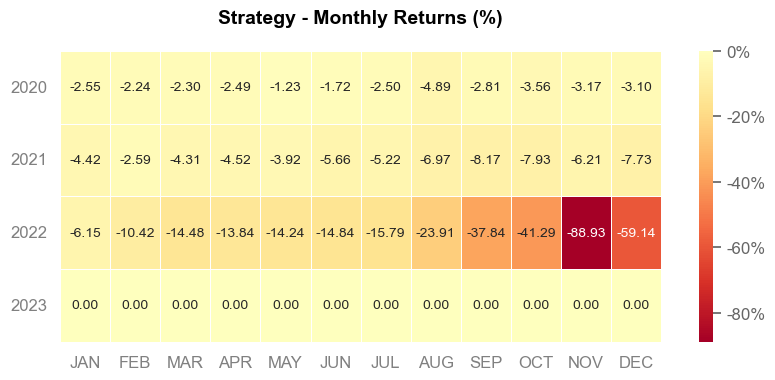

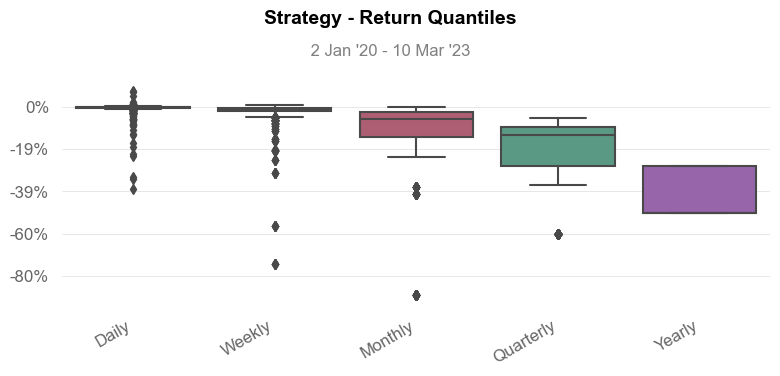

In [33]:
qs.reports.full(result_M15_Out_Sample['Equity'].resample('D').last().dropna().pct_change())

### Reports

### Compare benchmark Buy and Hold In Sample

In [34]:
benchmark_M15_In = benchmark_M15.loc[str(
    result_M15_In_Sample.index[0]):str(result_M15_In_Sample.index[-1])]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2014-09-25   2014-09-25
End Period                 2019-12-31   2019-12-31
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       71.0%

Cumulative Return          3.02%        -99.89%
CAGR﹪                     0.39%        -59.08%

Sharpe                     0.32         -2.95
Prob. Sharpe Ratio         79.65%       0.0%
Smart Sharpe               0.19         -1.69
Sortino                    0.48         -2.9
Smart Sortino              0.27         -1.66
Sortino/√2                 0.34         -2.05
Smart Sortino/√2           0.19         -1.18
Omega                      0.03         0.03

Max Drawdown               -2.46%       -99.89%
Longest DD Days            1074         1923
Volatility (ann.)          1.44%        32.66%
R^2                        0.0          0.0
Information Ratio          -0.19        -0.19
Calmar        

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2014-09-26,2018-06-15,2019-12-31,1923,-99.8904,-99.689918


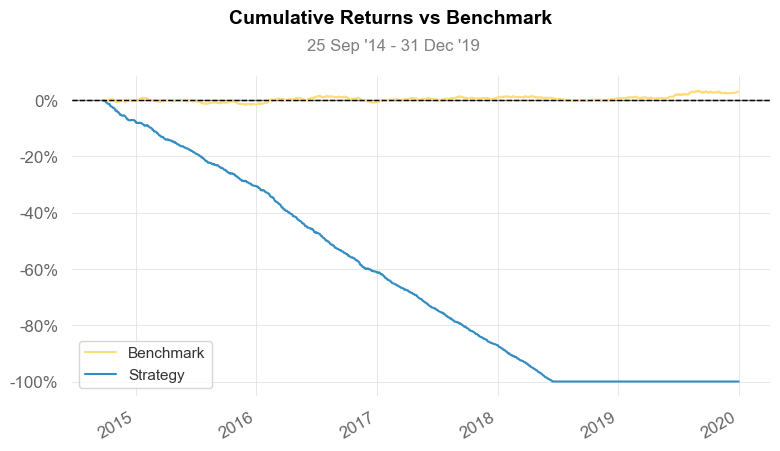

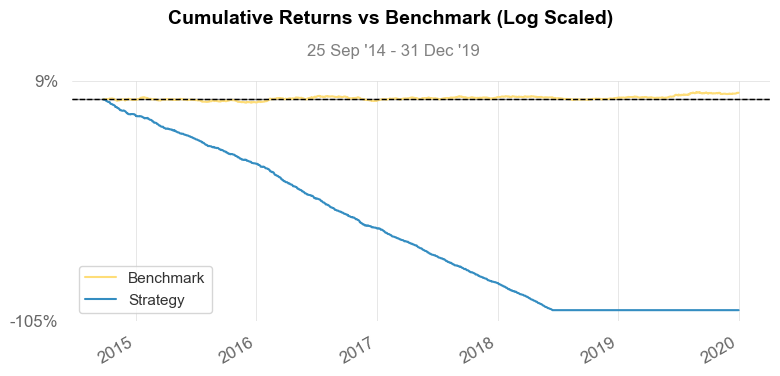

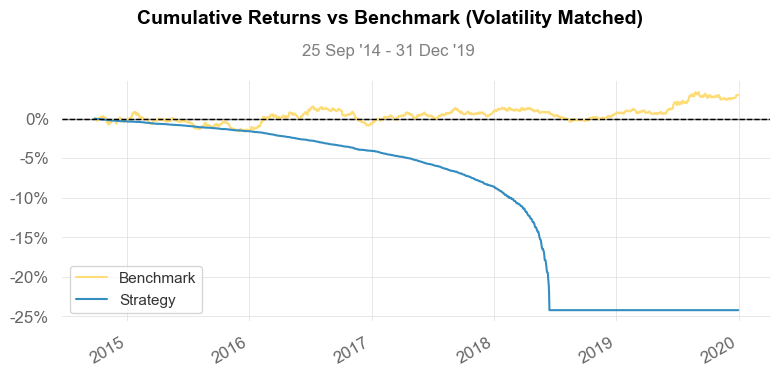

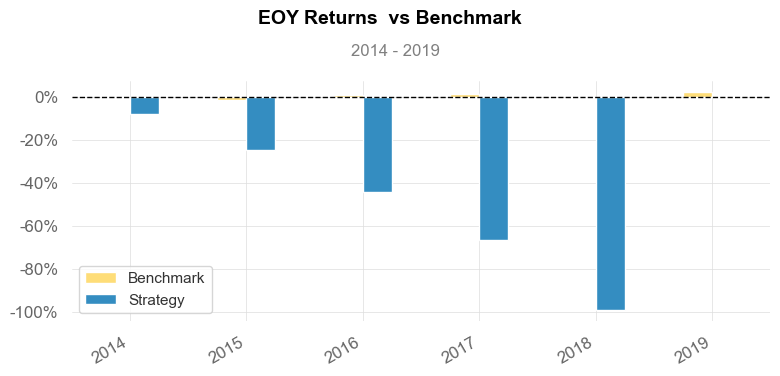

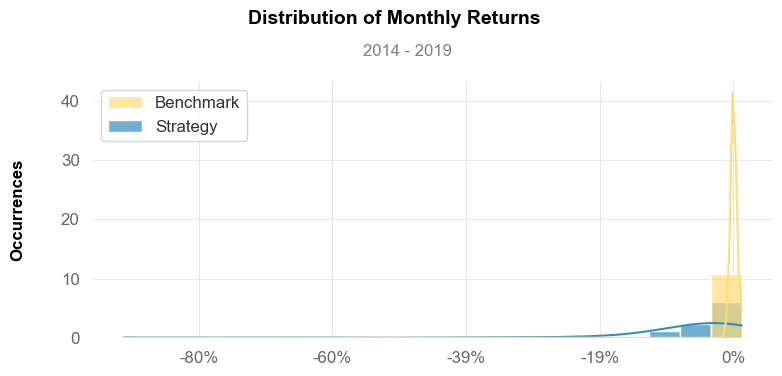

...

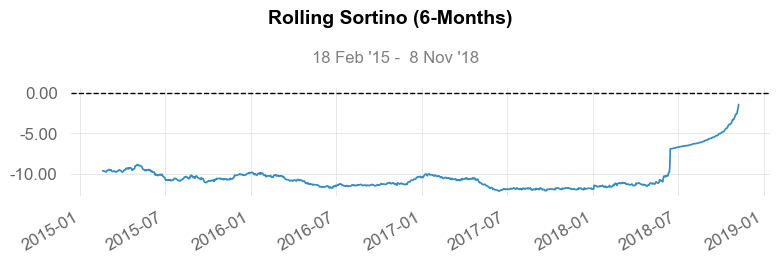

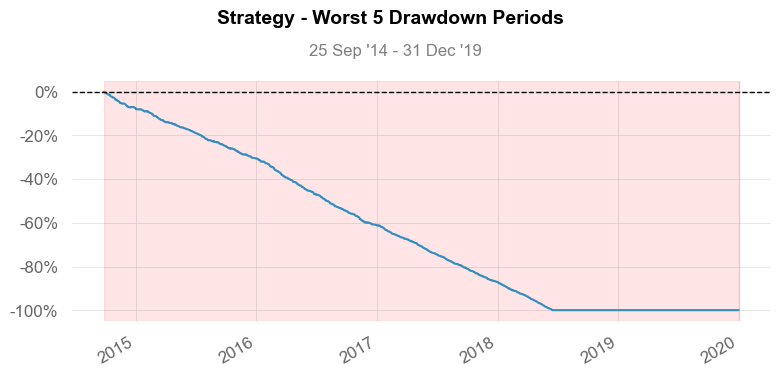

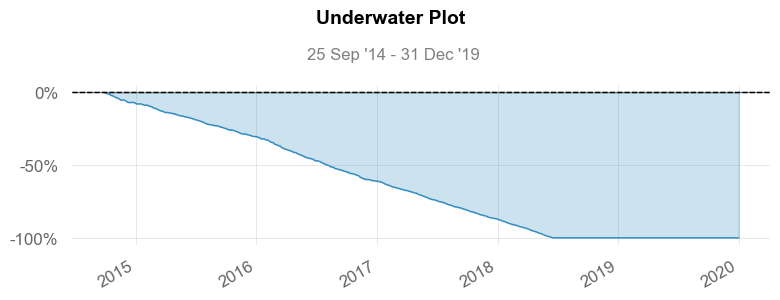

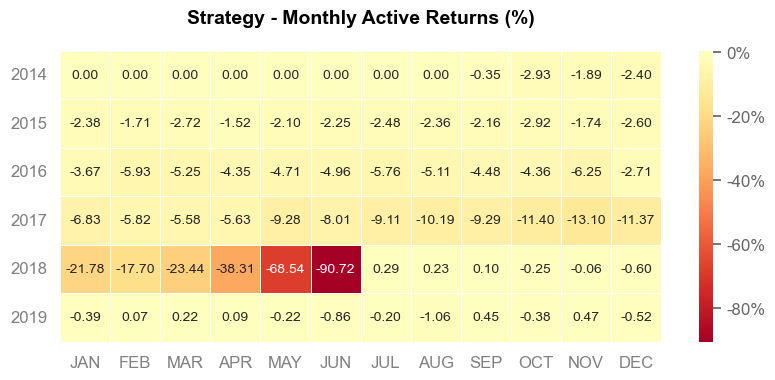

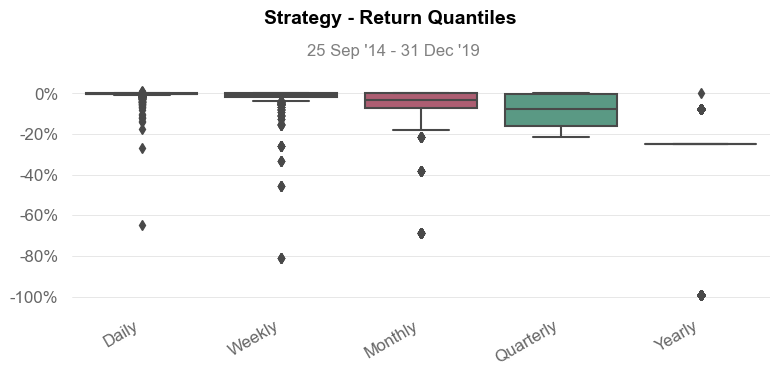

In [35]:
qs.reports.full(result_M15_In_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_M15_In['Equity'].resample('D').last().dropna().pct_change())

### Compare benchmark Buy and Hold Out Sample

In [36]:
benchmark_M15_Out = benchmark_M15.loc[str(
    result_M15_Out_Sample.index[0]):str(result_M15_Out_Sample.index[-1])]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2020-01-03   2020-01-03
End Period                 2023-03-10   2023-03-10
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       92.0%

Cumulative Return          3.26%        -99.83%
CAGR﹪                     0.7%         -74.88%

Sharpe                     0.34         -3.61
Prob. Sharpe Ratio         74.69%       0.0%
Smart Sharpe               0.17         -1.8
Sortino                    0.46         -3.56
Smart Sortino              0.23         -1.78
Sortino/√2                 0.32         -2.52
Smart Sortino/√2           0.16         -1.26
Omega                      0.09         0.09

Max Drawdown               -4.08%       -99.83%
Longest DD Days            946          1161
Volatility (ann.)          2.51%        41.88%
R^2                        0.0          0.0
Information Ratio          -0.23        -0.23
Calmar        

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-01-05,2022-12-02,2023-03-10,1161,-99.828532,-99.744126


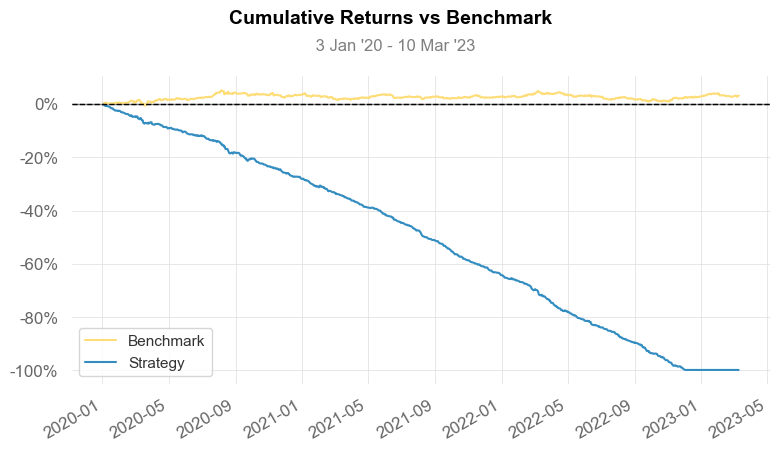

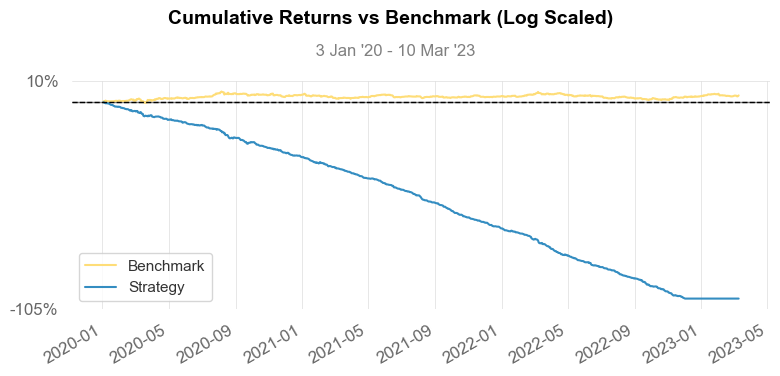

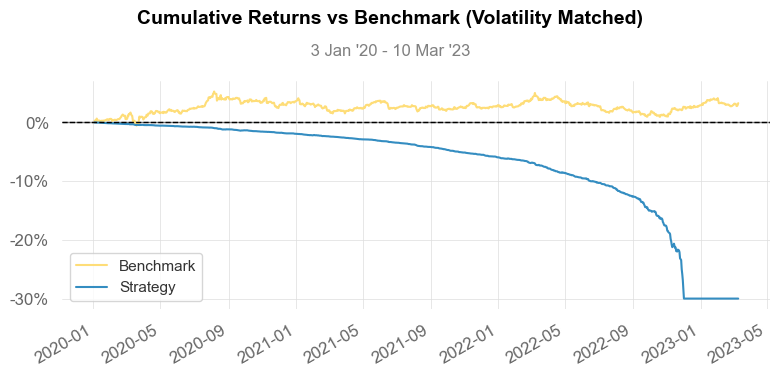

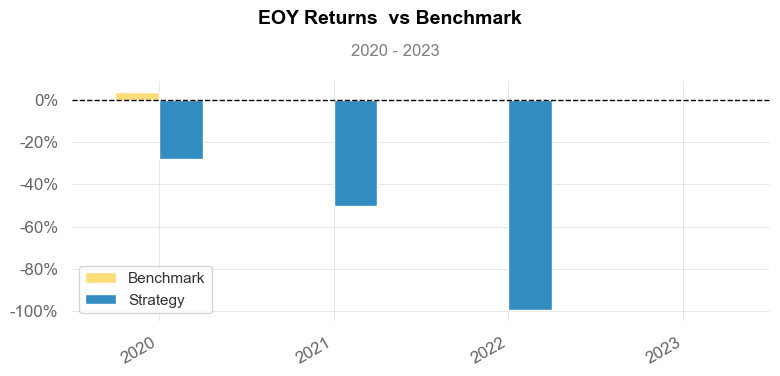

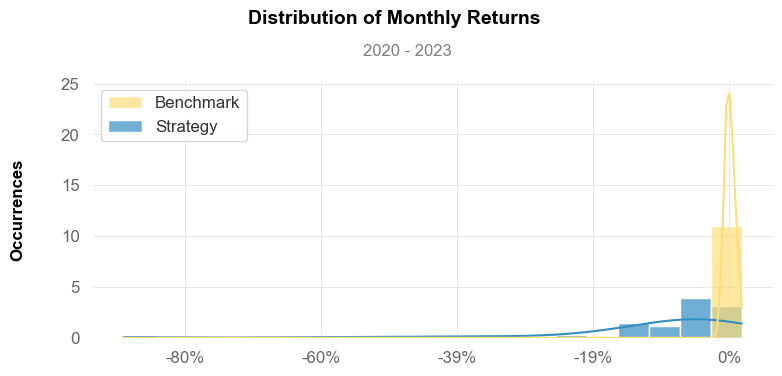

...

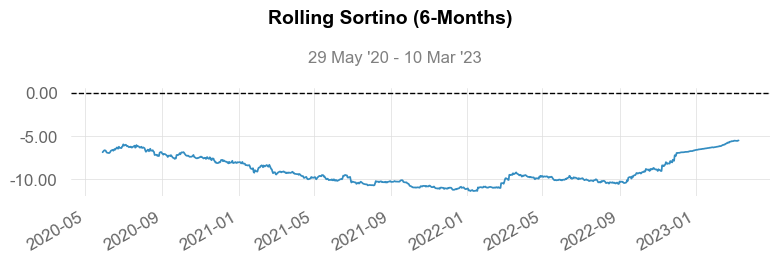

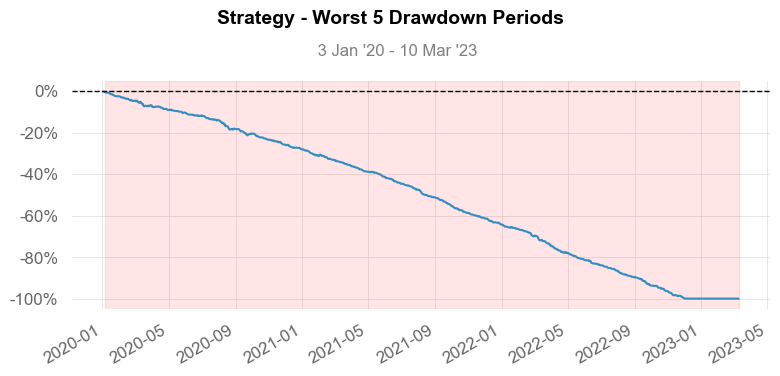

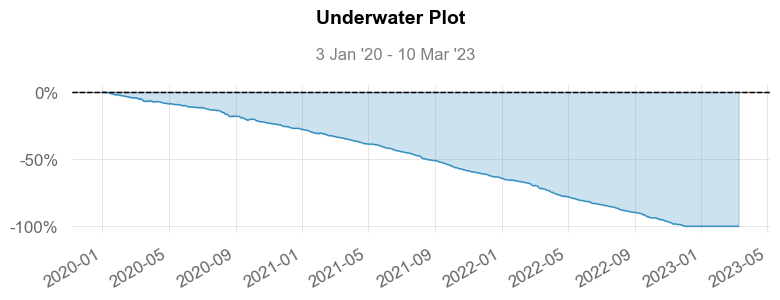

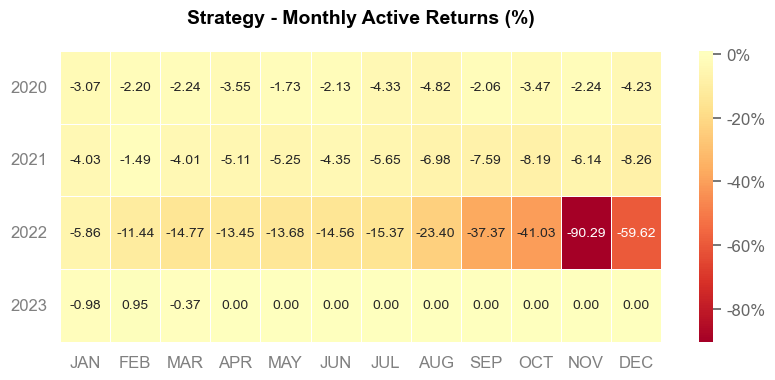

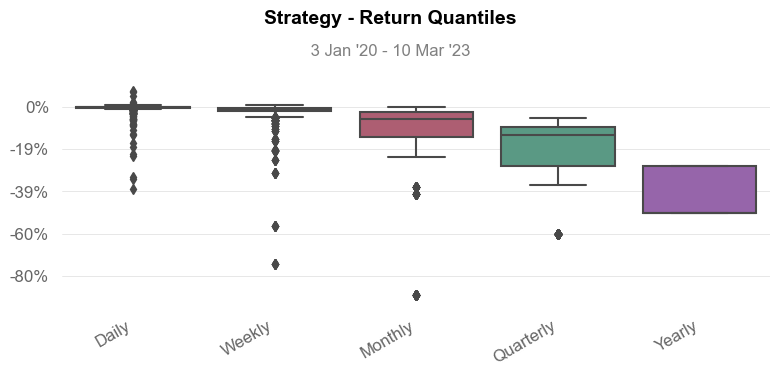

In [37]:
qs.reports.full(result_M15_Out_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_M15_Out['Equity'].resample('D').last().dropna().pct_change())

## TF M5

### In Sample

                           Strategy
-------------------------  ----------
Start Period               2020-05-17
End Period                 2021-08-08
Risk-Free Rate             0.0%
Time in Market             73.0%

Cumulative Return          -100.0%
CAGR﹪                     -100.0%

Sharpe                     -3.89
Prob. Sharpe Ratio         0.0%
Smart Sharpe               -3.18
Sortino                    -3.78
Smart Sortino              -3.09
Sortino/√2                 -2.67
Smart Sortino/√2           -2.18
Omega                      0.0

Max Drawdown               -100.0%
Longest DD Days            448
Volatility (ann.)          110.55%
Calmar                     -1.0
Skew                       -10.79
Kurtosis                   135.19

Expected Daily %           -100.0%
Expected Monthly %         -100.0%
Expected Yearly %          -100.0%
Kelly Criterion            -1639.52%
Risk of Ruin               0.0%
Daily Value-at-Risk        -13.16%
Expected Shortfall (cVaR)  -13.16%

Max C

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-05-18,2021-08-08,2021-08-08,448,-100.0,-99.331991


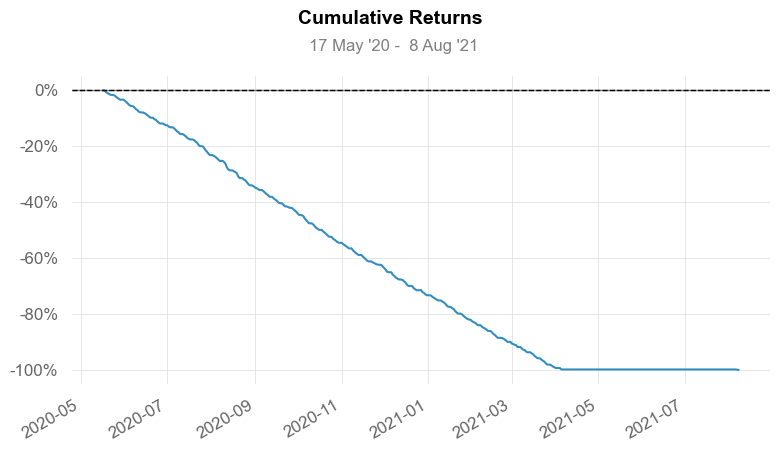

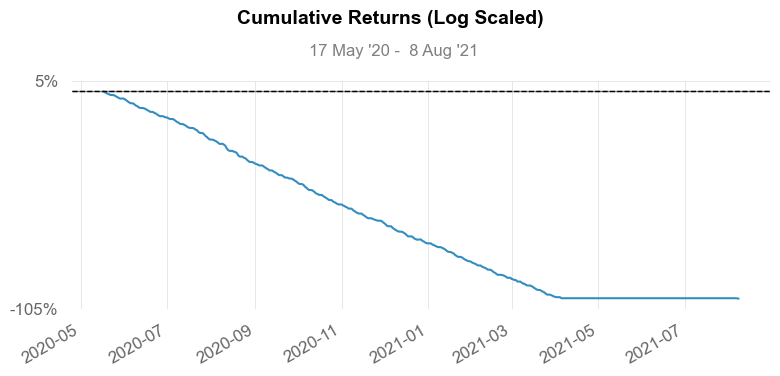

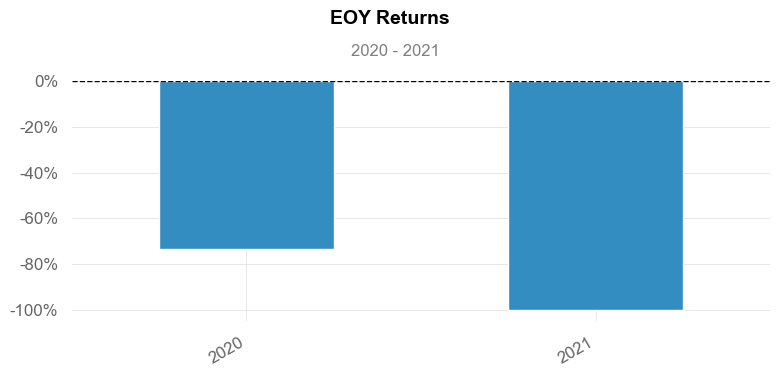

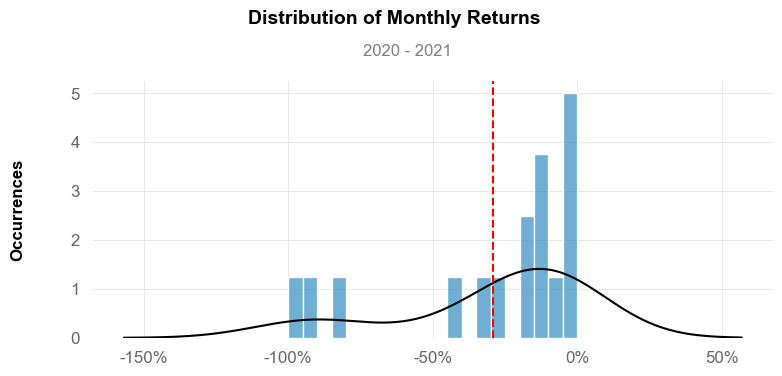

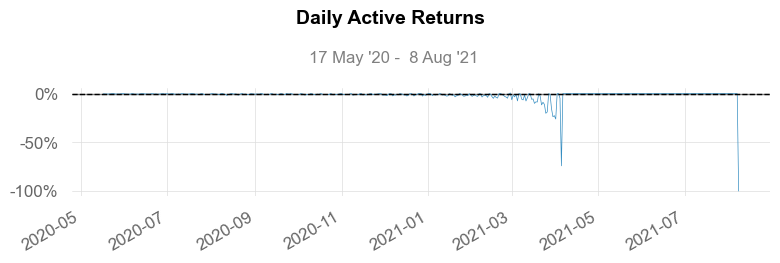

...

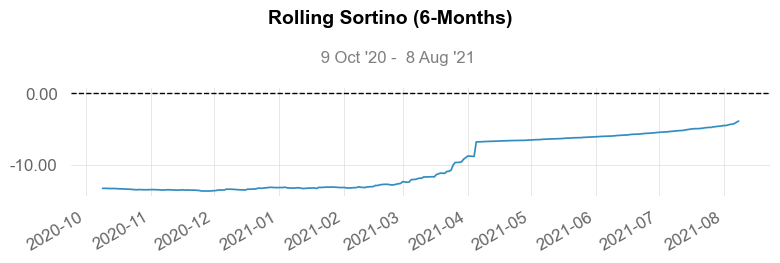

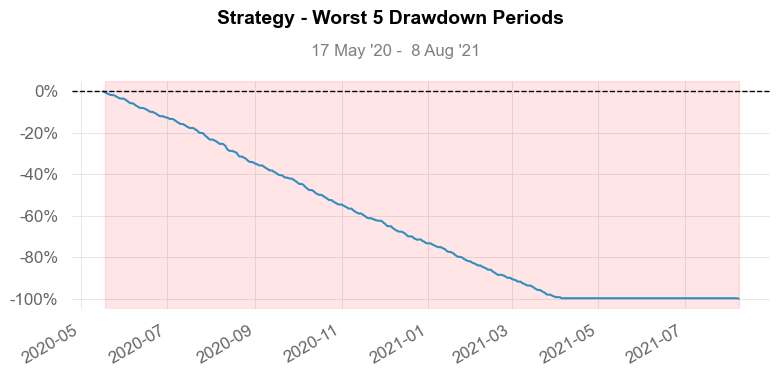

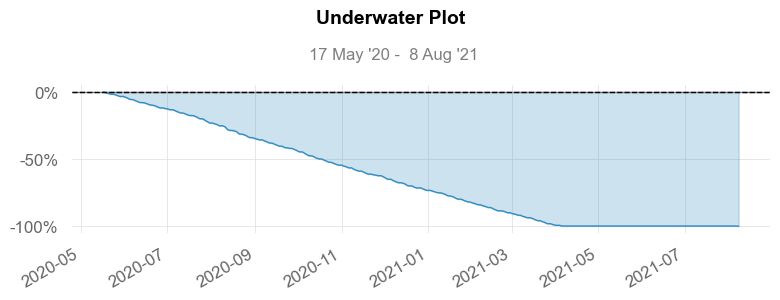

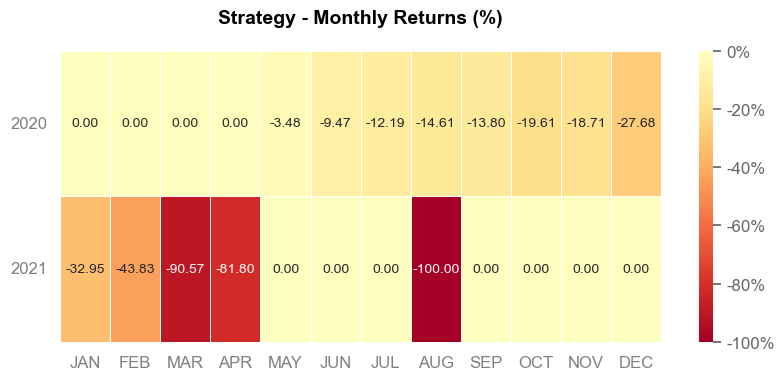

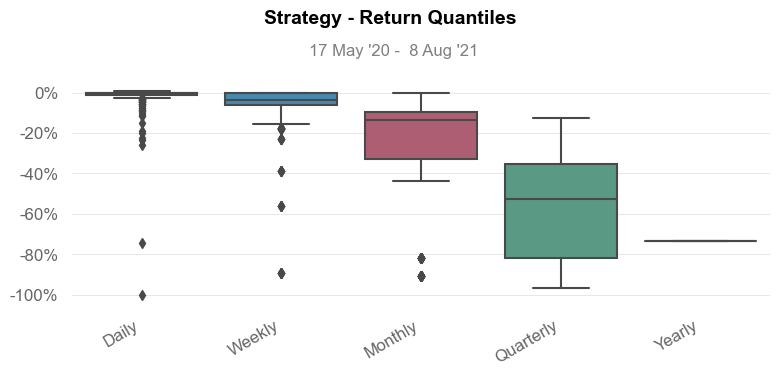

In [38]:
qs.reports.full(result_M5_In_Sample['Equity'].resample('D').last().dropna().pct_change())

### Out Sample

                           Strategy
-------------------------  ----------
Start Period               2023-01-03
End Period                 2023-03-10
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          -24.19%
CAGR﹪                     -65.26%

Sharpe                     -32.86
Prob. Sharpe Ratio         0.0%
Smart Sharpe               -27.36
Sortino                    -14.32
Smart Sortino              -11.92
Sortino/√2                 -10.12
Smart Sortino/√2           -8.43
Omega                      0.0

Max Drawdown               -23.75%
Longest DD Days            66
Volatility (ann.)          3.65%
Calmar                     -2.75
Skew                       0.79
Kurtosis                   -0.04

Expected Daily %           -0.48%
Expected Monthly %         -8.82%
Expected Yearly %          -24.19%
Kelly Criterion            -6997.25%
Risk of Ruin               0.14%
Daily Value-at-Risk        -0.85%
Expected Shortfall (cVaR)  -0.85%

Max Con

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2023-01-04,2023-03-10,2023-03-10,66,-23.745023,-23.232209


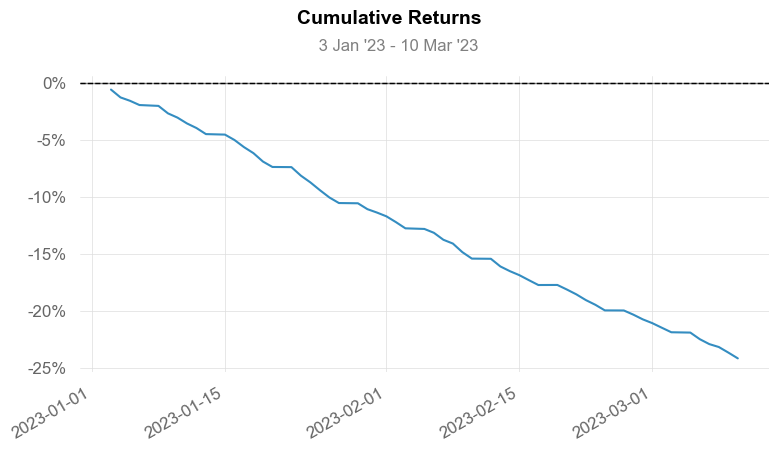

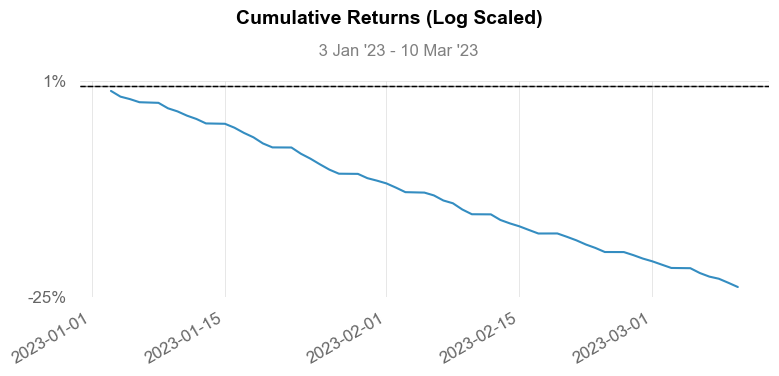

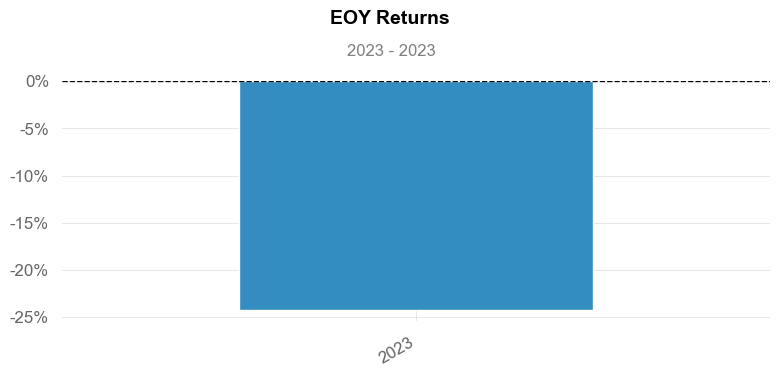

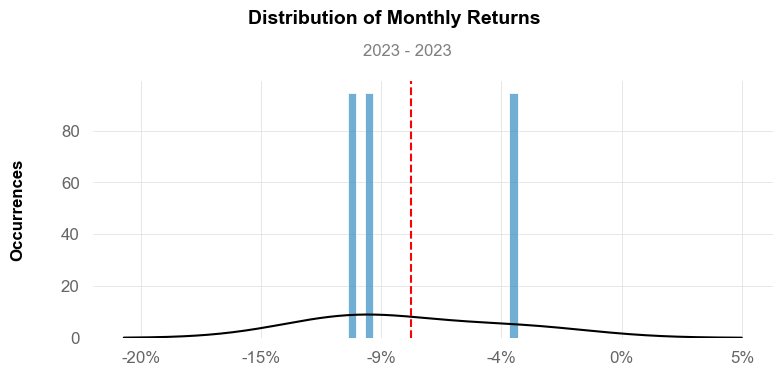

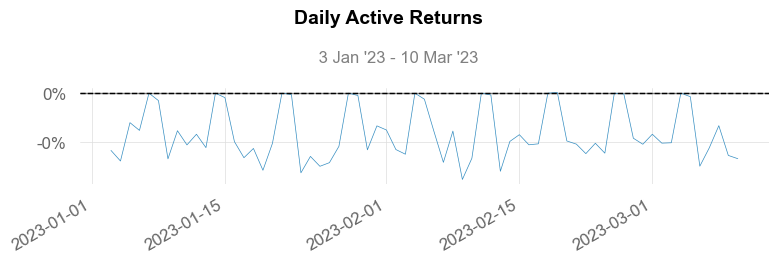

IndexError: index 0 is out of bounds for axis 0 with size 0

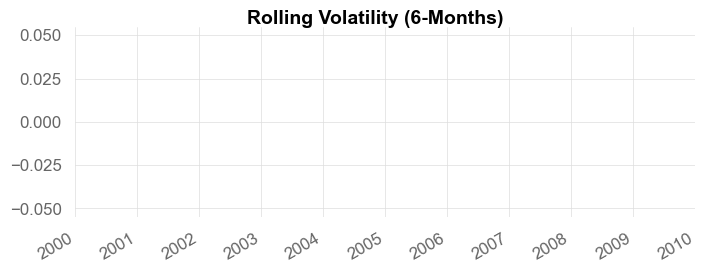

In [39]:
qs.reports.full(result_M5_Out_Sample['Equity'].resample('D').last().dropna().pct_change())

### Reports

### Compare benchmark Buy and Hold In Sample

In [ ]:
benchmark_M5_In = benchmark_M5.loc[str(
    result_M5_In_Sample.index[0]):str(result_M5_In_Sample.index[-1])]

In [ ]:
qs.reports.full(result_M5_In_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_M5_In['Equity'].resample('D').last().dropna().pct_change())

### Compare benchmark Buy and Hold Out Sample

In [ ]:
benchmark_M5_Out = benchmark_M5.loc[str(
    result_M5_Out_Sample.index[0]):str(result_M5_Out_Sample.index[-1])]

In [ ]:
qs.reports.full(result_M5_Out_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_M5_Out['Equity'].resample('D').last().dropna().pct_change())

## TF M1

### In Sample

In [ ]:
qs.reports.full(result_M1_In_Sample['Equity'].resample('D').last().dropna().pct_change())

### Out Sample

In [ ]:
qs.reports.full(result_M1_Out_Sample['Equity'].resample('D').last().dropna().pct_change())

### Reports

### Compare benchmark Buy and Hold In Sample

In [ ]:
benchmark_M1 = benchmark_M1.loc[str(
    result_M1_In_Sample.index[0]):str(result_M1_In_Sample.index[-1])]

In [ ]:
qs.reports.full(result_M1_In_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_M1)

### Compare benchmark Buy and Hold Out Sample

In [ ]:
benchmark_M1_Out = benchmark_M1.loc[str(
    result_M1_Out_Sample.index[0]):str(result_M1_Out_Sample.index[-1])]

In [ ]:
qs.reports.full(result_M1_Out_Sample['Equity'].resample('D').last().dropna().pct_change(), benchmark=benchmark_M1_Out['Equity'].resample('D').last().dropna().pct_change())